# ADVANCED LANE AND VEHICLE DETECTION

In [1]:
import numpy as np 
import glob
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import glob
import time
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
from skimage.feature import hog
from sklearn.model_selection import train_test_split

## VEHICLE DETECTION

### Load Data

In [2]:
# Read in cars and notcars
car_images = glob.glob('vehicles/*/*.png')
cars = []
for image in car_images:
    cars.append(image)

not_car_images = glob.glob('non-vehicles/*/*.png')
notcars = []
for image in not_car_images:
    notcars.append(image)
print("Images Loaded")
print("{} car images and {} non-car images found.".format(len(cars), len(notcars)))

Images Loaded
8792 car images and 8968 non-car images found.


### View Data

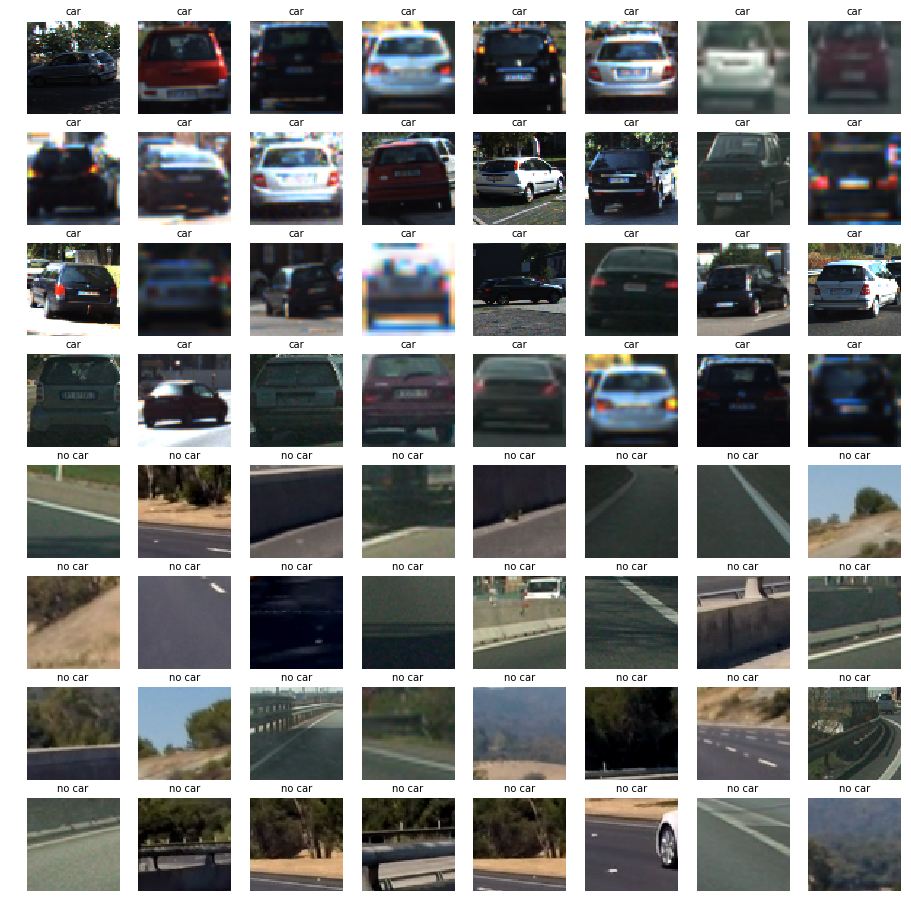

In [3]:
fig, axs = plt.subplots(8,8, figsize=(16, 16))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()

# Step through the list and search for chessboard corners
for i in np.arange(32):
    img = cv2.imread(cars[np.random.randint(0,len(cars))])
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    axs[i].axis('off')
    axs[i].set_title('car', fontsize=10)
    axs[i].imshow(img)
for i in np.arange(32,64):
    img = cv2.imread(notcars[np.random.randint(0,len(notcars))])
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    axs[i].axis('off')
    axs[i].set_title('no car', fontsize=10)
    axs[i].imshow(img)

### Histogram of Orientated Gradients

0.0265350404524
0.0275263957771
You can see the difference in HOGs for YCrCb images of a car and a non-car below:


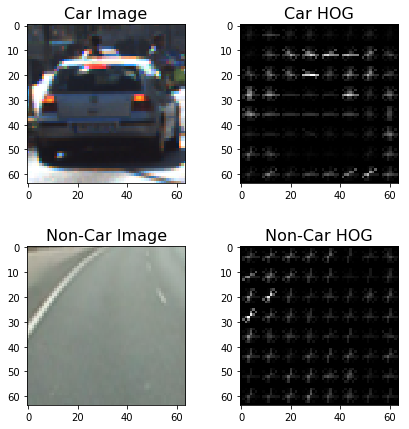

In [59]:
hog_test = True

def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  block_norm = 'L2-Hys', transform_sqrt=True, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       block_norm = 'L2-Hys', transform_sqrt=True, 
                       visualise=vis, feature_vector=feature_vec)
        return features

if hog_test == True:
    r = np.random.randint(0,8000)
    car_imread = cv2.imread(cars[r])
    car_imread = cv2.cvtColor(car_imread, cv2.COLOR_BGR2RGB)
    car_img_t = cv2.cvtColor(car_imread, cv2.COLOR_BGR2YCrCb)
    car_features, car_dst = get_hog_features(car_img_t[:,:,2], 9, 8, 8, vis=True, feature_vec=True)
    noncar_imread = cv2.imread(notcars[r])
    noncar_imread = cv2.cvtColor(noncar_imread, cv2.COLOR_BGR2RGB)
    noncar_img_t = cv2.cvtColor(noncar_imread, cv2.COLOR_BGR2YCrCb)
    noncar_features, noncar_dst = get_hog_features(noncar_img_t[:,:,2], 9, 8, 8, vis=True, feature_vec=True)
    print(car_features.mean())
    print(noncar_features.mean())

    # Visualize 
    f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(7,7))
    f.subplots_adjust(hspace = .4, wspace=.2)
    ax1.imshow(car_imread)
    ax1.set_title('Car Image', fontsize=16)
    ax2.imshow(car_dst, cmap='gray')
    ax2.set_title('Car HOG', fontsize=16)
    ax3.imshow(noncar_imread)
    ax3.set_title('Non-Car Image', fontsize=16)
    ax4.imshow(noncar_dst, cmap='gray')
    ax4.set_title('Non-Car HOG', fontsize=16)
    print('You can see the difference in HOGs for YCrCb images of a car and a non-car below:')

### Spatial Features

You can see the difference in spatial features for YCrCb images of a car and a non-car below:


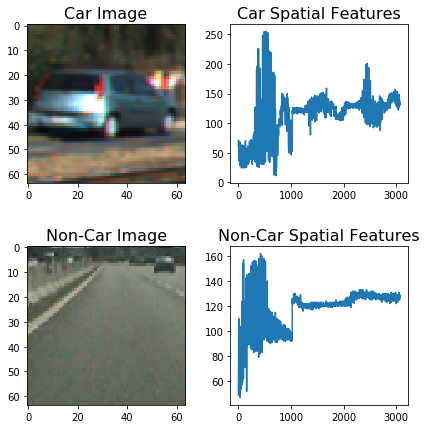

In [58]:
spatial_test = True
   

def bin_spatial(img, color_space='YCrCb', size=(32, 32)):
    # Convert image to new color space (if specified)
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else:
        feature_img = img.copy()
    # Use cv2.resize().ravel() to create the feature vector
    color1 = cv2.resize(img[:,:,0], size).ravel()
    color2 = cv2.resize(img[:,:,1], size).ravel()
    color3 = cv2.resize(img[:,:,2], size).ravel()
    return np.hstack((color1, color2, color3))


if spatial_test == True:
    r = np.random.randint(0,8000)
    car_imread = cv2.imread(cars[r])
    car_imread = cv2.cvtColor(car_imread, cv2.COLOR_BGR2RGB)
    car_img_t = cv2.cvtColor(car_imread, cv2.COLOR_BGR2YCrCb)
    car_bins = bin_spatial(car_img_t)
    noncar_imread = cv2.imread(notcars[r])
    noncar_imread = cv2.cvtColor(noncar_imread, cv2.COLOR_BGR2RGB)
    noncar_img_t = cv2.cvtColor(noncar_imread, cv2.COLOR_BGR2YCrCb)
    noncar_bins = bin_spatial(noncar_img_t)


    # Visualize 
    f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(7,7))
    f.subplots_adjust(hspace = .4, wspace=.2)
    ax1.imshow(car_imread)
    ax1.set_title('Car Image', fontsize=16)
    ax2.plot(car_bins)
    ax2.set_title('Car Spatial Features', fontsize=16)
    ax3.imshow(noncar_imread)
    ax3.set_title('Non-Car Image', fontsize=16)
    ax4.plot(noncar_bins)
    ax4.set_title('Non-Car Spatial Features', fontsize=16)
    print('You can see the difference in spatial features for YCrCb images of a car and a non-car below:')

### Colour Histogram

You can see the difference in colour histograms for YCrCb images of a car and a non-car below:


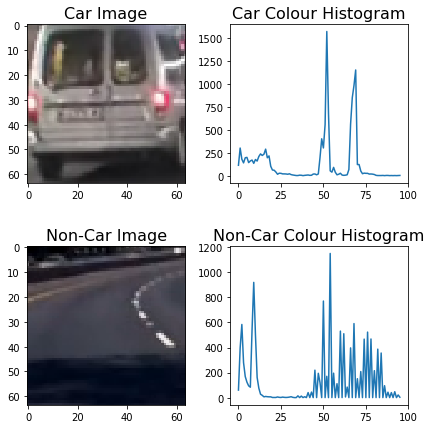

In [56]:
colour_histogram_test = True

def color_hist(img, nbins=32):    #bins_range=(0, 256)
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

if colour_histogram_test == True:
    r = np.random.randint(0,8000)
    car_imread = cv2.imread(cars[r])
    car_imread = cv2.cvtColor(car_imread, cv2.COLOR_BGR2RGB)
    car_img_t = cv2.cvtColor(car_imread, cv2.COLOR_BGR2YCrCb)
    car_hist = color_hist(car_img_t)
    noncar_imread = cv2.imread(notcars[r])
    noncar_imread = cv2.cvtColor(noncar_imread, cv2.COLOR_BGR2RGB)
    noncar_img_t = cv2.cvtColor(noncar_imread, cv2.COLOR_BGR2YCrCb)
    noncar_hist = color_hist(noncar_img_t)


    
    # Visualize 
    f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(7,7))
    f.subplots_adjust(hspace = .4, wspace=.2)
    ax1.imshow(car_imread)
    ax1.set_title('Car Image', fontsize=16)
    ax2.plot(car_hist)
    ax2.set_title('Car Colour Histogram', fontsize=16)
    ax3.imshow(noncar_imread)
    ax3.set_title('Non-Car Image', fontsize=16)
    ax4.plot(noncar_hist)
    ax4.set_title('Non-Car Colour Histogram', fontsize=16)
    print('You can see the difference in colour histograms for YCrCb images of a car and a non-car below:')

### Feature Extraction

In [7]:
# a function to extract features from a list of images
def extract_features(imgs, cspace='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if cspace != 'RGB':
            if cspace == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif cspace == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif cspace == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif cspace == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif cspace == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features            

In [8]:
colorspace = 'YCrCb' # Can be BGR, HSV, LUV, HLS, YUV, YCrCb
orient = 9
pix_per_cell = 8
cell_per_block = 2
hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"

t=time.time()
car_features = extract_features(cars, cspace=colorspace, orient=orient, 
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                        hog_channel=hog_channel)
print("Features extracted from car images")
notcar_features = extract_features(notcars, cspace=colorspace, orient=orient, 
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                        hog_channel=hog_channel)
print("Features extracted from non-car images")
t2 = time.time()
print(round(t2-t, 2), 'Seconds to extract HOG, spatial and colour histogram features...')

pickle.dump(car_features, open("car_features.p", "wb"))
pickle.dump(notcar_features, open("notcar_features.p", "wb"))
print("Features dumped to pickle files.")

C:\Users\User\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:248: skimage_deprecation: Argument `visualise` is deprecated and will be changed to `visualize` in v0.16
  'be changed to `visualize` in v0.16', skimage_deprecation)


Features extracted from car images
Features extracted from non-car images
104.38 Seconds to extract HOG, spatial and colour histogram features...
Features dumped to pickle files.


### Train-Test Split

In [9]:
# Create an array stack of feature vectors
X = np.vstack((car_features, notcar_features)).astype(np.float64)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=rand_state)
    
# Fit a per-column scaler
X_scaler = RobustScaler().fit(X_train)
# Apply the scaler to X
X_train = X_scaler.transform(X_train)
X_test = X_scaler.transform(X_test)

#print('Using:',orient,'orientations',pix_per_cell,
#    'pixels per cell and', cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))
print("Train-test split complete")
print('X_train shape: {}'.format(X_train.shape))
print('y_train shape: {}'.format(y_train.shape))
print('X_test shape: {}'.format(X_test.shape))
print('y_test shape: {}'.format(y_test.shape))

Feature vector length: 8460
Train-test split complete
X_train shape: (14208, 8460)
y_train shape: (14208,)
X_test shape: (3552, 8460)
y_test shape: (3552,)


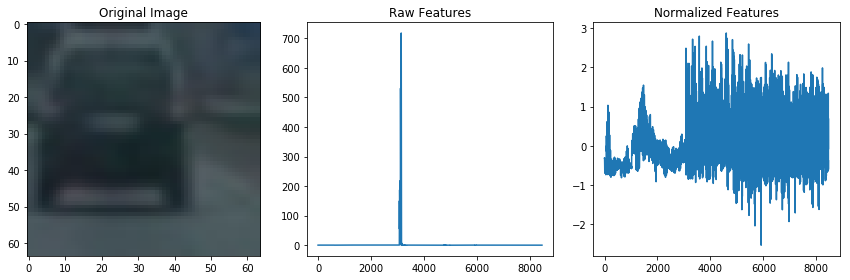

In [10]:
car_ind = np.random.randint(100)
# Plot an example of raw and scaled features
fig = plt.figure(figsize=(12,4))
plt.subplot(131)
car_img = cv2.imread(cars[car_ind])
car_img = cv2.cvtColor(car_img, cv2.COLOR_BGR2RGB)
plt.imshow(car_img)
plt.title('Original Image')
plt.subplot(132)
plt.plot(X[car_ind])
plt.title('Raw Features')
plt.subplot(133)
plt.plot(X_train[car_ind])
plt.title('Normalized Features')
fig.tight_layout()

### Create and Train SVC Classifier

In [11]:
# Use a linear SVC 
svc = LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
# Check the prediction time for a single sample
t=time.time()
n_predict = 10
print('My SVC predicts: ', svc.predict(X_test[0:n_predict]))
print('For these',n_predict, 'labels: ', y_test[0:n_predict])
t2 = time.time()
print(round(t2-t, 5), 'Seconds to predict', n_predict,'labels with SVC')

30.06 Seconds to train SVC...
Test Accuracy of SVC =  0.9935
My SVC predicts:  [ 0.  1.  1.  1.  0.  1.  0.  1.  1.  0.]
For these 10 labels:  [ 0.  1.  1.  1.  0.  1.  0.  1.  1.  0.]
0.00299 Seconds to predict 10 labels with SVC


### Car Searching

In [12]:
def find_cars(img, ystart, ystop, scale, cspace, hog_channel, svc, X_scaler, orient, 
              pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles=False):
    
    # array of rectangles where cars were detected
    rectangles = []
    
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]

    # apply color conversion if other than 'RGB'
    if cspace != 'RGB':
        if cspace == 'HSV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2HSV)
        elif cspace == 'LUV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2LUV)
        elif cspace == 'HLS':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2HLS)
        elif cspace == 'YUV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2YUV)
        elif cspace == 'YCrCb':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2YCrCb)
    else: ctrans_tosearch = np.copy(image)   
    
    # rescale image if other than 1.0 scale
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
    
    # select colorspace channel for HOG 
    if hog_channel == 'ALL':
        ch1 = ctrans_tosearch[:,:,0]
        ch2 = ctrans_tosearch[:,:,1]
        ch3 = ctrans_tosearch[:,:,2]
    else: 
        ch1 = ctrans_tosearch[:,:,hog_channel]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell)+1  #-1
    nyblocks = (ch1.shape[0] // pix_per_cell)+1  #-1 
    nfeat_per_block = orient*cell_per_block**2
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell)-1 
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)   
    if hog_channel == 'ALL':
        hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
        hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            if hog_channel == 'ALL':
                hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
            else:
                hog_features = hog_feat1

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell
            
            ################ ONLY FOR BIN_SPATIAL AND COLOR_HIST ################

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
            
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)
            #print(hog_features.shape)
            #print(spatial_features.shape)
            #print(hist_features.shape)

            # Scale features and make a prediction
            image_features_stacked = np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1)
            #print(image_features_stacked.shape)
            image_features = X_scaler.transform(image_features_stacked)  
            #print(image_features.shape)
            
            ######################################################################
            
            #print('hog_features shape: {}'.format(hog_features.shape))
            #print('hog_features reshaped shape: {}'.format(hog_features.reshape(1,-1).shape))
            test_prediction = svc.predict(image_features)
            #print('test_prediction shape: {}'.format(test_prediction.shape))
            
            if test_prediction == 1 or show_all_rectangles:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                rectangles.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                
    return rectangles

In [13]:
test_img = mpimg.imread('./test_images_vehicle_detection/test1.jpg')
#print(test_img.shape)


ystart = 400
ystop = 650
scale = 1.5
#colorspace = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
#orient = 18
#pix_per_cell = 12
#cell_per_block = 2
#hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"
spatial_size = (32, 32) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins



rectangles = find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles=False)


print(len(rectangles), 'rectangles found in image')

C:\Users\User\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:248: skimage_deprecation: Argument `visualise` is deprecated and will be changed to `visualize` in v0.16
  'be changed to `visualize` in v0.16', skimage_deprecation)


21 rectangles found in image


### Draw Bounding Boxes

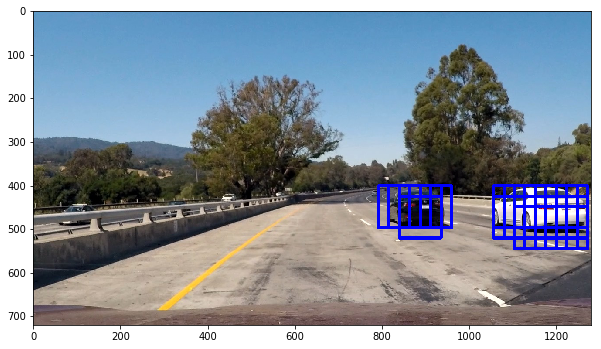

In [14]:
# Here is your draw_boxes function from the previous exercise
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    random_color = False
    # Iterate through the bounding boxes
    for bbox in bboxes:
        if color == 'random' or random_color:
            color = (np.random.randint(0,255), np.random.randint(0,255), np.random.randint(0,255))
            random_color = True
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy

test_img_rects = draw_boxes(test_img, rectangles)
plt.figure(figsize=(10,10))
plt.imshow(test_img_rects)

### Alter Box Size For Varying Vehicle Distance (show_all_rectangles = True)

C:\Users\User\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:248: skimage_deprecation: Argument `visualise` is deprecated and will be changed to `visualize` in v0.16
  'be changed to `visualize` in v0.16', skimage_deprecation)


Number of boxes:  154


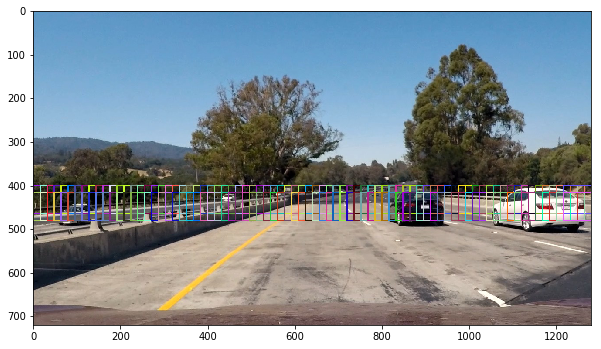

In [15]:
test_img = mpimg.imread('./test_images_vehicle_detection/test1.jpg')

rects = []

ystart = 400
ystop = 464
scale = 1.0
rects.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc, X_scaler, 
                       orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles=True))
ystart = 416
ystop = 480
scale = 1.0
rects.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc, X_scaler, 
                       orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles=True))

rectangles = [item for sublist in rects for item in sublist] 
test_img_rects = draw_boxes(test_img, rectangles, color='random', thick=2)
plt.figure(figsize=(10,10))
plt.imshow(test_img_rects)
print('Number of boxes: ', len(rectangles))

C:\Users\User\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:248: skimage_deprecation: Argument `visualise` is deprecated and will be changed to `visualize` in v0.16
  'be changed to `visualize` in v0.16', skimage_deprecation)


Number of boxes:  100


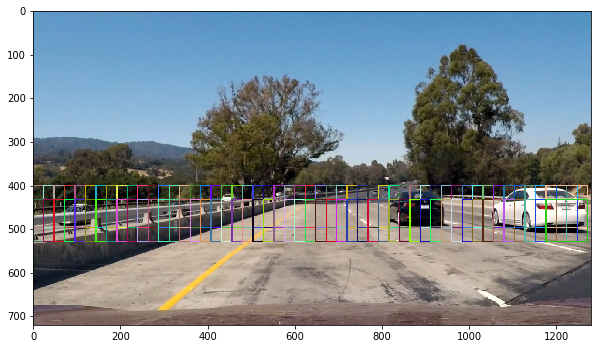

In [16]:
test_img = mpimg.imread('./test_images_vehicle_detection/test1.jpg')

rects = []

ystart = 400
ystop = 496
scale = 1.5
rects.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc, X_scaler, 
                       orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles=True))
ystart = 432
ystop = 528
scale = 1.5
rects.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc, X_scaler, 
                       orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles=True))

rectangles = [item for sublist in rects for item in sublist] 
test_img_rects = draw_boxes(test_img, rectangles, color='random', thick=2)
plt.figure(figsize=(10,10))
plt.imshow(test_img_rects)
print('Number of boxes: ', len(rectangles))

C:\Users\User\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:248: skimage_deprecation: Argument `visualise` is deprecated and will be changed to `visualize` in v0.16
  'be changed to `visualize` in v0.16', skimage_deprecation)


Number of boxes:  74


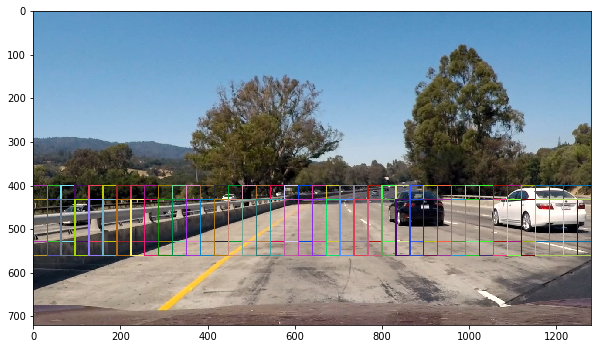

In [17]:
test_img = mpimg.imread('./test_images_vehicle_detection/test1.jpg')

rects = []

ystart = 400
ystop = 528
scale = 2.0
rects.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc, X_scaler, 
                       orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles=True))
ystart = 432
ystop = 560
scale = 2.0
rects.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc, X_scaler, 
                       orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles=True))

rectangles = [item for sublist in rects for item in sublist] 
test_img_rects = draw_boxes(test_img, rectangles, color='random', thick=2)
plt.figure(figsize=(10,10))
plt.imshow(test_img_rects)
print('Number of boxes: ', len(rectangles))

### Combined Search Over Different Regions Of Image

C:\Users\User\Anaconda3\envs\carnd-term1\lib\site-packages\skimage\feature\_hog.py:248: skimage_deprecation: Argument `visualise` is deprecated and will be changed to `visualize` in v0.16
  'be changed to `visualize` in v0.16', skimage_deprecation)


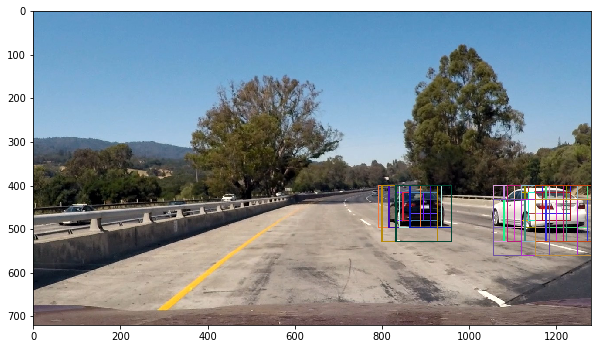

In [18]:
test_img = mpimg.imread('./test_images_vehicle_detection/test1.jpg')

rects = []




ystart = 400
ystop = 464
scale = 1.0
rects.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc, X_scaler, 
                       orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles=False))
ystart = 416
ystop = 480
scale = 1.0
rects.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc, X_scaler, 
                       orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles=False))
ystart = 400
ystop = 496
scale = 1.5
rects.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc, X_scaler, 
                       orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles=False))
ystart = 432
ystop = 528
scale = 1.5
rects.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc, X_scaler, 
                       orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles=False))
ystart = 400
ystop = 528
scale = 2.0
rects.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc, X_scaler, 
                       orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles=False))
ystart = 432
ystop = 560
scale = 2.0
rects.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc, X_scaler, 
                       orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles=False))
ystart = 400
ystop = 596
scale = 3.5
rects.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc, X_scaler, 
                       orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles=False))
ystart = 464
ystop = 660
scale = 3.5
rects.append(find_cars(test_img, ystart, ystop, scale, colorspace, hog_channel, svc, X_scaler, 
                       orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles=False))

# apparently this is the best way to flatten a list of lists
rectangles = [item for sublist in rects for item in sublist] 
test_img_rects = draw_boxes(test_img, rectangles, color='random', thick=2)
plt.figure(figsize=(10,10))
plt.imshow(test_img_rects)

### Bounding Box Heatmap

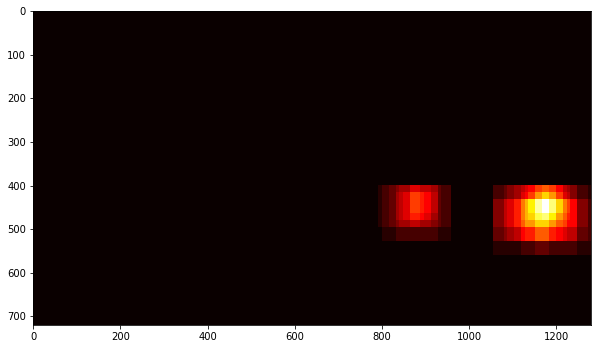

In [19]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap

heatmap_img = np.zeros_like(test_img[:,:,0])
heatmap_img = add_heat(heatmap_img, rectangles)
plt.figure(figsize=(10,10))
plt.imshow(heatmap_img, cmap='hot')

The inequality above forces the heatmap to have MORE than 1 box detect the same vehicle before we accept it.


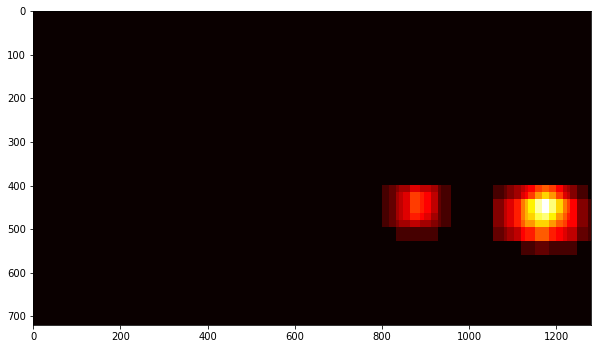

In [20]:
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap
print("The inequality above forces the heatmap to have MORE than 1 box detect the same vehicle before we accept it.")

heatmap_img = apply_threshold(heatmap_img, 1)
plt.figure(figsize=(10,10))
plt.imshow(heatmap_img, cmap='hot')

2 cars found


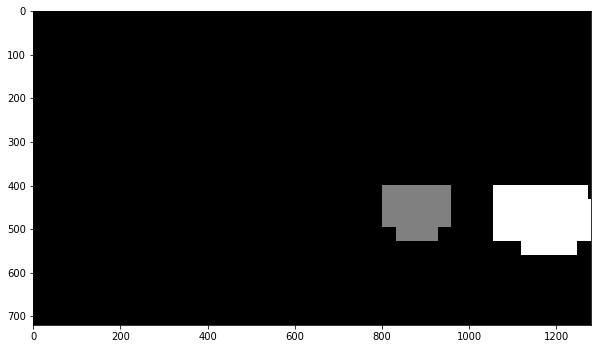

In [21]:
from scipy.ndimage.measurements import label
labels = label(heatmap_img)
plt.figure(figsize=(10,10))
plt.imshow(labels[0], cmap='gray')
print(labels[1], 'cars found')

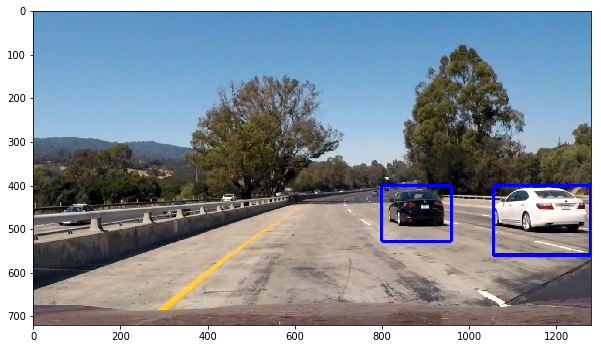

In [22]:
def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    rects = []
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        rects.append(bbox)
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image and final rectangles
    return img, rects

# Draw bounding boxes on a copy of the image
draw_img, rect = draw_labeled_bboxes(np.copy(test_img), labels)
# Display the image
plt.figure(figsize=(10,10))
plt.imshow(draw_img)

### Vehicle Detection Pipeline With History Deque For Smoothing

In [23]:
from collections import deque
history = deque(maxlen = 10)
history.clear() #clear the history deque to remove any rectangles stored from previous cells

def process_frame_with_history(img):

    rects = []
    
    ystart = 400
    ystop = 464
    scale = 1.0
    rects.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc, X_scaler, 
                       orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles=False))
    ystart = 416
    ystop = 480
    scale = 1.0
    rects.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc, X_scaler, 
                       orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles=False))
    ystart = 400
    ystop = 496
    scale = 1.5
    rects.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc, X_scaler, 
                       orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles=False))
    ystart = 432
    ystop = 528
    scale = 1.5
    rects.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc, X_scaler, 
                       orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles=False))
    ystart = 400
    ystop = 528
    scale = 2.0
    rects.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc, X_scaler, 
                       orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles=False))
    ystart = 432
    ystop = 560
    scale = 2.0
    rects.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc, X_scaler, 
                       orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles=False))
    ystart = 400
    ystop = 596
    scale = 3.5
    rects.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc, X_scaler, 
                       orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles=False))
    ystart = 464
    ystop = 660
    scale = 3.5
    rects.append(find_cars(img, ystart, ystop, scale, colorspace, hog_channel, svc, X_scaler, 
                       orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles=False))
 
    rectangles = [item for sublist in rects for item in sublist] 
    print(len(rectangles))
    

    heat = np.zeros_like(img[:,:,0]).astype(np.float)
    # Add heat to each box in box list
    current_heatmap = add_heat(heat, rectangles)


    
    # Visualize the heatmap when displaying    
    #current_heatmap = np.clip(heat, 0, 255)
    history.append(current_heatmap)
    
    heatmap = np.zeros_like(current_heatmap).astype(np.float)
    for contribution in history:
        heatmap = heatmap + contribution

    # Apply threshold to help remove false positives
    threshold = 7
    overall_heatmap = apply_threshold(heatmap, threshold)
    print("image shape: {}".format(img.shape))
    print("overall_heatmap shape: {}".format(overall_heatmap.shape))
    # Find final boxes from heatmap using label function
    labels = label(overall_heatmap)
    draw_img, rect = draw_labeled_bboxes(np.copy(img), labels)
        
    # Visual heatmap (not used for algorithm but needs to be 3 channels for display on final video which is in colour)
    image_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    hot_uint8 = np.uint8(overall_heatmap)
    heatmap_rgb = np.stack((hot_uint8, np.zeros_like(current_heatmap), np.zeros_like(current_heatmap)), axis=-1)
    heatmap_hsv = cv2.cvtColor(np.uint8(heatmap_rgb), cv2.COLOR_RGB2HSV)
    
    alpha = 0.6 #transparency
    image_hsv[..., 0] = heatmap_hsv[..., 0]
    image_hsv[..., 1] = heatmap_hsv[..., 1] * alpha

    visual_heatmap = cv2.cvtColor(image_hsv, cv2.COLOR_HSV2RGB)
    
    
    return draw_img, visual_heatmap

## LANE DETECTION

## Remove camera distortion

In [24]:
undistort_test = False

#Callibration function is a bottleneck so only call once and pickle camera matrix and distortion vectors
#Create a undistort function that loads these from pickle. That way we can quickly undistort images within the video
mtx=pickle.load(open("mtx.p", "rb"))
dist=pickle.load(open("dist.p", "rb"))
def undistort_image(img, mtx=mtx, dist=dist):
	undist = cv2.undistort(img, mtx, dist, None, mtx)
	return undist

if undistort_test == True:
	#Test that undistorting works on the example images of cars
	#See effect around edges e.g. white car on right and car on left in opposite direction
	print("Preparing sample image for distortion removal...")
	img = cv2.imread('./test_images/test1.jpg')
	img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
	dst = undistort_image(img)

	# #Plot original camera image (distorted) next to the calibrated (undistorted) image
	f, (ax1, ax2) = plt.subplots(1, 2, figsize = (24, 9))
	f.tight_layout()
	ax1.imshow(img)
	ax1.set_title('Original Image', fontsize = 50)
	ax2.imshow(dst)
	ax2.set_title('Undistorted Image', fontsize = 50)
	plt.subplots_adjust(left=0., right = 1, top=0.9, bottom=0.)
	plt.savefig('test1_undistort.png')
	plt.show()
	print('You can observe the effect of undistort_image in test1_undistort.jpg')


## Create binary image

test1 image loaded from disc


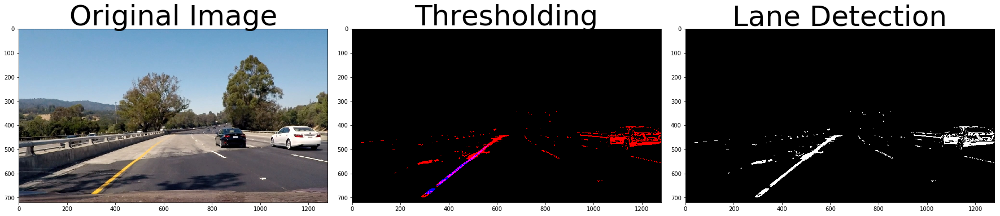

You can observe the lane detection in test1_thresh.png


In [25]:
binary_test = True

def channel_Isolate(image,channel):
    ## Takes in only RBG images
    if (channel == 'R'):
        return image[:,:,0]
    
    elif (channel == 'G'):
        return image[:,:,1]
    
    elif (channel == 'B'):
        return image[:,:,2]
    
    elif (channel == 'H'):
        HSV = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        return HSV[:,:,0]
    
    elif (channel == 'S'):
        HSV = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        return HSV[:,:,1]
        
    elif (channel == 'V'):
        HSV = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        return HSV[:,:,2]
        
    elif (channel == 'L'):
        HLS = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
        return HLS[:,:,1]
    
    elif (channel == 'Cb'):
        YCrCb = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        return YCrCb[:,:,2]
    
    elif (channel == 'U'):
        LUV = cv2.cvtColor(image, cv2.COLOR_RGB2Lab)
        return LUV[:,:,2]
    
    else:
        raise Error("Channel must be either R, G, B, H, S, V, L, Cb, U")
    
def threshold_Channel(channel,thresh):
    retval, binary = cv2.threshold(channel.astype('uint8'), thresh[0], thresh[1], cv2.THRESH_BINARY)
    return binary

def bin_it(image, threshold):
	output_bin = np.zeros_like(image)
	output_bin[(image >= threshold[0]) & (image <= threshold[1])] = 1
	return output_bin

def binary_image_creation(image, already_undistorted, s_thresh=(180,255), sx_thresh=(20,100)):
	if already_undistorted == False:
		undist = undistort_image(image)
		#print("Lens distortion removed from image")
	else:
		undist = image
	img = np.copy(undist)


    
	#Convert to HLS colour space and isolate the L and S channels
	hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
	l_channel = hls[:,:,1]
	s_channel = hls[:,:,2]

	#Gradient thresholding is done on L channel
	sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) #Take hte derivative in x (better for detecting vertical structures e.g. lane lines)
	abs_sobelx = np.absolute(sobelx) #Absolute x derivative accentuates lines away from horizontal
	scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

	#Threshold x gradient and map onto a copy of image that will be presented in one layer of final mask
	sxbinary = np.zeros_like(scaled_sobel)
	sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
	#print("Gradient thresholding complete")

	#Threshold color channel is done on S channel and map onto a copy of image that will be presented in one layer of final mask
	s_binary = np.zeros_like(s_channel)
	s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
	#Red thresholding is robust against shadows
	red = img[:,:,0]
	red_thresh = np.zeros_like(red)
	red_thresh[(red > 215) & (red < 255)] = 1
    
	#rgb threshold for white
	bin_thresh = [20,255]
	lower = np.array([225,180,0],dtype="uint8")
	upper = np.array([255,255,170],dtype="uint8")
	mask = cv2.inRange(img, lower, upper)    
	rgb_w = cv2.bitwise_and(img, img, mask=mask).astype(np.uint8)
	rgb_w=cv2.cvtColor(rgb_w, cv2.COLOR_RGB2GRAY)
	rgb_w = bin_it(rgb_w, bin_thresh)
    
	#hls threshold for yellow
	bin_thresh = [20,255]
	lower = np.array([20,120,80],dtype="uint8")
	upper = np.array([45,200,255],dtype="uint8")
	mask = cv2.inRange(hls, lower, upper)    
	hls_y = cv2.bitwise_and(img, img, mask=mask).astype(np.uint8)
	hls_y = cv2.cvtColor(hls_y, cv2.COLOR_HLS2RGB)
	hls_y = cv2.cvtColor(hls_y, cv2.COLOR_RGB2GRAY)
	hls_y = bin_it(hls_y, bin_thresh)   
    
    
	#alternative thresholding approach
	l_channel_of_luv = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)[:,:,2]
	b_channel_of_lab = cv2.cvtColor(image, cv2.COLOR_RGB2Lab)[:,:,2]
	l_min = 185
	l_max = 255
	l_binary = np.zeros_like(l_channel_of_luv)
	l_binary[(l_channel_of_luv >= l_min) & (l_channel_of_luv <= l_max)] = 1
	b_min = 55
	b_max = 255
	b_binary = np.zeros_like(b_channel_of_lab)
	b_binary[(b_channel_of_lab >= b_min) & (b_channel_of_lab >= b_max)] = 1
	combined_binary = np.zeros_like(b_binary)
	combined_binary[(l_binary == 1) | (s_channel == 1)] = 1
    
	#Stack the different masks into different channels of an RGB image. This is just for visual effect.
	color_binary = np.dstack((red_thresh, np.zeros_like(rgb_w), l_binary)) *255
	#print("Thresholding results displayed in color_binary. Green shows gradient thresholding and blue shows colour thresholding.")

	#Stack the different masks into the same channel. This grayscale image is what we actually use
	overall_binary = cv2.cvtColor(color_binary, cv2.COLOR_RGB2GRAY)
	overall_binary[ overall_binary > 0] =255
	#print("Grayscale mask created. Activated pixels show potential regions identified using EITHER gradient OR colour thresholding")

	return overall_binary, color_binary

	print("can change l_binary for sx_binary")


if binary_test == True:
	image = cv2.imread('./test_images/test4.jpg')
	image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
	print("test1 image loaded from disc")
	thresh_gray, thresh_colour = binary_image_creation(image, already_undistorted = False)

	#Plot original camera image (distorted) next to the calibrated (undistorted) image
	f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (24, 9))
	f.tight_layout()
	ax1.imshow(image)
	ax1.set_title('Original Image', fontsize = 50)
	ax2.imshow(thresh_colour)
	ax2.set_title('Thresholding', fontsize = 50)
	ax3.imshow(thresh_gray, cmap='gray')
	ax3.set_title('Lane Detection', fontsize = 50)
	plt.subplots_adjust(left=0., right = 1, top=0.9, bottom=0.)
	plt.savefig('test1_thresh.png')
	plt.show()
	print('You can observe the lane detection in test1_thresh.png')

## Region Masking

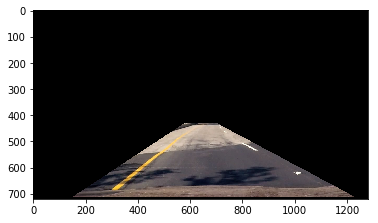

In [26]:
masking_test = True

def region_of_interest(img, vertices):
    mask = np.zeros_like(img)
    
    if len(img.shape) > 2:
        channel_count = img.shape[2]
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

if masking_test == True:
    image = cv2.imread('./test_images/test4.jpg')
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    imshape = image.shape
    new_vertices = np.array([[(150, int(imshape[0]*0.99)), (int(imshape[1]*0.45), int(imshape[0]*0.6)), (int(imshape[1]*0.55), int(imshape[0]*0.6)), (imshape[1]-50, int(imshape[0])*0.99)]], dtype=np.int32)
    masked_image = region_of_interest(image, new_vertices)
    plt.imshow(masked_image)
    plt.savefig('test1_mask.png')

## Bird's Eye: Perspective Transform

test1 image loaded from disc
Image warp takes place before polygon drawn on original image thus avoiding blurred box in bird's eye image
Lane line polygon drawn on original image after warped image completed


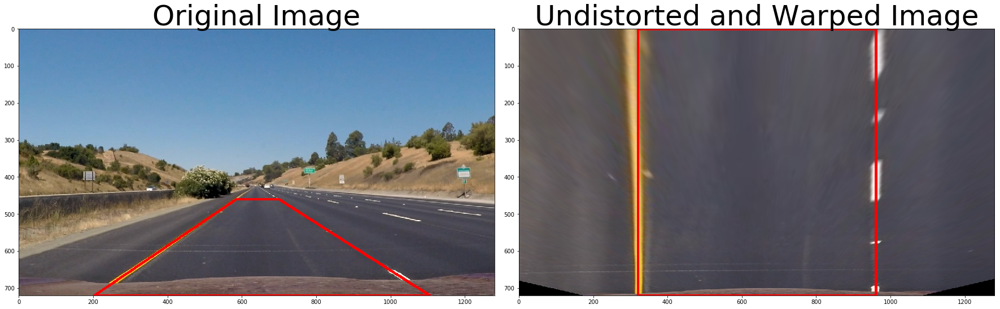

You can observe the undistorted and warped image in test1_undistorted_and_warped.png


In [27]:
perspective_test = True

def birds_eye_existing_matrix(image, already_undistorted, source_vert, draw_lines):
    assert len(source_vert) == 4
    #print("Vertices of rectangular region have been loaded")
    if already_undistorted == False:
        undist = undistort_image(image)
        #print("Lens distortion removed from image")
    else:
        undist = image
    gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
    img_size = (gray.shape[1], gray.shape[0])
    offset = 300
    #destination_vert = np.float32( [[offset, img_size[1]], [offset, 0], [img_size[0]-offset, 0], [img_size[0]-offset, img_size[1]] ])
    destination_vert = np.float32([[(img_size[0]/4),0], [(img_size[0]/4), img_size[1]], [(img_size[0]*3/4), img_size[1]], [(img_size[0]*3/4), 0]])
    M_warp = pickle.load(open("M_warp.p", "rb"))
    #print("Warp matrix loaded from existing pickle file")
    warped = cv2.warpPerspective(undist, M_warp, img_size)
    if draw_lines == True:
        cv2.polylines(warped, [destination_vert.astype(int).reshape((-1,1,2))], True, (255,0,0), 6)
    #print("Perpsective changed to bird's eye view")
    return warped, M_warp

def birds_eye_gray_existing_matrix(image, already_undistorted, source_vert):
    assert len(source_vert) == 4
    #print("Vertices of rectangular region have been loaded")
    if already_undistorted == False:
        undist = undistort_image(image)
        #print("Lens distortion removed from image")
    else:
        undist = image
    #image is already grayscale so no need to first convert to get img_size as we do above for colour case
    img_size = (image.shape[1], image.shape[0])
    offset = 300
    #destination_vert = np.float32( [[offset, img_size[1]], [offset, 0], [img_size[0]-offset, 0], [img_size[0]-offset, img_size[1]] ])
    destination_vert = np.float32([[(img_size[0]/4),0], [(img_size[0]/4), img_size[1]], [(img_size[0]*3/4), img_size[1]], [(img_size[0]*3/4), 0]])
    M_warp = pickle.load(open("M_warp.p", "rb"))
    #print("Warp matrix loaded from existing pickle file")
    warped = cv2.warpPerspective(undist, M_warp, img_size)
    #print("Perpsective changed to bird's eye view")
    return warped, M_warp

if perspective_test == True:
	image = cv2.imread('./test_images/straight_lines1.jpg')
	image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
	gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
	img_size = (gray.shape[1], gray.shape[0])
	src_vert = np.float32([[(img_size[0]/2)-55, (img_size[1]/2)+100], [(img_size[0]/6)-10, img_size[1]], [(img_size[0]*5/6)+40, img_size[1]], [(img_size[0]/2)+60, (img_size[1]/2)+100] ])
	print("test1 image loaded from disc")
	#warped = birds_eye(image, already_undistorted = False, source_vert = np.float32([ [300, 675], [600, 460], [720, 460], [1085, 675] ]))[0]
	warped = birds_eye_existing_matrix(image, already_undistorted = False, source_vert = src_vert, draw_lines = True)[0]
	print("Image warp takes place before polygon drawn on original image thus avoiding blurred box in bird's eye image")
	cv2.polylines(image, [src_vert.astype(int).reshape((-1,1,2))], True, (255,0,0), 6)
	print("Lane line polygon drawn on original image after warped image completed")
	#Plot original camera image (distorted) next to the calibrated (undistorted) image
	f, (ax1, ax2) = plt.subplots(1, 2, figsize = (24, 9))
	f.tight_layout()
	ax1.imshow(image)
	ax1.set_title('Original Image', fontsize = 50)
	ax2.imshow(warped)
	ax2.set_title('Undistorted and Warped Image', fontsize = 50)
	plt.subplots_adjust(left=0., right = 1, top=0.9, bottom=0.)
	plt.savefig('test1_undistorted_and_warped.png')
	plt.show()
	print('You can observe the undistorted and warped image in test1_undistorted_and_warped.png')

## Full Image Transformation

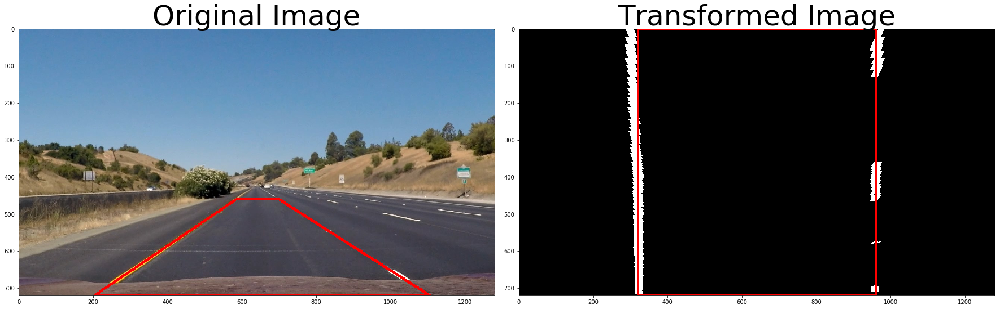

You can observe the undistorted, thresholded and warped image in test1_transformed.png


In [28]:
transformation_test = True

#First we will apply the above three processes to get a binary bird's eye image without distortion
if transformation_test == True:
	image = cv2.imread('./test_images/straight_lines1.jpg')
	image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
	gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
	img_size = (gray.shape[1], gray.shape[0])
	src_vert = np.float32([[(img_size[0]/2)-55, (img_size[1]/2)+100], [(img_size[0]/6)-10, img_size[1]], [(img_size[0]*5/6)+40, img_size[1]], [(img_size[0]/2)+60, (img_size[1]/2)+100] ])
	undist = undistort_image(image)
	thresh_gray = binary_image_creation(undist, already_undistorted = True)[0]
	birds_eye = birds_eye_gray_existing_matrix(thresh_gray, already_undistorted = True, source_vert = src_vert)[0]
	birds_eye = np.dstack(( birds_eye, birds_eye, birds_eye)) #convert from GRAY to RGB so can display red bounding box ontop of gray image
	birds_eye[birds_eye > 0] = 255
	cv2.polylines(image, [src_vert.astype(int).reshape((-1,1,2))], True, (255,0,0), 6)
	destination_vert = np.float32([[(img_size[0]/4),0], [(img_size[0]/4), img_size[1]], [(img_size[0]*3/4), img_size[1]], [(img_size[0]*3/4), 0]])
	cv2.polylines(birds_eye, [destination_vert.astype(int).reshape((-1,1,2))], True, (255,0,0), 6)


	#Plot original camera image (distorted) next to the bird's eye view of undistorted and thresholded image
	f, (ax1, ax2) = plt.subplots(1, 2, figsize = (24, 9))
	f.tight_layout()
	ax1.imshow(image)
	ax1.set_title('Original Image', fontsize = 50)
	ax2.imshow(birds_eye)
	ax2.set_title('Transformed Image', fontsize = 50)
	plt.subplots_adjust(left=0., right = 1, top=0.9, bottom=0.)
	plt.savefig('test1_transformed.png')
	plt.show()
	print('You can observe the undistorted, thresholded and warped image in test1_transformed.png')

## Check Transformation Pipeline

Region masking doesn't seem to offer much help in noise reduction below but can only help speed up pipeline.


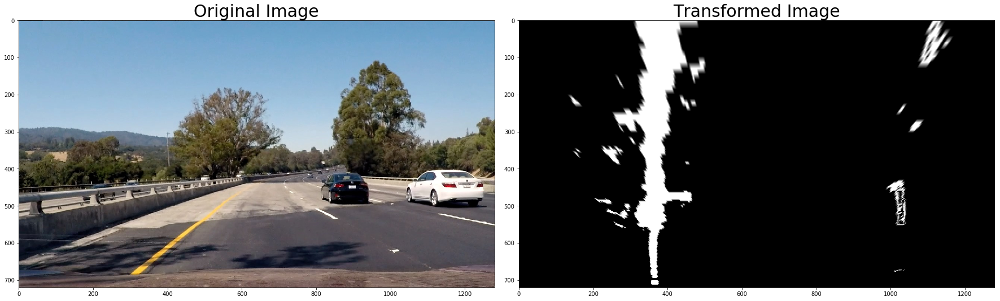

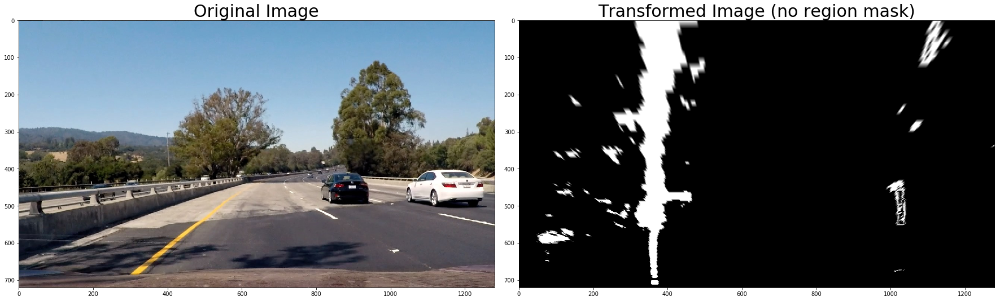

In [29]:
transformation_check = True
#Create function to perform full image transformation on any input image (needed for video processing)
def transform(image):
	undist = undistort_image(image)
	gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
	img_size = (gray.shape[1], gray.shape[0])
	src_vert = np.float32([[(img_size[0]/2)-55, (img_size[1]/2)+100], [(img_size[0]/6)-10, img_size[1]], [(img_size[0]*5/6)+40, img_size[1]], [(img_size[0]/2)+60, (img_size[1]/2)+100] ])

	thresh_gray = binary_image_creation(undist, already_undistorted = True)[0]
	birds_eye = birds_eye_gray_existing_matrix(thresh_gray, already_undistorted = True, source_vert = src_vert)[0]
	return birds_eye

def transform_with_mask(image, format):
    imshape = image.shape
    new_vertices = np.array([[(150, int(imshape[0]*0.99)), (int(imshape[1]*0.45), int(imshape[0]*0.6)), (int(imshape[1]*0.55), int(imshape[0]*0.6)), (imshape[1]-50, int(imshape[0])*0.99)]], dtype=np.int32)
    undist = undistort_image(image)
    
    if format == 'BGR':
        gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
    elif format == 'RGB':
        gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
    img_size = (gray.shape[1], gray.shape[0])
    src_vert = np.float32([[(img_size[0]/2)-55, (img_size[1]/2)+100], [(img_size[0]/6)-10, img_size[1]], [(img_size[0]*5/6)+40, img_size[1]], [(img_size[0]/2)+60, (img_size[1]/2)+100] ])

    thresh_gray = binary_image_creation(undist, already_undistorted = True)[0]
    masked_image = region_of_interest(thresh_gray, new_vertices)
    birds_eye = birds_eye_gray_existing_matrix(masked_image, already_undistorted = True, source_vert = src_vert)[0]
    return birds_eye, undist
    
    
    
if transformation_check == True:
    image = cv2.imread('./test_images/test4.jpg')
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    transformed_image_mask, _ = transform_with_mask(image, 'RGB')
    print("Region masking doesn't seem to offer much help in noise reduction below but can only help speed up pipeline.")
    #Plot original camera image (distorted) next to the bird's eye view of undistorted and thresholded image
    f, (ax1, ax2) = plt.subplots(1, 2, figsize = (24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize = 30)
    #ax2.imshow(birds_eye)
    ax2.imshow(transformed_image_mask, cmap = 'gray')
    ax2.set_title('Transformed Image', fontsize = 30)
    plt.subplots_adjust(left=0., right = 1, top=0.9, bottom=0.)
    plt.show()
    plt.savefig('transformed_test4.png')
    
    transformed_image_no_mask = transform(image)
    #Plot original camera image (distorted) next to the bird's eye view of undistorted and thresholded image
    f, (ax1, ax2) = plt.subplots(1, 2, figsize = (24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize = 30)
    #ax2.imshow(birds_eye)
    ax2.imshow(transformed_image_no_mask, cmap = 'gray')
    ax2.set_title('Transformed Image (no region mask)', fontsize = 30)
    plt.subplots_adjust(left=0., right = 1, top=0.9, bottom=0.)
    plt.show()

## Histogram

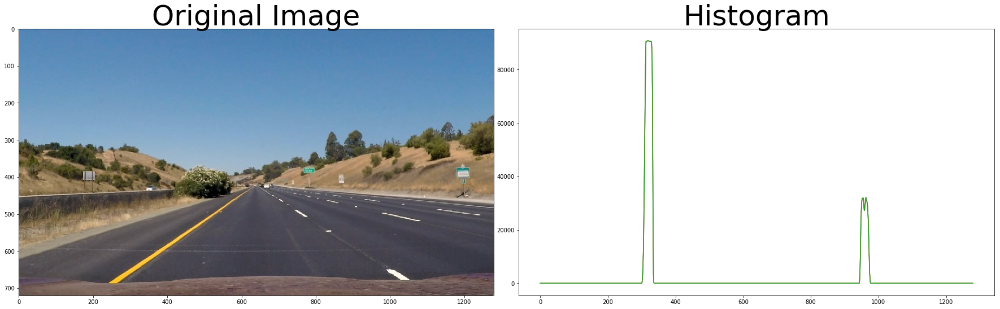

You can observe the histogram overlay in test1_histogram.png


In [30]:
histogram_test = True

def hist(image):
	img_dims = image.shape # image is already grayscale
	bottom_half = image[img_dims[0]//2:img_dims[0], :] #isolate the second half of rows and all columns i.e. bottom half of image
	histogram = np.sum(bottom_half, axis=0) #sum all pixel values (0 or 1) across this bottom half of image
	return histogram

if histogram_test == True:
	#Creat transformed image
	image = cv2.imread('./test_images/straight_lines1.jpg')
	image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
	gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
	img_size = (gray.shape[1], gray.shape[0])
	src_vert = np.float32([[(img_size[0]/2)-55, (img_size[1]/2)+100], [(img_size[0]/6)-10, img_size[1]], [(img_size[0]*5/6)+40, img_size[1]], [(img_size[0]/2)+60, (img_size[1]/2)+100] ])
	undist = undistort_image(image)
	thresh_gray = binary_image_creation(undist, already_undistorted = True)[0]
	birds_eye = birds_eye_gray_existing_matrix(thresh_gray, already_undistorted = True, source_vert = src_vert)[0]
	birds_eye = np.dstack(( birds_eye, birds_eye, birds_eye)) #convert from GRAY to RGB so can display red bounding box ontop of gray image
	birds_eye[birds_eye > 0] = 255
	transformed = birds_eye

	#Create histogram
	histogram = hist(transformed)

	#Plot original camera image (distorted) next to the bird's eye view of undistorted and thresholded image
	f, (ax1, ax2) = plt.subplots(1, 2, figsize = (24, 9))
	f.tight_layout()
	ax1.imshow(image)
	ax1.set_title('Original Image', fontsize = 50)
	#ax2.imshow(birds_eye)
	ax2.plot(histogram)
	ax2.set_title('Histogram', fontsize = 50)
	plt.subplots_adjust(left=0., right = 1, top=0.93, bottom=0.2)
	plt.savefig('test1_histogram.png')
	plt.show()
	print('You can observe the histogram overlay in test1_histogram.png')

## Line Detection

Left polynomial coefficients: [ -7.04208173e-05  -1.05739859e-03   3.70896253e+02]
Right polynomial coefficients: [  1.10425958e-04  -2.39576197e-01   1.11118707e+03]


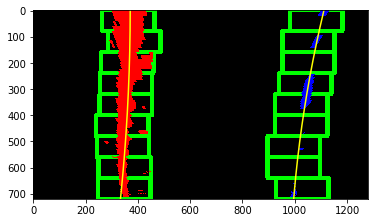

In [31]:
line_detection_test = True
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin  
        win_xleft_high = leftx_current + margin 
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 15) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 15) 
        
        ### TO-DO: Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        #print("good_left_inds e.g. {}".format(good_left_inds[0]))
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### TO-DO: If you found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        #print("left_lane_inds e.g. {}".format(left_lane_inds[0:3]))
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img

def fit_poly(img_shape, leftx, lefty, rightx, righty):
    left_fit = np.polyfit(lefty, leftx, deg=2)
    right_fit = np.polyfit(righty, rightx, deg=2)
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    return left_fitx, right_fitx, ploty

def search_around_poly(binary_warped, left_fit, right_fit):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Plot the polynomial lines onto the image
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    ## End visualization steps ##
    
    return result, left_fitx, right_fitx, leftx, rightx 



def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    ### TO-DO: Fit a second order polynomial to each using `np.polyfit` ###
    left_fit = np.polyfit(lefty, leftx, deg=2)
    right_fit = np.polyfit(righty, rightx, deg=2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')

    return out_img, left_fit, right_fit, left_fitx, right_fitx


def fit_polynomial_no_image(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    ### TO-DO: Fit a second order polynomial to each using `np.polyfit` ###
    left_fit = np.polyfit(lefty, leftx, deg=2)
    right_fit = np.polyfit(righty, rightx, deg=2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')

    return out_img, left_fit, right_fit, left_fitx, right_fitx

if line_detection_test == True:
    image = cv2.imread('./test_images/test1.jpg')
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    transformed_image = transform(image)
    out_img, left_fit, right_fit, _, _ = fit_polynomial(transformed_image)
    plt.imshow(out_img)
    plt.savefig("lane_detection.png")
    print("Left polynomial coefficients: {}".format(left_fit))
    print("Right polynomial coefficients: {}".format(right_fit))    

## Radius Of Curvature Calculation

Note the conversion factors. If X is in metres and x is in pixels then we want to convert x=ay^2+by+c. We have X=m_x x and Y=m_y y. Therefore X/m_x = a(Y/m_y)^2 + b(Y/m_y) + m_x c. Thus X = a (m_x/m_y^2) Y^2 + b(m_x/m_y) Y + m_x c. Therefore, A = a (m_x/m_y^2) and B= b (m_x/m_y)
Radius of curvature of left lane line: 729.5940315271964
Radius of curvature of right lane line: 436.6493444069767
Offset of vehicle from centre of road: -0.33599992104894116


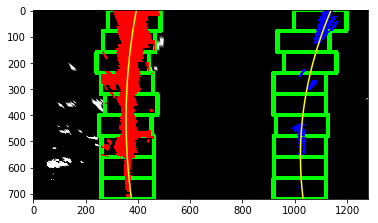

In [32]:
curvature_test = True

#HYPERPARAMETERS
xm_per_pix = 3.7/700
ym_per_pix = 30/720

def convert_pixels_to_metres(ploty, left_fit, right_fit, ym_per_pix, xm_per_pix):
    #We actually plot x(y) rather than y(x). Use coefficients and range of y values in ploty to get 
    #activated x values:
    leftx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    rightx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    #These lists will be populated "bottom-to-top" so flip to match top-to-bottom order of y
    leftx = leftx[::-1]
    rightx = rightx[::-1]
    
    #As both x and y lists are top-to-bottom, we can fit a quadratic to pixel positions
    #We scale the x and y coordinates by relevant scale factors
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)

    return ploty*ym_per_pix, leftx*xm_per_pix, rightx*xm_per_pix, left_fit_cr, right_fit_cr

def curvature_and_offset(ploty, left_fit, right_fit):
    #Get scaled data (in metres)
    ploty_cr, leftx_cr, rightx_cr, left_fit_cr, right_fit_cr = convert_pixels_to_metres(ploty, left_fit, right_fit, ym_per_pix, xm_per_pix)
    
    #Define y-value where radiues of curvature should be calculated 
    #Choose max y value i.e. bottom of image i.e. closest to current location of car wheels
    y_eval = np.max(ploty_cr)
    
    #radius of curvature
    A_left = left_fit_cr[0]
    B_left = left_fit_cr[1]
    left_curverad = 1/(2*np.abs(A_left)) * (1+(2*A_left*y_eval+B_left)**2)**(3/2)
    A_right=right_fit_cr[0]
    B_right=right_fit_cr[1]
    right_curverad = 1/(2*np.abs(A_right)) * (1+(2*A_right*y_eval+B_right)**2)**(3/2)
    
    #offset of car from centre of lane as camera centre (car position) - mean lane position
    leftx_bottom = left_fit_cr[0] * y_eval**2 + left_fit_cr[1]*y_eval + left_fit_cr[2]
    rightx_bottom = right_fit_cr[0]*y_eval**2 + right_fit_cr[1]*y_eval + right_fit_cr[2]
    mean_x_bottom = 1/2* (leftx_bottom + rightx_bottom)
    offset_x_m = 1280/2*xm_per_pix - mean_x_bottom 
    
    return left_curverad, right_curverad, offset_x_m, left_fit_cr, right_fit_cr


print("Note the conversion factors. If X is in metres and x is in pixels then we want to convert x=ay^2+by+c. We have X=m_x x and Y=m_y y. Therefore X/m_x = a(Y/m_y)^2 + b(Y/m_y) + m_x c. Thus X = a (m_x/m_y^2) Y^2 + b(m_x/m_y) Y + m_x c. Therefore, A = a (m_x/m_y^2) and B= b (m_x/m_y)")

def curvature_and_offset_2(ploty, left_fit, right_fit):
    y_eval = np.max(ploty)
    A_left = left_fit[0]*xm_per_pix / (ym_per_pix)**2
    B_left = left_fit[1]*xm_per_pix / ym_per_pix
    A_right = right_fit[0]*xm_per_pix / (ym_per_pix)**2
    B_right = right_fit[1]*xm_per_pix / ym_per_pix
    
    left_curverad = 1/(2*np.abs(A_left)) * (1+(2*A_left*y_eval*ym_per_pix + B_left)**2)**(3/2)
    right_curverad = 1/(2*np.abs(A_right)) * (1+(2*A_right*y_eval*ym_per_pix + B_right)**2)**(3/2)
    
    left_x_bottom = left_fit[0] * y_eval**2 + left_fit[1]*y_eval + left_fit[2]
    right_x_bottom = right_fit[0]*y_eval**2 + right_fit[1]*y_eval + right_fit[2]
    mean_x_bottom = 1/2* (left_x_bottom + right_x_bottom)
    offset_x_m = ((1280/2) - mean_x_bottom)*xm_per_pix
    
    return left_curverad, right_curverad, offset_x_m
    

if curvature_test == True:
    image = cv2.imread('./test_images/test4.jpg')
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    img_size = (gray.shape[1], gray.shape[0])
    transformed_image = transform(image)
    out_img, left_fit, right_fit, _, _ = fit_polynomial(transformed_image)
    plt.imshow(out_img)
    #print("Left polynomial coefficients: {}".format(left_fit))
    #print("Right polynomial coefficients: {}".format(right_fit))
    ploty = np.linspace(0, img_size[1]-1, img_size[1])
    left_curverad, right_curverad, offset_x_m = curvature_and_offset_2(ploty, left_fit, right_fit)
    print("Radius of curvature of left lane line: {}".format(left_curverad))
    print("Radius of curvature of right lane line: {}".format(right_curverad))
    print("Offset of vehicle from centre of road: {}".format(offset_x_m))

## Inverse Bird's Eye: Projecting Back To Road

In [40]:
inverse_birds_eye_test = True

def inverse_birds_eye_2(image, undist, bird_image, left_fit, right_fit, left_fitx, right_fitx, left_curverad, right_curverad, offset_x_m):
    M_inv = pickle.load(open("M_inv.p", "rb"))
    #image is grayscale so easy to get shape
    img_size = (image.shape[1], image.shape[0])
    #prepare RGB version using dstack to drwa the lines on
    warp_zero = np.zeros_like(image).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    #collect x and y points from polynomial lane line boundaries in left_fitx and right_fitx
    #recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    #draw the lane onto the warped blank image - fillPoly creates a green quadrilateral between the parabolic boundaries
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255,0))
    #warp the blank back to original image space using M_inv
    newwarp = cv2.warpPerspective(color_warp, M_inv, img_size)
    
    ### DO VEHICLE DETECTION HERE!!!
    result_with_vehicles, heatmap = process_frame_with_history(undist)
    
    
    font = cv2.FONT_HERSHEY_SIMPLEX
    curverad = 1/2*(left_curverad + right_curverad)
    if np.abs(curverad) > 5000:
        string1a = string1a = "R_left = "+str(round(left_curverad,1))+"km"
        string1b = string1b = "R_right = "+str(round(right_curverad,1))+"km"
        string1c = string1c = "R_mean = "+str(round(curverad,1))+"km"
        string2 = "straight"
    else:
        string1a = "R_left = "+str(round(left_curverad,1))+"km"
        string1b = "R_right = "+str(round(right_curverad,1))+"km"
        string1c = "R_mean = "+str(round(curverad,1))+"km"
        if left_fit[0] > 0 and curverad > 500:
            string2 = "gentle right"
        elif left_fit[0] > 0 and curverad <= 500:
            string2 = "hard right"
        elif left_fit[0] < 0 and curverad > 500:
            string2 = "gentle left"
        elif left_fit[0] < 0 and curverad <= 500:
            string2 = "hard left"
    string3 = "central offset: "+str(round(offset_x_m,2))+"m"
    cv2.putText(result_with_vehicles, string1a, (855,50), font, 0.9, (255,255,255),4,cv2.LINE_AA)
    cv2.putText(result_with_vehicles, string1b, (855,90), font, 0.9, (255,255,255),4,cv2.LINE_AA)
    cv2.putText(result_with_vehicles, string1c, (855,130), font, 0.9, (255,255,255),4,cv2.LINE_AA)
    cv2.putText(result_with_vehicles, string2, (855,210), font, 0.9, (255,255,255),4,cv2.LINE_AA)
    cv2.putText(result_with_vehicles, string3, (855,170), font, 0.9, (255,255,255),4,cv2.LINE_AA)
    
    #combine the result with the original
    result_with_vehicles = cv2.addWeighted(result_with_vehicles, 1, newwarp, 0.3, 0)
    output = result.copy()
    
    

    
    
    small_undist = cv2.resize(undist, (0,0), fx=0.2, fy=0.2)

    src_vert = np.float32([[(img_size[0]/2)-55, (img_size[1]/2)+100], [(img_size[0]/6)-10, img_size[1]], [(img_size[0]*5/6)+40, img_size[1]], [(img_size[0]/2)+60, (img_size[1]/2)+100] ])
    birds_eye = birds_eye_existing_matrix(undist, already_undistorted = True, source_vert = src_vert, draw_lines = False)[0]
    small_birds_eye = cv2.resize(birds_eye, (0,0), fx=0.2, fy=0.2)

    small_out_image = cv2.resize(bird_image, (0,0), fx=0.2, fy=0.2)
    
    small_heatmap = cv2.resize(heatmap, (0,0), fx=0.2, fy=0.2)
    x1 = 0
    y1 = 20
    x2= small_out_image.shape[0]
    y2= small_out_image.shape[1]
    y3 = small_out_image.shape[1]*2
    y4 = small_out_image.shape[1]*3
    result_with_vehicles[x1+50:x2+50, y1:y2+20, :] = small_heatmap
    result_with_vehicles[x1+50:x2+50, y2+40:y3+40, :] = small_birds_eye
    result_with_vehicles[x1+50:x2+50, y3+60:y4+60, :] = small_out_image
    cv2.putText(result_with_vehicles, "Vehicle Heatmap", (30,30), font, 0.9, (255,255,255),4,cv2.LINE_AA)
    cv2.putText(result_with_vehicles, "Bird's Eye", (360,30), font, 0.9, (255,255,255),4,cv2.LINE_AA)
    cv2.putText(result_with_vehicles, "Line Search", (620,30), font, 0.9, (255,255,255),4,cv2.LINE_AA)
    
    return result_with_vehicles

print("Since the modulus in the formula for R_curve means it is always +ve (can't have -ve radius), we can use the sign of the leading quadratic coefficient, A, to establish if it is a right or left turn. We are sketching x(y) rather than y(x). Draw the two possibilities for A>0 and A<0 and test on images below and see it correctly captures the bending of the road.")
if inverse_birds_eye_test == True:
    import glob
    fnames = glob.glob('./test_images/test_1.jpg')
    for img in fnames:    
        image = cv2.imread(img)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        undist = undistort_image(image)
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        img_size = (gray.shape[1], gray.shape[0])
        transformed_image, undist = transform_with_mask(image, 'RGB')
        out_image, left_fit, right_fit, left_fitx, right_fitx = fit_polynomial_no_image(transformed_image)
        ploty = np.linspace(0, img_size[1]-1, img_size[1])
        left_curverad, right_curverad, offset_x_m = curvature_and_offset_2(ploty, left_fit, right_fit)
        result = inverse_birds_eye_2(transformed_image, undist, out_image, left_fit, right_fit, left_fitx, right_fitx, left_curverad, right_curverad, offset_x_m)
    #Plot original camera image (distorted) next to the calibrated (undistorted) image
        #print(img.split('/')[-1])
        #f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (24,12))
        ##f.tight_layout()
        #ax1.imshow(undist)
        #ax1.set_title('Original Image', fontsize = 20)
        #ax2.imshow(out_image, cmap = 'gray')
        #ax2.set_title('Thresholding', fontsize = 20)
        #ax3.imshow(result, cmap='gray')
        #ax3.set_title('Lane Detection', fontsize = 20)
        #plt.subplots_adjust(left=0., right = 1, top=0.9, bottom=0.)
        #plt.show()
        plt.savefig('bla.png')
        plt.imshow(result)

Since the modulus in the formula for R_curve means it is always +ve (can't have -ve radius), we can use the sign of the leading quadratic coefficient, A, to establish if it is a right or left turn. We are sketching x(y) rather than y(x). Draw the two possibilities for A>0 and A<0 and test on images below and see it correctly captures the bending of the road.


## Define Class For Storing Info

In [41]:
from collections import deque
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.acoeff = []
        self.bcoeff = []
        self.ccoeff = []
        self.curvature = []
    def add_fit(self, fit):
        if fit is not None:
            self.acoeff.append(fit[0])
            if len(self.acoeff) > 9:
                self.acoeff = self.acoeff[1:]
            self.bcoeff.append(fit[1])
            if len(self.bcoeff) > 9:
                self.bcoeff = self.bcoeff[1:]
            self.ccoeff.append(fit[2])
            if len(self.ccoeff) > 9:
                self.ccoeff = self.ccoeff[1:]
    def add_curverad(self, curverad):
        self.curvature.append(curverad)
        if len(self.curvature) > 9:
            self.curvature = self.curvature[1:]
        
        
    def get_next_fit(self):
        if len(self.acoeff) > 0:
            a = np.mean(self.acoeff)
            b = np.mean(self.bcoeff)
            c = np.mean(self.ccoeff)
        else:
            print("Nothing in fit deques yet")
        return [a, b, c]
    
    def get_next_curverad(self):
        if len(self.curvature) > 0:
            curverad = np.mean(self.curvature)
        else:
            print("Nothing in curvature deques yet")
        return curverad

print('Line Class Created')

Line Class Created


## Application To Video Stream

In [42]:
#Load video dependencies
from moviepy.editor import VideoFileClip
from IPython.display import HTML

#Re-load any pickle files just in case
mtx=pickle.load(open("mtx.p", "rb"))
dist=pickle.load(open("dist.p", "rb"))
M_warp = pickle.load(open("M_warp.p", "rb"))
M_inv = pickle.load(open("M_inv.p", "rb"))

In [43]:
#This function assumes you have already split the video into individual images.
#It then applies the various functions above to plot lane region and calculate curvature, offset etc.
def process_image_with_class(image, left_line, right_line):

    #undistort, region mask, threshold and perspective change
    masked_image, undist = transform_with_mask(image, 'RGB')
    
    #fit polynomial
    out_image, left_fit, right_fit, left_fitx, right_fitx = fit_polynomial_no_image(masked_image)

    #add new fits
    left_line.add_fit(left_fit)
    right_line.add_fit(right_fit)
    #print(left_line.acoeff)
    #update fits to running average before proceeding
    left_fit = left_line.get_next_fit()
    right_fit = right_line.get_next_fit()
    
    
    #measure curvature and offset
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    img_size = (gray.shape[1], gray.shape[0])
    ploty = np.linspace(0, img_size[1]-1, img_size[1])
    left_curverad, right_curverad, offset_x_m = curvature_and_offset_2(ploty, left_fit, right_fit)
    
    #add new curvatures
    left_line.add_curverad(left_curverad)
    right_line.add_curverad(right_curverad)
    
    #update curvatures to running average before proceeding
    left_curverad - left_line.get_next_curverad()
    right_curverad = right_line.get_next_curverad()
    
    #produce finalpic result
    result = inverse_birds_eye_2(masked_image, undist, out_image, left_fit, right_fit, left_fitx, right_fitx, left_curverad, right_curverad, offset_x_m)
    
    return result

def process_image_no_class(image):

    #undistort, region mask, threshold and perspective change
    masked_image, undist = transform_with_mask(image, 'RGB')
    
    #fit polynomial
    out_image, left_fit, right_fit, left_fitx, right_fitx = fit_polynomial_no_image(masked_image)

    #measure curvature and offset
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    img_size = (gray.shape[1], gray.shape[0])
    ploty = np.linspace(0, img_size[1]-1, img_size[1])
    left_curverad, right_curverad, offset_x_m = curvature_and_offset_2(ploty, left_fit, right_fit)
    

    #produce finalpic result
    result = inverse_birds_eye_2(masked_image, undist, out_image, left_fit, right_fit, left_fitx, right_fitx, left_curverad, right_curverad, offset_x_m)
    
    return result

### Test Pipeline

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)
test_images\straight_lines1.jpg


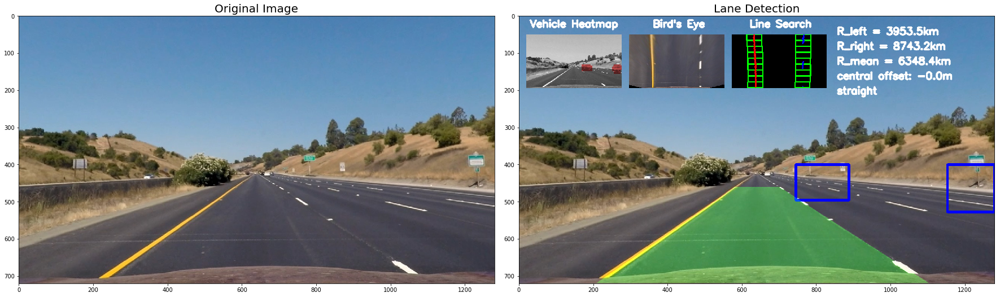

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)
test_images\straight_lines2.jpg


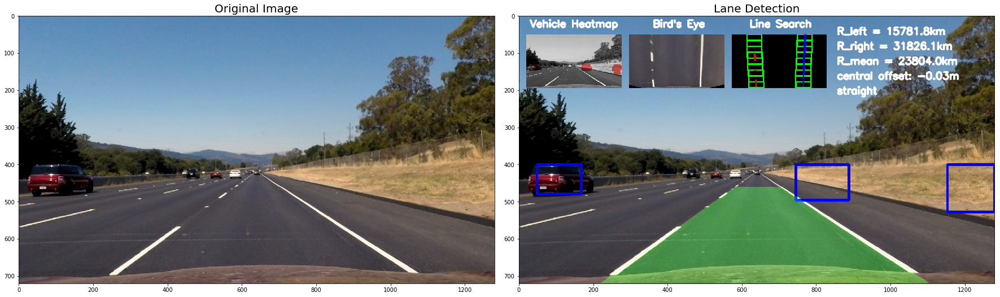

44
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)
test_images\test1.jpg


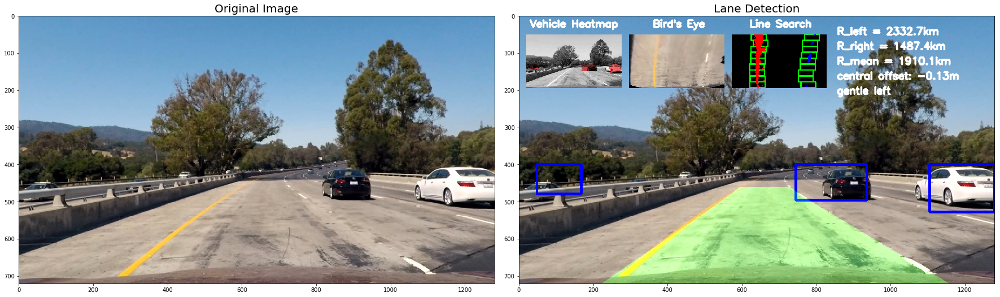

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)
test_images\test2.jpg


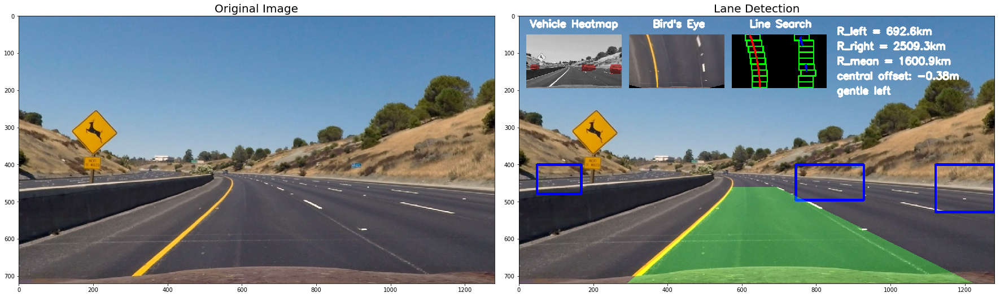

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)
test_images\test3.jpg


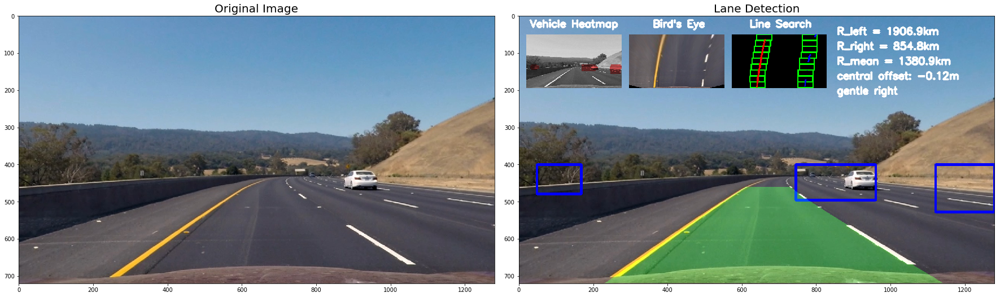

45
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)
test_images\test4.jpg


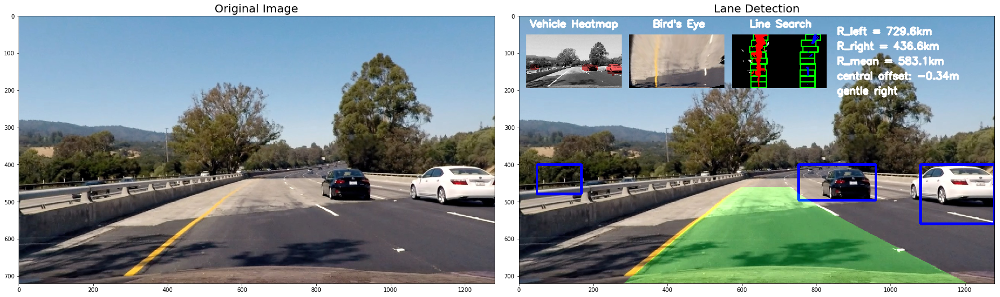

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)
test_images\test5.jpg


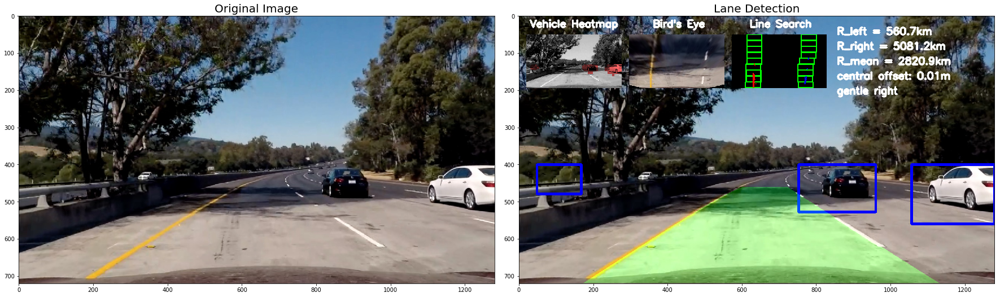

45
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)
test_images\test6.jpg


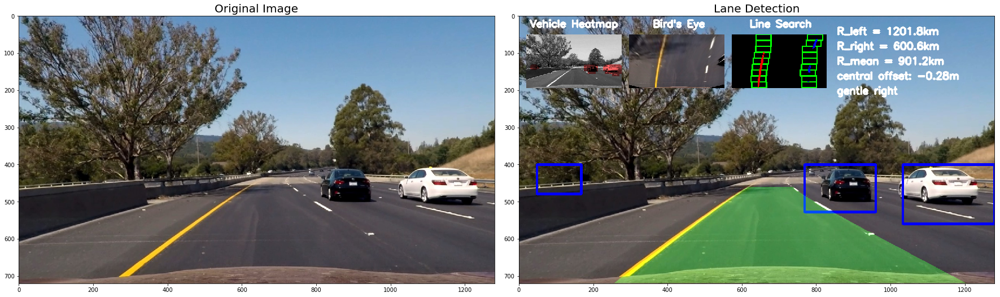

In [44]:
fnames = glob.glob('./test_images/*.jpg')
for img in fnames:    
    l_line = Line()
    r_line = Line()
    BGRimage = cv2.imread(img)
    RGBimage = cv2.cvtColor(BGRimage, cv2.COLOR_BGR2RGB)
    undist = undistort_image(RGBimage)
    result = process_image_no_class(RGBimage) 

#Plot original camera image (distorted) next to the calibrated (undistorted) image
    print(img.split('/')[-1])
    f, (ax1, ax2) = plt.subplots(1, 2, figsize = (24,12))
    f.tight_layout()
    ax1.imshow(undist)
    ax1.set_title('Original Image', fontsize = 20)
    ax2.imshow(result, cmap='gray')
    ax2.set_title('Lane Detection', fontsize = 20)
    plt.subplots_adjust(left=0., right = 1, top=0.9, bottom=0.)
    plt.show()

In [51]:
output_video_name = 'output_project_video_lanes_and_vehicles2.mp4'
input_clip = VideoFileClip("project_video_vehicle_detection.mp4")
left_line = Line()
right_line = Line()
# Use subclip to check performance on a subset of total footage (faster than using whole thing each time)
output_clip = input_clip.fl_image(lambda image: process_image_with_class(image, left_line, right_line))
%time output_clip.write_videofile(output_video_name, audio = False)

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)
[MoviePy] >>>> Building video output_project_video_lanes_and_vehicles2.mp4
[MoviePy] Writing video output_project_video_lanes_and_vehicles2.mp4


  0%|                                                                                         | 0/1261 [00:00<?, ?it/s]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  0%|                                                                                 | 1/1261 [00:01<28:16,  1.35s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  0%|▏                                                                                | 2/1261 [00:02<30:31,  1.46s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  0%|▏                                                                                | 3/1261 [00:04<30:25,  1.45s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  0%|▎                                                                                | 4/1261 [00:06<34:07,  1.63s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  0%|▎                                                                                | 5/1261 [00:08<35:12,  1.68s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  0%|▍                                                                                | 6/1261 [00:10<36:20,  1.74s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  1%|▍                                                                                | 7/1261 [00:12<37:23,  1.79s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  1%|▌                                                                                | 8/1261 [00:14<37:23,  1.79s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  1%|▌                                                                                | 9/1261 [00:15<37:01,  1.77s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  1%|▋                                                                               | 10/1261 [00:17<37:18,  1.79s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  1%|▋                                                                               | 11/1261 [00:19<37:51,  1.82s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  1%|▊                                                                               | 12/1261 [00:22<39:00,  1.87s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  1%|▊                                                                               | 13/1261 [00:24<39:21,  1.89s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  1%|▉                                                                               | 14/1261 [00:26<39:22,  1.89s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  1%|▉                                                                               | 15/1261 [00:28<39:12,  1.89s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  1%|█                                                                               | 16/1261 [00:30<39:15,  1.89s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  1%|█                                                                               | 17/1261 [00:32<39:26,  1.90s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  1%|█▏                                                                              | 18/1261 [00:34<39:13,  1.89s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  2%|█▏                                                                              | 19/1261 [00:36<40:11,  1.94s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  2%|█▎                                                                              | 20/1261 [00:38<40:04,  1.94s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  2%|█▎                                                                              | 21/1261 [00:40<40:05,  1.94s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  2%|█▍                                                                              | 22/1261 [00:42<40:03,  1.94s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  2%|█▍                                                                              | 23/1261 [00:44<39:33,  1.92s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  2%|█▌                                                                              | 24/1261 [00:45<39:03,  1.89s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  2%|█▌                                                                              | 25/1261 [00:47<38:46,  1.88s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  2%|█▋                                                                              | 26/1261 [00:48<38:18,  1.86s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  2%|█▋                                                                              | 27/1261 [00:49<37:54,  1.84s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  2%|█▊                                                                              | 28/1261 [00:51<37:58,  1.85s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  2%|█▊                                                                              | 29/1261 [00:54<38:15,  1.86s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  2%|█▉                                                                              | 30/1261 [00:55<38:11,  1.86s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  2%|█▉                                                                              | 31/1261 [00:57<38:15,  1.87s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  3%|██                                                                              | 32/1261 [00:59<37:55,  1.85s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  3%|██                                                                              | 33/1261 [01:00<37:35,  1.84s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  3%|██▏                                                                             | 34/1261 [01:01<37:15,  1.82s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  3%|██▏                                                                             | 35/1261 [01:03<37:09,  1.82s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  3%|██▎                                                                             | 36/1261 [01:05<36:52,  1.81s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  3%|██▎                                                                             | 37/1261 [01:06<36:33,  1.79s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  3%|██▍                                                                             | 38/1261 [01:07<36:17,  1.78s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  3%|██▍                                                                             | 39/1261 [01:08<36:01,  1.77s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  3%|██▌                                                                             | 40/1261 [01:10<35:46,  1.76s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  3%|██▌                                                                             | 41/1261 [01:11<35:30,  1.75s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  3%|██▋                                                                             | 42/1261 [01:12<35:16,  1.74s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  3%|██▋                                                                             | 43/1261 [01:14<35:18,  1.74s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  3%|██▊                                                                             | 44/1261 [01:16<35:04,  1.73s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  4%|██▊                                                                             | 45/1261 [01:17<34:51,  1.72s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  4%|██▉                                                                             | 46/1261 [01:18<34:44,  1.72s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  4%|██▉                                                                             | 47/1261 [01:20<34:32,  1.71s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  4%|███                                                                             | 48/1261 [01:22<34:35,  1.71s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  4%|███                                                                             | 49/1261 [01:24<34:37,  1.71s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  4%|███▏                                                                            | 50/1261 [01:25<34:40,  1.72s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  4%|███▏                                                                            | 51/1261 [01:27<34:28,  1.71s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  4%|███▎                                                                            | 52/1261 [01:28<34:21,  1.71s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  4%|███▎                                                                            | 53/1261 [01:30<34:14,  1.70s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  4%|███▍                                                                            | 54/1261 [01:31<34:07,  1.70s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  4%|███▍                                                                            | 55/1261 [01:33<34:03,  1.69s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  4%|███▌                                                                            | 56/1261 [01:34<34:00,  1.69s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  5%|███▌                                                                            | 57/1261 [01:36<34:07,  1.70s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  5%|███▋                                                                            | 58/1261 [01:38<34:01,  1.70s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  5%|███▋                                                                            | 59/1261 [01:39<33:56,  1.69s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  5%|███▊                                                                            | 60/1261 [01:41<33:51,  1.69s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  5%|███▊                                                                            | 61/1261 [01:42<33:44,  1.69s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  5%|███▉                                                                            | 62/1261 [01:44<33:39,  1.68s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  5%|███▉                                                                            | 63/1261 [01:46<33:36,  1.68s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  5%|████                                                                            | 64/1261 [01:47<33:39,  1.69s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  5%|████                                                                            | 65/1261 [01:49<33:37,  1.69s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  5%|████▏                                                                           | 66/1261 [01:51<33:30,  1.68s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  5%|████▎                                                                           | 67/1261 [01:52<33:24,  1.68s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  5%|████▎                                                                           | 68/1261 [01:53<33:17,  1.67s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  5%|████▍                                                                           | 69/1261 [01:55<33:14,  1.67s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  6%|████▍                                                                           | 70/1261 [01:57<33:13,  1.67s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  6%|████▌                                                                           | 71/1261 [01:59<33:25,  1.69s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  6%|████▌                                                                           | 72/1261 [02:01<33:30,  1.69s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  6%|████▋                                                                           | 73/1261 [02:03<33:30,  1.69s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  6%|████▋                                                                           | 74/1261 [02:05<33:30,  1.69s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  6%|████▊                                                                           | 75/1261 [02:07<33:28,  1.69s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  6%|████▊                                                                           | 76/1261 [02:09<33:39,  1.70s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  6%|████▉                                                                           | 77/1261 [02:10<33:32,  1.70s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  6%|████▉                                                                           | 78/1261 [02:12<33:26,  1.70s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  6%|█████                                                                           | 79/1261 [02:14<33:28,  1.70s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  6%|█████                                                                           | 80/1261 [02:16<33:28,  1.70s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  6%|█████▏                                                                          | 81/1261 [02:18<33:33,  1.71s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  7%|█████▏                                                                          | 82/1261 [02:20<33:42,  1.72s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  7%|█████▎                                                                          | 83/1261 [02:23<33:55,  1.73s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  7%|█████▎                                                                          | 84/1261 [02:26<34:06,  1.74s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  7%|█████▍                                                                          | 85/1261 [02:28<34:09,  1.74s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  7%|█████▍                                                                          | 86/1261 [02:31<34:26,  1.76s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  7%|█████▌                                                                          | 87/1261 [02:33<34:28,  1.76s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  7%|█████▌                                                                          | 88/1261 [02:35<34:30,  1.77s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  7%|█████▋                                                                          | 89/1261 [02:37<34:30,  1.77s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  7%|█████▋                                                                          | 90/1261 [02:38<34:28,  1.77s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  7%|█████▊                                                                          | 91/1261 [02:40<34:23,  1.76s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  7%|█████▊                                                                          | 92/1261 [02:42<34:25,  1.77s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  7%|█████▉                                                                          | 93/1261 [02:43<34:17,  1.76s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  7%|█████▉                                                                          | 94/1261 [02:45<34:10,  1.76s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  8%|██████                                                                          | 95/1261 [02:46<34:03,  1.75s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  8%|██████                                                                          | 96/1261 [02:47<33:56,  1.75s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  8%|██████▏                                                                         | 97/1261 [02:49<33:56,  1.75s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  8%|██████▏                                                                         | 98/1261 [02:53<34:13,  1.77s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  8%|██████▎                                                                         | 99/1261 [02:54<34:11,  1.77s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  8%|██████▎                                                                        | 100/1261 [02:57<34:15,  1.77s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  8%|██████▎                                                                        | 101/1261 [02:59<34:16,  1.77s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  8%|██████▍                                                                        | 102/1261 [03:00<34:14,  1.77s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  8%|██████▍                                                                        | 103/1261 [03:03<34:21,  1.78s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  8%|██████▌                                                                        | 104/1261 [03:05<34:23,  1.78s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  8%|██████▌                                                                        | 105/1261 [03:07<34:24,  1.79s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  8%|██████▋                                                                        | 106/1261 [03:09<34:24,  1.79s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  8%|██████▋                                                                        | 107/1261 [03:11<34:27,  1.79s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  9%|██████▊                                                                        | 108/1261 [03:13<34:23,  1.79s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  9%|██████▊                                                                        | 109/1261 [03:16<34:35,  1.80s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  9%|██████▉                                                                        | 110/1261 [03:18<34:37,  1.81s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  9%|██████▉                                                                        | 111/1261 [03:21<34:47,  1.81s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  9%|███████                                                                        | 112/1261 [03:23<34:49,  1.82s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  9%|███████                                                                        | 113/1261 [03:27<35:03,  1.83s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  9%|███████▏                                                                       | 114/1261 [03:29<35:10,  1.84s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  9%|███████▏                                                                       | 115/1261 [03:32<35:14,  1.85s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  9%|███████▎                                                                       | 116/1261 [03:34<35:17,  1.85s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  9%|███████▎                                                                       | 117/1261 [03:37<35:28,  1.86s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  9%|███████▍                                                                       | 118/1261 [03:39<35:28,  1.86s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  9%|███████▍                                                                       | 119/1261 [03:42<35:36,  1.87s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 10%|███████▌                                                                       | 120/1261 [03:44<35:31,  1.87s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 10%|███████▌                                                                       | 121/1261 [03:46<35:32,  1.87s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 10%|███████▋                                                                       | 122/1261 [03:49<35:39,  1.88s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 10%|███████▋                                                                       | 123/1261 [03:50<35:36,  1.88s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 10%|███████▊                                                                       | 124/1261 [03:52<35:32,  1.88s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 10%|███████▊                                                                       | 125/1261 [03:54<35:35,  1.88s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 10%|███████▉                                                                       | 126/1261 [03:56<35:34,  1.88s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 10%|███████▉                                                                       | 127/1261 [03:59<35:40,  1.89s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 10%|████████                                                                       | 128/1261 [04:01<35:35,  1.88s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 10%|████████                                                                       | 129/1261 [04:03<35:35,  1.89s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 10%|████████▏                                                                      | 130/1261 [04:05<35:37,  1.89s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 10%|████████▏                                                                      | 131/1261 [04:08<35:42,  1.90s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 10%|████████▎                                                                      | 132/1261 [04:11<35:49,  1.90s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 11%|████████▎                                                                      | 133/1261 [04:13<35:51,  1.91s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 11%|████████▍                                                                      | 134/1261 [04:16<35:53,  1.91s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 11%|████████▍                                                                      | 135/1261 [04:17<35:49,  1.91s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 11%|████████▌                                                                      | 136/1261 [04:21<36:01,  1.92s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 11%|████████▌                                                                      | 137/1261 [04:22<35:56,  1.92s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 11%|████████▋                                                                      | 138/1261 [04:25<35:56,  1.92s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 11%|████████▋                                                                      | 139/1261 [04:27<36:01,  1.93s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 11%|████████▊                                                                      | 140/1261 [04:30<36:05,  1.93s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 11%|████████▊                                                                      | 141/1261 [04:32<36:06,  1.93s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 11%|████████▉                                                                      | 142/1261 [04:34<36:03,  1.93s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 11%|████████▉                                                                      | 143/1261 [04:36<36:04,  1.94s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 11%|█████████                                                                      | 144/1261 [04:39<36:10,  1.94s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 11%|█████████                                                                      | 145/1261 [04:43<36:18,  1.95s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 12%|█████████▏                                                                     | 146/1261 [04:45<36:21,  1.96s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 12%|█████████▏                                                                     | 147/1261 [04:48<36:22,  1.96s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 12%|█████████▎                                                                     | 148/1261 [04:50<36:25,  1.96s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 12%|█████████▎                                                                     | 149/1261 [04:54<36:39,  1.98s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 12%|█████████▍                                                                     | 150/1261 [04:57<36:43,  1.98s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 12%|█████████▍                                                                     | 151/1261 [04:59<36:38,  1.98s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 12%|█████████▌                                                                     | 152/1261 [05:01<36:37,  1.98s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 12%|█████████▌                                                                     | 153/1261 [05:02<36:32,  1.98s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 12%|█████████▋                                                                     | 154/1261 [05:05<36:36,  1.98s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 12%|█████████▋                                                                     | 155/1261 [05:07<36:35,  1.99s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 12%|█████████▊                                                                     | 156/1261 [05:10<36:37,  1.99s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 12%|█████████▊                                                                     | 157/1261 [05:12<36:36,  1.99s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 13%|█████████▉                                                                     | 158/1261 [05:14<36:34,  1.99s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 13%|█████████▉                                                                     | 159/1261 [05:16<36:33,  1.99s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 13%|██████████                                                                     | 160/1261 [05:18<36:28,  1.99s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 13%|██████████                                                                     | 161/1261 [05:19<36:25,  1.99s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 13%|██████████▏                                                                    | 162/1261 [05:21<36:23,  1.99s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 13%|██████████▏                                                                    | 163/1261 [05:24<36:23,  1.99s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 13%|██████████▎                                                                    | 164/1261 [05:25<36:20,  1.99s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 13%|██████████▎                                                                    | 165/1261 [05:27<36:18,  1.99s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 13%|██████████▍                                                                    | 166/1261 [05:29<36:14,  1.99s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 13%|██████████▍                                                                    | 167/1261 [05:31<36:10,  1.98s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 13%|██████████▌                                                                    | 168/1261 [05:33<36:06,  1.98s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 13%|██████████▌                                                                    | 169/1261 [05:34<36:00,  1.98s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 13%|██████████▋                                                                    | 170/1261 [05:36<35:57,  1.98s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 14%|██████████▋                                                                    | 171/1261 [05:38<35:56,  1.98s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 14%|██████████▊                                                                    | 172/1261 [05:39<35:50,  1.97s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 14%|██████████▊                                                                    | 173/1261 [05:41<35:44,  1.97s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 14%|██████████▉                                                                    | 174/1261 [05:42<35:38,  1.97s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 14%|██████████▉                                                                    | 175/1261 [05:43<35:32,  1.96s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 14%|███████████                                                                    | 176/1261 [05:44<35:26,  1.96s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 14%|███████████                                                                    | 177/1261 [05:46<35:20,  1.96s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 14%|███████████▏                                                                   | 178/1261 [05:47<35:14,  1.95s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 14%|███████████▏                                                                   | 179/1261 [05:49<35:12,  1.95s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 14%|███████████▎                                                                   | 180/1261 [05:51<35:11,  1.95s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 14%|███████████▎                                                                   | 181/1261 [05:53<35:08,  1.95s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 14%|███████████▍                                                                   | 182/1261 [05:55<35:07,  1.95s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 15%|███████████▍                                                                   | 183/1261 [05:57<35:06,  1.95s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 15%|███████████▌                                                                   | 184/1261 [06:00<35:08,  1.96s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 15%|███████████▌                                                                   | 185/1261 [06:02<35:05,  1.96s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 15%|███████████▋                                                                   | 186/1261 [06:04<35:03,  1.96s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 15%|███████████▋                                                                   | 187/1261 [06:05<34:59,  1.95s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 15%|███████████▊                                                                   | 188/1261 [06:07<34:55,  1.95s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 15%|███████████▊                                                                   | 189/1261 [06:09<34:55,  1.95s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 15%|███████████▉                                                                   | 190/1261 [06:12<34:58,  1.96s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 15%|███████████▉                                                                   | 191/1261 [06:14<34:56,  1.96s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 15%|████████████                                                                   | 192/1261 [06:16<34:57,  1.96s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 15%|████████████                                                                   | 193/1261 [06:18<34:56,  1.96s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 15%|████████████▏                                                                  | 194/1261 [06:21<34:58,  1.97s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 15%|████████████▏                                                                  | 195/1261 [06:23<34:55,  1.97s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 16%|████████████▎                                                                  | 196/1261 [06:24<34:51,  1.96s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 16%|████████████▎                                                                  | 197/1261 [06:26<34:49,  1.96s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 16%|████████████▍                                                                  | 198/1261 [06:28<34:47,  1.96s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 16%|████████████▍                                                                  | 199/1261 [06:30<34:45,  1.96s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 16%|████████████▌                                                                  | 200/1261 [06:32<34:43,  1.96s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 16%|████████████▌                                                                  | 201/1261 [06:34<34:42,  1.96s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 16%|████████████▋                                                                  | 202/1261 [06:37<34:41,  1.97s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 16%|████████████▋                                                                  | 203/1261 [06:39<34:40,  1.97s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 16%|████████████▊                                                                  | 204/1261 [06:41<34:39,  1.97s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 16%|████████████▊                                                                  | 205/1261 [06:44<34:41,  1.97s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 16%|████████████▉                                                                  | 206/1261 [06:45<34:38,  1.97s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 16%|████████████▉                                                                  | 207/1261 [06:47<34:32,  1.97s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 16%|█████████████                                                                  | 208/1261 [06:48<34:29,  1.96s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 17%|█████████████                                                                  | 209/1261 [06:50<34:24,  1.96s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 17%|█████████████▏                                                                 | 210/1261 [06:52<34:23,  1.96s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 17%|█████████████▏                                                                 | 211/1261 [06:54<34:24,  1.97s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 17%|█████████████▎                                                                 | 212/1261 [06:57<34:25,  1.97s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 17%|█████████████▎                                                                 | 213/1261 [06:59<34:21,  1.97s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 17%|█████████████▍                                                                 | 214/1261 [07:00<34:19,  1.97s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 17%|█████████████▍                                                                 | 215/1261 [07:02<34:17,  1.97s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 17%|█████████████▌                                                                 | 216/1261 [07:05<34:16,  1.97s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 17%|█████████████▌                                                                 | 217/1261 [07:06<34:12,  1.97s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 17%|█████████████▋                                                                 | 218/1261 [07:08<34:09,  1.97s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 17%|█████████████▋                                                                 | 219/1261 [07:09<34:05,  1.96s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 17%|█████████████▊                                                                 | 220/1261 [07:11<34:01,  1.96s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 18%|█████████████▊                                                                 | 221/1261 [07:13<34:00,  1.96s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 18%|█████████████▉                                                                 | 222/1261 [07:16<34:01,  1.96s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 18%|█████████████▉                                                                 | 223/1261 [07:18<34:02,  1.97s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 18%|██████████████                                                                 | 224/1261 [07:21<34:02,  1.97s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 18%|██████████████                                                                 | 225/1261 [07:23<33:59,  1.97s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 18%|██████████████▏                                                                | 226/1261 [07:24<33:55,  1.97s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 18%|██████████████▏                                                                | 227/1261 [07:27<33:57,  1.97s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 18%|██████████████▎                                                                | 228/1261 [07:29<33:57,  1.97s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 18%|██████████████▎                                                                | 229/1261 [07:31<33:55,  1.97s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 18%|██████████████▍                                                                | 230/1261 [07:34<33:57,  1.98s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 18%|██████████████▍                                                                | 231/1261 [07:36<33:54,  1.98s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 18%|██████████████▌                                                                | 232/1261 [07:38<33:53,  1.98s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 18%|██████████████▌                                                                | 233/1261 [07:40<33:53,  1.98s/it]

28
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 19%|██████████████▋                                                                | 234/1261 [07:42<33:51,  1.98s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 19%|██████████████▋                                                                | 235/1261 [07:44<33:49,  1.98s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 19%|██████████████▊                                                                | 236/1261 [07:46<33:47,  1.98s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 19%|██████████████▊                                                                | 237/1261 [07:49<33:47,  1.98s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 19%|██████████████▉                                                                | 238/1261 [07:51<33:48,  1.98s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 19%|██████████████▉                                                                | 239/1261 [07:54<33:47,  1.98s/it]

31
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 19%|███████████████                                                                | 240/1261 [07:56<33:46,  1.98s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 19%|███████████████                                                                | 241/1261 [07:57<33:41,  1.98s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 19%|███████████████▏                                                               | 242/1261 [08:00<33:43,  1.99s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 19%|███████████████▏                                                               | 243/1261 [08:03<33:44,  1.99s/it]

30
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 19%|███████████████▎                                                               | 244/1261 [08:05<33:41,  1.99s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 19%|███████████████▎                                                               | 245/1261 [08:07<33:42,  1.99s/it]

28
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 20%|███████████████▍                                                               | 246/1261 [08:10<33:42,  1.99s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 20%|███████████████▍                                                               | 247/1261 [08:13<33:45,  2.00s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 20%|███████████████▌                                                               | 248/1261 [08:16<33:46,  2.00s/it]

28
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 20%|███████████████▌                                                               | 249/1261 [08:18<33:45,  2.00s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 20%|███████████████▋                                                               | 250/1261 [08:20<33:43,  2.00s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 20%|███████████████▋                                                               | 251/1261 [08:23<33:44,  2.00s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 20%|███████████████▊                                                               | 252/1261 [08:25<33:42,  2.00s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 20%|███████████████▊                                                               | 253/1261 [08:27<33:42,  2.01s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 20%|███████████████▉                                                               | 254/1261 [08:29<33:38,  2.00s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 20%|███████████████▉                                                               | 255/1261 [08:31<33:36,  2.00s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 20%|████████████████                                                               | 256/1261 [08:34<33:41,  2.01s/it]

28
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 20%|████████████████                                                               | 257/1261 [08:36<33:38,  2.01s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 20%|████████████████▏                                                              | 258/1261 [08:38<33:34,  2.01s/it]

30
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 21%|████████████████▏                                                              | 259/1261 [08:39<33:30,  2.01s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 21%|████████████████▎                                                              | 260/1261 [08:41<33:26,  2.00s/it]

33
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 21%|████████████████▎                                                              | 261/1261 [08:42<33:21,  2.00s/it]

34
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 21%|████████████████▍                                                              | 262/1261 [08:44<33:19,  2.00s/it]

34
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 21%|████████████████▍                                                              | 263/1261 [08:45<33:14,  2.00s/it]

31
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 21%|████████████████▌                                                              | 264/1261 [08:47<33:10,  2.00s/it]

31
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 21%|████████████████▌                                                              | 265/1261 [08:48<33:06,  1.99s/it]

30
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 21%|████████████████▋                                                              | 266/1261 [08:50<33:02,  1.99s/it]

31
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 21%|████████████████▋                                                              | 267/1261 [08:52<33:00,  1.99s/it]

30
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 21%|████████████████▊                                                              | 268/1261 [08:54<32:58,  1.99s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 21%|████████████████▊                                                              | 269/1261 [08:56<33:00,  2.00s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 21%|████████████████▉                                                              | 270/1261 [08:59<33:00,  2.00s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 21%|████████████████▉                                                              | 271/1261 [09:02<33:00,  2.00s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 22%|█████████████████                                                              | 272/1261 [09:05<33:01,  2.00s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 22%|█████████████████                                                              | 273/1261 [09:07<33:02,  2.01s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 22%|█████████████████▏                                                             | 274/1261 [09:10<33:02,  2.01s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 22%|█████████████████▏                                                             | 275/1261 [09:12<33:00,  2.01s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 22%|█████████████████▎                                                             | 276/1261 [09:13<32:55,  2.01s/it]

28
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 22%|█████████████████▎                                                             | 277/1261 [09:15<32:51,  2.00s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 22%|█████████████████▍                                                             | 278/1261 [09:17<32:49,  2.00s/it]

31
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 22%|█████████████████▍                                                             | 279/1261 [09:18<32:45,  2.00s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 22%|█████████████████▌                                                             | 280/1261 [09:19<32:41,  2.00s/it]

30
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 22%|█████████████████▌                                                             | 281/1261 [09:21<32:39,  2.00s/it]

28
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 22%|█████████████████▋                                                             | 282/1261 [09:23<32:37,  2.00s/it]

30
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 22%|█████████████████▋                                                             | 283/1261 [09:25<32:35,  2.00s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 23%|█████████████████▊                                                             | 284/1261 [09:28<32:34,  2.00s/it]

32
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 23%|█████████████████▊                                                             | 285/1261 [09:29<32:29,  2.00s/it]

30
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 23%|█████████████████▉                                                             | 286/1261 [09:31<32:26,  2.00s/it]

31
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 23%|█████████████████▉                                                             | 287/1261 [09:32<32:22,  1.99s/it]

35
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 23%|██████████████████                                                             | 288/1261 [09:33<32:18,  1.99s/it]

30
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 23%|██████████████████                                                             | 289/1261 [09:35<32:15,  1.99s/it]

30
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 23%|██████████████████▏                                                            | 290/1261 [09:36<32:11,  1.99s/it]

33
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 23%|██████████████████▏                                                            | 291/1261 [09:38<32:09,  1.99s/it]

32
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 23%|██████████████████▎                                                            | 292/1261 [09:40<32:05,  1.99s/it]

30
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 23%|██████████████████▎                                                            | 293/1261 [09:41<32:01,  1.99s/it]

32
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 23%|██████████████████▍                                                            | 294/1261 [09:43<31:58,  1.98s/it]

32
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 23%|██████████████████▍                                                            | 295/1261 [09:44<31:55,  1.98s/it]

30
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 23%|██████████████████▌                                                            | 296/1261 [09:47<31:54,  1.98s/it]

31
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 24%|██████████████████▌                                                            | 297/1261 [09:49<31:54,  1.99s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 24%|██████████████████▋                                                            | 298/1261 [09:51<31:51,  1.99s/it]

33
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 24%|██████████████████▋                                                            | 299/1261 [09:54<31:51,  1.99s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 24%|██████████████████▊                                                            | 300/1261 [09:56<31:50,  1.99s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 24%|██████████████████▊                                                            | 301/1261 [09:58<31:48,  1.99s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 24%|██████████████████▉                                                            | 302/1261 [10:01<31:50,  1.99s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 24%|██████████████████▉                                                            | 303/1261 [10:04<31:50,  1.99s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 24%|███████████████████                                                            | 304/1261 [10:05<31:47,  1.99s/it]

28
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 24%|███████████████████                                                            | 305/1261 [10:07<31:43,  1.99s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 24%|███████████████████▏                                                           | 306/1261 [10:09<31:40,  1.99s/it]

31
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 24%|███████████████████▏                                                           | 307/1261 [10:11<31:38,  1.99s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 24%|███████████████████▎                                                           | 308/1261 [10:13<31:37,  1.99s/it]

30
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 25%|███████████████████▎                                                           | 309/1261 [10:15<31:37,  1.99s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 25%|███████████████████▍                                                           | 310/1261 [10:18<31:36,  1.99s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 25%|███████████████████▍                                                           | 311/1261 [10:19<31:33,  1.99s/it]

28
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 25%|███████████████████▌                                                           | 312/1261 [10:22<31:33,  1.99s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 25%|███████████████████▌                                                           | 313/1261 [10:24<31:30,  1.99s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 25%|███████████████████▋                                                           | 314/1261 [10:26<31:28,  1.99s/it]

31
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 25%|███████████████████▋                                                           | 315/1261 [10:28<31:26,  1.99s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 25%|███████████████████▊                                                           | 316/1261 [10:30<31:24,  1.99s/it]

28
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 25%|███████████████████▊                                                           | 317/1261 [10:32<31:23,  2.00s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 25%|███████████████████▉                                                           | 318/1261 [10:34<31:20,  1.99s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 25%|███████████████████▉                                                           | 319/1261 [10:35<31:18,  1.99s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 25%|████████████████████                                                           | 320/1261 [10:38<31:16,  1.99s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 25%|████████████████████                                                           | 321/1261 [10:39<31:12,  1.99s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 26%|████████████████████▏                                                          | 322/1261 [10:41<31:11,  1.99s/it]

30
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 26%|████████████████████▏                                                          | 323/1261 [10:43<31:09,  1.99s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 26%|████████████████████▎                                                          | 324/1261 [10:45<31:06,  1.99s/it]

30
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 26%|████████████████████▎                                                          | 325/1261 [10:47<31:04,  1.99s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 26%|████████████████████▍                                                          | 326/1261 [10:49<31:02,  1.99s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 26%|████████████████████▍                                                          | 327/1261 [10:51<31:01,  1.99s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 26%|████████████████████▌                                                          | 328/1261 [10:55<31:03,  2.00s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 26%|████████████████████▌                                                          | 329/1261 [10:58<31:05,  2.00s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 26%|████████████████████▋                                                          | 330/1261 [11:00<31:04,  2.00s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 26%|████████████████████▋                                                          | 331/1261 [11:03<31:04,  2.01s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 26%|████████████████████▊                                                          | 332/1261 [11:06<31:05,  2.01s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 26%|████████████████████▊                                                          | 333/1261 [11:09<31:06,  2.01s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 26%|████████████████████▉                                                          | 334/1261 [11:13<31:09,  2.02s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 27%|████████████████████▉                                                          | 335/1261 [11:17<31:13,  2.02s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 27%|█████████████████████                                                          | 336/1261 [11:21<31:16,  2.03s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 27%|█████████████████████                                                          | 337/1261 [11:24<31:16,  2.03s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 27%|█████████████████████▏                                                         | 338/1261 [11:26<31:14,  2.03s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 27%|█████████████████████▏                                                         | 339/1261 [11:29<31:14,  2.03s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 27%|█████████████████████▎                                                         | 340/1261 [11:31<31:13,  2.03s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 27%|█████████████████████▎                                                         | 341/1261 [11:33<31:11,  2.03s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 27%|█████████████████████▍                                                         | 342/1261 [11:35<31:09,  2.03s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 27%|█████████████████████▍                                                         | 343/1261 [11:38<31:08,  2.04s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 27%|█████████████████████▌                                                         | 344/1261 [11:40<31:06,  2.04s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 27%|█████████████████████▌                                                         | 345/1261 [11:42<31:04,  2.04s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 27%|█████████████████████▋                                                         | 346/1261 [11:44<31:01,  2.03s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 28%|█████████████████████▋                                                         | 347/1261 [11:46<30:59,  2.03s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 28%|█████████████████████▊                                                         | 348/1261 [11:47<30:56,  2.03s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 28%|█████████████████████▊                                                         | 349/1261 [11:49<30:53,  2.03s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 28%|█████████████████████▉                                                         | 350/1261 [11:50<30:49,  2.03s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 28%|█████████████████████▉                                                         | 351/1261 [11:52<30:47,  2.03s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 28%|██████████████████████                                                         | 352/1261 [11:54<30:46,  2.03s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 28%|██████████████████████                                                         | 353/1261 [11:56<30:43,  2.03s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 28%|██████████████████████▏                                                        | 354/1261 [11:59<30:42,  2.03s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 28%|██████████████████████▏                                                        | 355/1261 [12:01<30:40,  2.03s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 28%|██████████████████████▎                                                        | 356/1261 [12:03<30:38,  2.03s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 28%|██████████████████████▎                                                        | 357/1261 [12:04<30:35,  2.03s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 28%|██████████████████████▍                                                        | 358/1261 [12:06<30:33,  2.03s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 28%|██████████████████████▍                                                        | 359/1261 [12:08<30:30,  2.03s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 29%|██████████████████████▌                                                        | 360/1261 [12:09<30:26,  2.03s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 29%|██████████████████████▌                                                        | 361/1261 [12:11<30:24,  2.03s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 29%|██████████████████████▋                                                        | 362/1261 [12:14<30:22,  2.03s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 29%|██████████████████████▋                                                        | 363/1261 [12:15<30:19,  2.03s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 29%|██████████████████████▊                                                        | 364/1261 [12:17<30:17,  2.03s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 29%|██████████████████████▊                                                        | 365/1261 [12:18<30:14,  2.02s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 29%|██████████████████████▉                                                        | 366/1261 [12:20<30:10,  2.02s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 29%|██████████████████████▉                                                        | 367/1261 [12:22<30:07,  2.02s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 29%|███████████████████████                                                        | 368/1261 [12:23<30:04,  2.02s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 29%|███████████████████████                                                        | 369/1261 [12:24<30:00,  2.02s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 29%|███████████████████████▏                                                       | 370/1261 [12:26<29:56,  2.02s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 29%|███████████████████████▏                                                       | 371/1261 [12:27<29:53,  2.01s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 30%|███████████████████████▎                                                       | 372/1261 [12:29<29:50,  2.01s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 30%|███████████████████████▎                                                       | 373/1261 [12:31<29:49,  2.01s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 30%|███████████████████████▍                                                       | 374/1261 [12:33<29:47,  2.02s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 30%|███████████████████████▍                                                       | 375/1261 [12:35<29:45,  2.02s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 30%|███████████████████████▌                                                       | 376/1261 [12:37<29:42,  2.01s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 30%|███████████████████████▌                                                       | 377/1261 [12:38<29:38,  2.01s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 30%|███████████████████████▋                                                       | 378/1261 [12:40<29:35,  2.01s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 30%|███████████████████████▋                                                       | 379/1261 [12:41<29:32,  2.01s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 30%|███████████████████████▊                                                       | 380/1261 [12:43<29:30,  2.01s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 30%|███████████████████████▊                                                       | 381/1261 [12:45<29:27,  2.01s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 30%|███████████████████████▉                                                       | 382/1261 [12:46<29:23,  2.01s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 30%|███████████████████████▉                                                       | 383/1261 [12:47<29:19,  2.00s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 30%|████████████████████████                                                       | 384/1261 [12:49<29:16,  2.00s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 31%|████████████████████████                                                       | 385/1261 [12:50<29:13,  2.00s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 31%|████████████████████████▏                                                      | 386/1261 [12:52<29:10,  2.00s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 31%|████████████████████████▏                                                      | 387/1261 [12:54<29:08,  2.00s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 31%|████████████████████████▎                                                      | 388/1261 [12:56<29:07,  2.00s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 31%|████████████████████████▎                                                      | 389/1261 [12:58<29:05,  2.00s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 31%|████████████████████████▍                                                      | 390/1261 [12:59<29:01,  2.00s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 31%|████████████████████████▍                                                      | 391/1261 [13:01<28:58,  2.00s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 31%|████████████████████████▌                                                      | 392/1261 [13:02<28:55,  2.00s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 31%|████████████████████████▌                                                      | 393/1261 [13:03<28:51,  1.99s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 31%|████████████████████████▋                                                      | 394/1261 [13:05<28:49,  1.99s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 31%|████████████████████████▋                                                      | 395/1261 [13:07<28:45,  1.99s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 31%|████████████████████████▊                                                      | 396/1261 [13:08<28:42,  1.99s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 31%|████████████████████████▊                                                      | 397/1261 [13:09<28:38,  1.99s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 32%|████████████████████████▉                                                      | 398/1261 [13:10<28:35,  1.99s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 32%|████████████████████████▉                                                      | 399/1261 [13:12<28:31,  1.99s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 32%|█████████████████████████                                                      | 400/1261 [13:13<28:28,  1.98s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 32%|█████████████████████████                                                      | 401/1261 [13:15<28:25,  1.98s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 32%|█████████████████████████▏                                                     | 402/1261 [13:16<28:22,  1.98s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 32%|█████████████████████████▏                                                     | 403/1261 [13:18<28:19,  1.98s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 32%|█████████████████████████▎                                                     | 404/1261 [13:19<28:16,  1.98s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 32%|█████████████████████████▎                                                     | 405/1261 [13:21<28:13,  1.98s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 32%|█████████████████████████▍                                                     | 406/1261 [13:23<28:11,  1.98s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 32%|█████████████████████████▍                                                     | 407/1261 [13:24<28:07,  1.98s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 32%|█████████████████████████▌                                                     | 408/1261 [13:25<28:04,  1.98s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 32%|█████████████████████████▌                                                     | 409/1261 [13:27<28:02,  1.97s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 33%|█████████████████████████▋                                                     | 410/1261 [13:29<27:59,  1.97s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 33%|█████████████████████████▋                                                     | 411/1261 [13:30<27:56,  1.97s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 33%|█████████████████████████▊                                                     | 412/1261 [13:32<27:53,  1.97s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 33%|█████████████████████████▊                                                     | 413/1261 [13:33<27:51,  1.97s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 33%|█████████████████████████▉                                                     | 414/1261 [13:35<27:49,  1.97s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 33%|█████████████████████████▉                                                     | 415/1261 [13:37<27:46,  1.97s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 33%|██████████████████████████                                                     | 416/1261 [13:39<27:44,  1.97s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 33%|██████████████████████████                                                     | 417/1261 [13:40<27:41,  1.97s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 33%|██████████████████████████▏                                                    | 418/1261 [13:42<27:37,  1.97s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 33%|██████████████████████████▏                                                    | 419/1261 [13:43<27:34,  1.97s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 33%|██████████████████████████▎                                                    | 420/1261 [13:45<27:32,  1.96s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 33%|██████████████████████████▍                                                    | 421/1261 [13:46<27:29,  1.96s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 33%|██████████████████████████▍                                                    | 422/1261 [13:49<27:28,  1.96s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 34%|██████████████████████████▌                                                    | 423/1261 [13:50<27:26,  1.96s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 34%|██████████████████████████▌                                                    | 424/1261 [13:52<27:23,  1.96s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 34%|██████████████████████████▋                                                    | 425/1261 [13:53<27:20,  1.96s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 34%|██████████████████████████▋                                                    | 426/1261 [13:55<27:17,  1.96s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 34%|██████████████████████████▊                                                    | 427/1261 [13:57<27:14,  1.96s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 34%|██████████████████████████▊                                                    | 428/1261 [13:58<27:11,  1.96s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 34%|██████████████████████████▉                                                    | 429/1261 [14:00<27:10,  1.96s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 34%|██████████████████████████▉                                                    | 430/1261 [14:02<27:08,  1.96s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 34%|███████████████████████████                                                    | 431/1261 [14:04<27:06,  1.96s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 34%|███████████████████████████                                                    | 432/1261 [14:05<27:03,  1.96s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 34%|███████████████████████████▏                                                   | 433/1261 [14:07<27:00,  1.96s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 34%|███████████████████████████▏                                                   | 434/1261 [14:08<26:56,  1.96s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 34%|███████████████████████████▎                                                   | 435/1261 [14:09<26:53,  1.95s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 35%|███████████████████████████▎                                                   | 436/1261 [14:11<26:51,  1.95s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 35%|███████████████████████████▍                                                   | 437/1261 [14:13<26:48,  1.95s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 35%|███████████████████████████▍                                                   | 438/1261 [14:14<26:45,  1.95s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 35%|███████████████████████████▌                                                   | 439/1261 [14:16<26:42,  1.95s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 35%|███████████████████████████▌                                                   | 440/1261 [14:17<26:39,  1.95s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 35%|███████████████████████████▋                                                   | 441/1261 [14:18<26:36,  1.95s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 35%|███████████████████████████▋                                                   | 442/1261 [14:20<26:33,  1.95s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 35%|███████████████████████████▊                                                   | 443/1261 [14:22<26:32,  1.95s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 35%|███████████████████████████▊                                                   | 444/1261 [14:24<26:30,  1.95s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 35%|███████████████████████████▉                                                   | 445/1261 [14:26<26:28,  1.95s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 35%|███████████████████████████▉                                                   | 446/1261 [14:28<26:26,  1.95s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 35%|████████████████████████████                                                   | 447/1261 [14:30<26:25,  1.95s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 36%|████████████████████████████                                                   | 448/1261 [14:32<26:24,  1.95s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 36%|████████████████████████████▏                                                  | 449/1261 [14:34<26:22,  1.95s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 36%|████████████████████████████▏                                                  | 450/1261 [14:36<26:19,  1.95s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 36%|████████████████████████████▎                                                  | 451/1261 [14:38<26:17,  1.95s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 36%|████████████████████████████▎                                                  | 452/1261 [14:40<26:15,  1.95s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 36%|████████████████████████████▍                                                  | 453/1261 [14:41<26:12,  1.95s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 36%|████████████████████████████▍                                                  | 454/1261 [14:44<26:11,  1.95s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 36%|████████████████████████████▌                                                  | 455/1261 [14:46<26:09,  1.95s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 36%|████████████████████████████▌                                                  | 456/1261 [14:47<26:07,  1.95s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 36%|████████████████████████████▋                                                  | 457/1261 [14:50<26:06,  1.95s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 36%|████████████████████████████▋                                                  | 458/1261 [14:54<26:07,  1.95s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 36%|████████████████████████████▊                                                  | 459/1261 [14:57<26:07,  1.95s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 36%|████████████████████████████▊                                                  | 460/1261 [15:01<26:09,  1.96s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 37%|████████████████████████████▉                                                  | 461/1261 [15:04<26:09,  1.96s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 37%|████████████████████████████▉                                                  | 462/1261 [15:06<26:08,  1.96s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 37%|█████████████████████████████                                                  | 463/1261 [15:08<26:06,  1.96s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 37%|█████████████████████████████                                                  | 464/1261 [15:11<26:05,  1.96s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 37%|█████████████████████████████▏                                                 | 465/1261 [15:14<26:05,  1.97s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 37%|█████████████████████████████▏                                                 | 466/1261 [15:16<26:03,  1.97s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 37%|█████████████████████████████▎                                                 | 467/1261 [15:19<26:02,  1.97s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 37%|█████████████████████████████▎                                                 | 468/1261 [15:21<26:01,  1.97s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 37%|█████████████████████████████▍                                                 | 469/1261 [15:23<25:59,  1.97s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 37%|█████████████████████████████▍                                                 | 470/1261 [15:25<25:57,  1.97s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 37%|█████████████████████████████▌                                                 | 471/1261 [15:28<25:56,  1.97s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 37%|█████████████████████████████▌                                                 | 472/1261 [15:29<25:53,  1.97s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 38%|█████████████████████████████▋                                                 | 473/1261 [15:30<25:50,  1.97s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 38%|█████████████████████████████▋                                                 | 474/1261 [15:32<25:48,  1.97s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 38%|█████████████████████████████▊                                                 | 475/1261 [15:35<25:47,  1.97s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 38%|█████████████████████████████▊                                                 | 476/1261 [15:37<25:45,  1.97s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 38%|█████████████████████████████▉                                                 | 477/1261 [15:39<25:43,  1.97s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 38%|█████████████████████████████▉                                                 | 478/1261 [15:40<25:40,  1.97s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 38%|██████████████████████████████                                                 | 479/1261 [15:42<25:38,  1.97s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 38%|██████████████████████████████                                                 | 480/1261 [15:43<25:35,  1.97s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 38%|██████████████████████████████▏                                                | 481/1261 [15:45<25:34,  1.97s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 38%|██████████████████████████████▏                                                | 482/1261 [15:47<25:31,  1.97s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 38%|██████████████████████████████▎                                                | 483/1261 [15:49<25:29,  1.97s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 38%|██████████████████████████████▎                                                | 484/1261 [15:51<25:27,  1.97s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 38%|██████████████████████████████▍                                                | 485/1261 [15:52<25:24,  1.96s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 39%|██████████████████████████████▍                                                | 486/1261 [15:54<25:21,  1.96s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 39%|██████████████████████████████▌                                                | 487/1261 [15:55<25:18,  1.96s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 39%|██████████████████████████████▌                                                | 488/1261 [15:56<25:15,  1.96s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 39%|██████████████████████████████▋                                                | 489/1261 [15:58<25:13,  1.96s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 39%|██████████████████████████████▋                                                | 490/1261 [16:01<25:13,  1.96s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 39%|██████████████████████████████▊                                                | 491/1261 [16:03<25:10,  1.96s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 39%|██████████████████████████████▊                                                | 492/1261 [16:05<25:08,  1.96s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 39%|██████████████████████████████▉                                                | 493/1261 [16:07<25:06,  1.96s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 39%|██████████████████████████████▉                                                | 494/1261 [16:08<25:03,  1.96s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 39%|███████████████████████████████                                                | 495/1261 [16:10<25:01,  1.96s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 39%|███████████████████████████████                                                | 496/1261 [16:12<24:59,  1.96s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 39%|███████████████████████████████▏                                               | 497/1261 [16:14<24:58,  1.96s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 39%|███████████████████████████████▏                                               | 498/1261 [16:16<24:56,  1.96s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 40%|███████████████████████████████▎                                               | 499/1261 [16:18<24:54,  1.96s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 40%|███████████████████████████████▎                                               | 500/1261 [16:20<24:52,  1.96s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 40%|███████████████████████████████▍                                               | 501/1261 [16:23<24:51,  1.96s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 40%|███████████████████████████████▍                                               | 502/1261 [16:24<24:48,  1.96s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 40%|███████████████████████████████▌                                               | 503/1261 [16:27<24:47,  1.96s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 40%|███████████████████████████████▌                                               | 504/1261 [16:28<24:44,  1.96s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 40%|███████████████████████████████▋                                               | 505/1261 [16:30<24:42,  1.96s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 40%|███████████████████████████████▋                                               | 506/1261 [16:32<24:40,  1.96s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 40%|███████████████████████████████▊                                               | 507/1261 [16:34<24:38,  1.96s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 40%|███████████████████████████████▊                                               | 508/1261 [16:35<24:35,  1.96s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 40%|███████████████████████████████▉                                               | 509/1261 [16:37<24:34,  1.96s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 40%|███████████████████████████████▉                                               | 510/1261 [16:39<24:31,  1.96s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 41%|████████████████████████████████                                               | 511/1261 [16:41<24:30,  1.96s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 41%|████████████████████████████████                                               | 512/1261 [16:44<24:29,  1.96s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 41%|████████████████████████████████▏                                              | 513/1261 [16:45<24:26,  1.96s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 41%|████████████████████████████████▏                                              | 514/1261 [16:47<24:24,  1.96s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 41%|████████████████████████████████▎                                              | 515/1261 [16:49<24:22,  1.96s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 41%|████████████████████████████████▎                                              | 516/1261 [16:51<24:20,  1.96s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 41%|████████████████████████████████▍                                              | 517/1261 [16:54<24:20,  1.96s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 41%|████████████████████████████████▍                                              | 518/1261 [16:57<24:19,  1.96s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 41%|████████████████████████████████▌                                              | 519/1261 [17:00<24:19,  1.97s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 41%|████████████████████████████████▌                                              | 520/1261 [17:02<24:17,  1.97s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 41%|████████████████████████████████▋                                              | 521/1261 [17:06<24:17,  1.97s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 41%|████████████████████████████████▋                                              | 522/1261 [17:09<24:17,  1.97s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 41%|████████████████████████████████▊                                              | 523/1261 [17:11<24:15,  1.97s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 42%|████████████████████████████████▊                                              | 524/1261 [17:13<24:13,  1.97s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 42%|████████████████████████████████▉                                              | 525/1261 [17:14<24:10,  1.97s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 42%|████████████████████████████████▉                                              | 526/1261 [17:16<24:08,  1.97s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 42%|█████████████████████████████████                                              | 527/1261 [17:18<24:06,  1.97s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 42%|█████████████████████████████████                                              | 528/1261 [17:20<24:04,  1.97s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 42%|█████████████████████████████████▏                                             | 529/1261 [17:22<24:02,  1.97s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 42%|█████████████████████████████████▏                                             | 530/1261 [17:25<24:01,  1.97s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 42%|█████████████████████████████████▎                                             | 531/1261 [17:28<24:01,  1.97s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 42%|█████████████████████████████████▎                                             | 532/1261 [17:30<23:59,  1.97s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 42%|█████████████████████████████████▍                                             | 533/1261 [17:31<23:56,  1.97s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 42%|█████████████████████████████████▍                                             | 534/1261 [17:33<23:53,  1.97s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 42%|█████████████████████████████████▌                                             | 535/1261 [17:34<23:50,  1.97s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 43%|█████████████████████████████████▌                                             | 536/1261 [17:35<23:47,  1.97s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 43%|█████████████████████████████████▋                                             | 537/1261 [17:36<23:44,  1.97s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 43%|█████████████████████████████████▋                                             | 538/1261 [17:38<23:42,  1.97s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 43%|█████████████████████████████████▊                                             | 539/1261 [17:39<23:39,  1.97s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 43%|█████████████████████████████████▊                                             | 540/1261 [17:41<23:37,  1.97s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 43%|█████████████████████████████████▉                                             | 541/1261 [17:42<23:34,  1.96s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 43%|█████████████████████████████████▉                                             | 542/1261 [17:43<23:31,  1.96s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 43%|██████████████████████████████████                                             | 543/1261 [17:45<23:28,  1.96s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 43%|██████████████████████████████████                                             | 544/1261 [17:46<23:25,  1.96s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 43%|██████████████████████████████████▏                                            | 545/1261 [17:47<23:22,  1.96s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 43%|██████████████████████████████████▏                                            | 546/1261 [17:49<23:20,  1.96s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 43%|██████████████████████████████████▎                                            | 547/1261 [17:50<23:17,  1.96s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 43%|██████████████████████████████████▎                                            | 548/1261 [17:52<23:14,  1.96s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 44%|██████████████████████████████████▍                                            | 549/1261 [17:53<23:12,  1.96s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 44%|██████████████████████████████████▍                                            | 550/1261 [17:54<23:09,  1.95s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 44%|██████████████████████████████████▌                                            | 551/1261 [17:56<23:06,  1.95s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 44%|██████████████████████████████████▌                                            | 552/1261 [17:57<23:03,  1.95s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 44%|██████████████████████████████████▋                                            | 553/1261 [17:58<23:01,  1.95s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 44%|██████████████████████████████████▋                                            | 554/1261 [18:00<22:58,  1.95s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 44%|██████████████████████████████████▊                                            | 555/1261 [18:02<22:56,  1.95s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 44%|██████████████████████████████████▊                                            | 556/1261 [18:03<22:54,  1.95s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 44%|██████████████████████████████████▉                                            | 557/1261 [18:05<22:51,  1.95s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 44%|██████████████████████████████████▉                                            | 558/1261 [18:06<22:49,  1.95s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 44%|███████████████████████████████████                                            | 559/1261 [18:08<22:46,  1.95s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 44%|███████████████████████████████████                                            | 560/1261 [18:09<22:44,  1.95s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 44%|███████████████████████████████████▏                                           | 561/1261 [18:12<22:43,  1.95s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 45%|███████████████████████████████████▏                                           | 562/1261 [18:14<22:41,  1.95s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 45%|███████████████████████████████████▎                                           | 563/1261 [18:16<22:38,  1.95s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 45%|███████████████████████████████████▎                                           | 564/1261 [18:17<22:36,  1.95s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 45%|███████████████████████████████████▍                                           | 565/1261 [18:18<22:33,  1.95s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 45%|███████████████████████████████████▍                                           | 566/1261 [18:20<22:30,  1.94s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 45%|███████████████████████████████████▌                                           | 567/1261 [18:22<22:28,  1.94s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 45%|███████████████████████████████████▌                                           | 568/1261 [18:23<22:26,  1.94s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 45%|███████████████████████████████████▋                                           | 569/1261 [18:24<22:23,  1.94s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 45%|███████████████████████████████████▋                                           | 570/1261 [18:26<22:21,  1.94s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 45%|███████████████████████████████████▊                                           | 571/1261 [18:28<22:20,  1.94s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 45%|███████████████████████████████████▊                                           | 572/1261 [18:31<22:18,  1.94s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 45%|███████████████████████████████████▉                                           | 573/1261 [18:33<22:16,  1.94s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 46%|███████████████████████████████████▉                                           | 574/1261 [18:35<22:14,  1.94s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 46%|████████████████████████████████████                                           | 575/1261 [18:36<22:12,  1.94s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 46%|████████████████████████████████████                                           | 576/1261 [18:38<22:09,  1.94s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 46%|████████████████████████████████████▏                                          | 577/1261 [18:39<22:06,  1.94s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 46%|████████████████████████████████████▏                                          | 578/1261 [18:41<22:05,  1.94s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 46%|████████████████████████████████████▎                                          | 579/1261 [18:43<22:03,  1.94s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 46%|████████████████████████████████████▎                                          | 580/1261 [18:45<22:01,  1.94s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 46%|████████████████████████████████████▍                                          | 581/1261 [18:46<21:58,  1.94s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 46%|████████████████████████████████████▍                                          | 582/1261 [18:48<21:56,  1.94s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 46%|████████████████████████████████████▌                                          | 583/1261 [18:50<21:55,  1.94s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 46%|████████████████████████████████████▌                                          | 584/1261 [18:52<21:53,  1.94s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 46%|████████████████████████████████████▋                                          | 585/1261 [18:55<21:52,  1.94s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 46%|████████████████████████████████████▋                                          | 586/1261 [18:57<21:50,  1.94s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 47%|████████████████████████████████████▊                                          | 587/1261 [18:59<21:47,  1.94s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 47%|████████████████████████████████████▊                                          | 588/1261 [19:00<21:45,  1.94s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 47%|████████████████████████████████████▉                                          | 589/1261 [19:01<21:42,  1.94s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 47%|████████████████████████████████████▉                                          | 590/1261 [19:03<21:40,  1.94s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 47%|█████████████████████████████████████                                          | 591/1261 [19:05<21:38,  1.94s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 47%|█████████████████████████████████████                                          | 592/1261 [19:06<21:35,  1.94s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 47%|█████████████████████████████████████▏                                         | 593/1261 [19:08<21:33,  1.94s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 47%|█████████████████████████████████████▏                                         | 594/1261 [19:09<21:30,  1.94s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 47%|█████████████████████████████████████▎                                         | 595/1261 [19:10<21:28,  1.93s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 47%|█████████████████████████████████████▎                                         | 596/1261 [19:12<21:25,  1.93s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 47%|█████████████████████████████████████▍                                         | 597/1261 [19:13<21:23,  1.93s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 47%|█████████████████████████████████████▍                                         | 598/1261 [19:15<21:20,  1.93s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 48%|█████████████████████████████████████▌                                         | 599/1261 [19:16<21:18,  1.93s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 48%|█████████████████████████████████████▌                                         | 600/1261 [19:18<21:15,  1.93s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 48%|█████████████████████████████████████▋                                         | 601/1261 [19:19<21:13,  1.93s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 48%|█████████████████████████████████████▋                                         | 602/1261 [19:21<21:10,  1.93s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 48%|█████████████████████████████████████▊                                         | 603/1261 [19:22<21:08,  1.93s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 48%|█████████████████████████████████████▊                                         | 604/1261 [19:23<21:06,  1.93s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 48%|█████████████████████████████████████▉                                         | 605/1261 [19:26<21:04,  1.93s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 48%|█████████████████████████████████████▉                                         | 606/1261 [19:27<21:02,  1.93s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 48%|██████████████████████████████████████                                         | 607/1261 [19:29<21:00,  1.93s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 48%|██████████████████████████████████████                                         | 608/1261 [19:31<20:58,  1.93s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 48%|██████████████████████████████████████▏                                        | 609/1261 [19:32<20:55,  1.93s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 48%|██████████████████████████████████████▏                                        | 610/1261 [19:34<20:53,  1.92s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 48%|██████████████████████████████████████▎                                        | 611/1261 [19:35<20:50,  1.92s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 49%|██████████████████████████████████████▎                                        | 612/1261 [19:37<20:49,  1.92s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 49%|██████████████████████████████████████▍                                        | 613/1261 [19:39<20:46,  1.92s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 49%|██████████████████████████████████████▍                                        | 614/1261 [19:41<20:44,  1.92s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 49%|██████████████████████████████████████▌                                        | 615/1261 [19:43<20:42,  1.92s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 49%|██████████████████████████████████████▌                                        | 616/1261 [19:44<20:40,  1.92s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 49%|██████████████████████████████████████▋                                        | 617/1261 [19:46<20:38,  1.92s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 49%|██████████████████████████████████████▋                                        | 618/1261 [19:49<20:37,  1.92s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 49%|██████████████████████████████████████▊                                        | 619/1261 [19:51<20:35,  1.92s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 49%|██████████████████████████████████████▊                                        | 620/1261 [19:53<20:33,  1.92s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 49%|██████████████████████████████████████▉                                        | 621/1261 [19:55<20:32,  1.93s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 49%|██████████████████████████████████████▉                                        | 622/1261 [19:56<20:29,  1.92s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 49%|███████████████████████████████████████                                        | 623/1261 [19:59<20:28,  1.92s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 49%|███████████████████████████████████████                                        | 624/1261 [20:00<20:25,  1.92s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 50%|███████████████████████████████████████▏                                       | 625/1261 [20:02<20:23,  1.92s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 50%|███████████████████████████████████████▏                                       | 626/1261 [20:03<20:21,  1.92s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 50%|███████████████████████████████████████▎                                       | 627/1261 [20:06<20:19,  1.92s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 50%|███████████████████████████████████████▎                                       | 628/1261 [20:08<20:17,  1.92s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 50%|███████████████████████████████████████▍                                       | 629/1261 [20:10<20:16,  1.92s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 50%|███████████████████████████████████████▍                                       | 630/1261 [20:13<20:14,  1.93s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 50%|███████████████████████████████████████▌                                       | 631/1261 [20:14<20:12,  1.93s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 50%|███████████████████████████████████████▌                                       | 632/1261 [20:16<20:10,  1.92s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 50%|███████████████████████████████████████▋                                       | 633/1261 [20:17<20:08,  1.92s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 50%|███████████████████████████████████████▋                                       | 634/1261 [20:19<20:05,  1.92s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 50%|███████████████████████████████████████▊                                       | 635/1261 [20:20<20:03,  1.92s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 50%|███████████████████████████████████████▊                                       | 636/1261 [20:22<20:01,  1.92s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 51%|███████████████████████████████████████▉                                       | 637/1261 [20:23<19:58,  1.92s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 51%|███████████████████████████████████████▉                                       | 638/1261 [20:25<19:56,  1.92s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 51%|████████████████████████████████████████                                       | 639/1261 [20:26<19:53,  1.92s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 51%|████████████████████████████████████████                                       | 640/1261 [20:27<19:51,  1.92s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 51%|████████████████████████████████████████▏                                      | 641/1261 [20:29<19:49,  1.92s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 51%|████████████████████████████████████████▏                                      | 642/1261 [20:32<19:48,  1.92s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 51%|████████████████████████████████████████▎                                      | 643/1261 [20:34<19:46,  1.92s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 51%|████████████████████████████████████████▎                                      | 644/1261 [20:36<19:44,  1.92s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 51%|████████████████████████████████████████▍                                      | 645/1261 [20:38<19:42,  1.92s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 51%|████████████████████████████████████████▍                                      | 646/1261 [20:39<19:40,  1.92s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 51%|████████████████████████████████████████▌                                      | 647/1261 [20:41<19:37,  1.92s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 51%|████████████████████████████████████████▌                                      | 648/1261 [20:42<19:35,  1.92s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 51%|████████████████████████████████████████▋                                      | 649/1261 [20:44<19:33,  1.92s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 52%|████████████████████████████████████████▋                                      | 650/1261 [20:46<19:32,  1.92s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 52%|████████████████████████████████████████▊                                      | 651/1261 [20:49<19:30,  1.92s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 52%|████████████████████████████████████████▊                                      | 652/1261 [20:51<19:28,  1.92s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 52%|████████████████████████████████████████▉                                      | 653/1261 [20:53<19:27,  1.92s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 52%|████████████████████████████████████████▉                                      | 654/1261 [20:56<19:25,  1.92s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 52%|█████████████████████████████████████████                                      | 655/1261 [20:59<19:24,  1.92s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 52%|█████████████████████████████████████████                                      | 656/1261 [21:01<19:23,  1.92s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 52%|█████████████████████████████████████████▏                                     | 657/1261 [21:03<19:21,  1.92s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 52%|█████████████████████████████████████████▏                                     | 658/1261 [21:06<19:20,  1.92s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 52%|█████████████████████████████████████████▎                                     | 659/1261 [21:09<19:19,  1.93s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 52%|█████████████████████████████████████████▎                                     | 660/1261 [21:10<19:17,  1.93s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 52%|█████████████████████████████████████████▍                                     | 661/1261 [21:12<19:14,  1.92s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 52%|█████████████████████████████████████████▍                                     | 662/1261 [21:16<19:14,  1.93s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 53%|█████████████████████████████████████████▌                                     | 663/1261 [21:18<19:13,  1.93s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 53%|█████████████████████████████████████████▌                                     | 664/1261 [21:20<19:11,  1.93s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 53%|█████████████████████████████████████████▋                                     | 665/1261 [21:22<19:09,  1.93s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 53%|█████████████████████████████████████████▋                                     | 666/1261 [21:24<19:07,  1.93s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 53%|█████████████████████████████████████████▊                                     | 667/1261 [21:27<19:06,  1.93s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 53%|█████████████████████████████████████████▊                                     | 668/1261 [21:30<19:05,  1.93s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 53%|█████████████████████████████████████████▉                                     | 669/1261 [21:32<19:03,  1.93s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 53%|█████████████████████████████████████████▉                                     | 670/1261 [21:34<19:02,  1.93s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 53%|██████████████████████████████████████████                                     | 671/1261 [21:37<19:00,  1.93s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 53%|██████████████████████████████████████████                                     | 672/1261 [21:39<18:59,  1.93s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 53%|██████████████████████████████████████████▏                                    | 673/1261 [21:40<18:56,  1.93s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 53%|██████████████████████████████████████████▏                                    | 674/1261 [21:42<18:54,  1.93s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 54%|██████████████████████████████████████████▎                                    | 675/1261 [21:43<18:52,  1.93s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 54%|██████████████████████████████████████████▎                                    | 676/1261 [21:45<18:49,  1.93s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 54%|██████████████████████████████████████████▍                                    | 677/1261 [21:46<18:47,  1.93s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 54%|██████████████████████████████████████████▍                                    | 678/1261 [21:50<18:46,  1.93s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 54%|██████████████████████████████████████████▌                                    | 679/1261 [21:52<18:44,  1.93s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 54%|██████████████████████████████████████████▌                                    | 680/1261 [21:54<18:43,  1.93s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 54%|██████████████████████████████████████████▋                                    | 681/1261 [21:56<18:41,  1.93s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 54%|██████████████████████████████████████████▋                                    | 682/1261 [21:58<18:39,  1.93s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 54%|██████████████████████████████████████████▊                                    | 683/1261 [22:00<18:37,  1.93s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 54%|██████████████████████████████████████████▊                                    | 684/1261 [22:02<18:35,  1.93s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 54%|██████████████████████████████████████████▉                                    | 685/1261 [22:04<18:33,  1.93s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 54%|██████████████████████████████████████████▉                                    | 686/1261 [22:06<18:32,  1.93s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 54%|███████████████████████████████████████████                                    | 687/1261 [22:08<18:30,  1.93s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 55%|███████████████████████████████████████████                                    | 688/1261 [22:11<18:28,  1.94s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 55%|███████████████████████████████████████████▏                                   | 689/1261 [22:12<18:26,  1.93s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 55%|███████████████████████████████████████████▏                                   | 690/1261 [22:14<18:24,  1.93s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 55%|███████████████████████████████████████████▎                                   | 691/1261 [22:15<18:21,  1.93s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 55%|███████████████████████████████████████████▎                                   | 692/1261 [22:17<18:19,  1.93s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 55%|███████████████████████████████████████████▍                                   | 693/1261 [22:18<18:17,  1.93s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 55%|███████████████████████████████████████████▍                                   | 694/1261 [22:19<18:14,  1.93s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 55%|███████████████████████████████████████████▌                                   | 695/1261 [22:22<18:13,  1.93s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 55%|███████████████████████████████████████████▌                                   | 696/1261 [22:24<18:11,  1.93s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 55%|███████████████████████████████████████████▋                                   | 697/1261 [22:26<18:09,  1.93s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 55%|███████████████████████████████████████████▋                                   | 698/1261 [22:27<18:06,  1.93s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 55%|███████████████████████████████████████████▊                                   | 699/1261 [22:29<18:04,  1.93s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 56%|███████████████████████████████████████████▊                                   | 700/1261 [22:31<18:03,  1.93s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 56%|███████████████████████████████████████████▉                                   | 701/1261 [22:34<18:01,  1.93s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 56%|███████████████████████████████████████████▉                                   | 702/1261 [22:35<17:59,  1.93s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 56%|████████████████████████████████████████████                                   | 703/1261 [22:37<17:57,  1.93s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 56%|████████████████████████████████████████████                                   | 704/1261 [22:39<17:55,  1.93s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 56%|████████████████████████████████████████████▏                                  | 705/1261 [22:42<17:54,  1.93s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 56%|████████████████████████████████████████████▏                                  | 706/1261 [22:45<17:53,  1.93s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 56%|████████████████████████████████████████████▎                                  | 707/1261 [22:47<17:51,  1.93s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 56%|████████████████████████████████████████████▎                                  | 708/1261 [22:48<17:49,  1.93s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 56%|████████████████████████████████████████████▍                                  | 709/1261 [22:50<17:47,  1.93s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 56%|████████████████████████████████████████████▍                                  | 710/1261 [22:52<17:45,  1.93s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 56%|████████████████████████████████████████████▌                                  | 711/1261 [22:54<17:43,  1.93s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 56%|████████████████████████████████████████████▌                                  | 712/1261 [22:56<17:41,  1.93s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 57%|████████████████████████████████████████████▋                                  | 713/1261 [22:58<17:39,  1.93s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 57%|████████████████████████████████████████████▋                                  | 714/1261 [22:59<17:37,  1.93s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 57%|████████████████████████████████████████████▊                                  | 715/1261 [23:01<17:34,  1.93s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 57%|████████████████████████████████████████████▊                                  | 716/1261 [23:02<17:32,  1.93s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 57%|████████████████████████████████████████████▉                                  | 717/1261 [23:04<17:30,  1.93s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 57%|████████████████████████████████████████████▉                                  | 718/1261 [23:05<17:28,  1.93s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 57%|█████████████████████████████████████████████                                  | 719/1261 [23:07<17:25,  1.93s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 57%|█████████████████████████████████████████████                                  | 720/1261 [23:08<17:23,  1.93s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 57%|█████████████████████████████████████████████▏                                 | 721/1261 [23:10<17:21,  1.93s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 57%|█████████████████████████████████████████████▏                                 | 722/1261 [23:11<17:18,  1.93s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 57%|█████████████████████████████████████████████▎                                 | 723/1261 [23:13<17:16,  1.93s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 57%|█████████████████████████████████████████████▎                                 | 724/1261 [23:14<17:14,  1.93s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 57%|█████████████████████████████████████████████▍                                 | 725/1261 [23:16<17:12,  1.93s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 58%|█████████████████████████████████████████████▍                                 | 726/1261 [23:17<17:09,  1.93s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 58%|█████████████████████████████████████████████▌                                 | 727/1261 [23:19<17:07,  1.92s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 58%|█████████████████████████████████████████████▌                                 | 728/1261 [23:20<17:05,  1.92s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 58%|█████████████████████████████████████████████▋                                 | 729/1261 [23:22<17:03,  1.92s/it]

28
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 58%|█████████████████████████████████████████████▋                                 | 730/1261 [23:24<17:01,  1.92s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 58%|█████████████████████████████████████████████▊                                 | 731/1261 [23:26<16:59,  1.92s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 58%|█████████████████████████████████████████████▊                                 | 732/1261 [23:28<16:57,  1.92s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 58%|█████████████████████████████████████████████▉                                 | 733/1261 [23:30<16:55,  1.92s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 58%|█████████████████████████████████████████████▉                                 | 734/1261 [23:31<16:53,  1.92s/it]

28
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 58%|██████████████████████████████████████████████                                 | 735/1261 [23:33<16:51,  1.92s/it]

31
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 58%|██████████████████████████████████████████████                                 | 736/1261 [23:34<16:49,  1.92s/it]

34
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 58%|██████████████████████████████████████████████▏                                | 737/1261 [23:36<16:47,  1.92s/it]

36
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 59%|██████████████████████████████████████████████▏                                | 738/1261 [23:38<16:45,  1.92s/it]

34
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 59%|██████████████████████████████████████████████▎                                | 739/1261 [23:39<16:43,  1.92s/it]

35
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 59%|██████████████████████████████████████████████▎                                | 740/1261 [23:41<16:40,  1.92s/it]

36
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 59%|██████████████████████████████████████████████▍                                | 741/1261 [23:42<16:38,  1.92s/it]

40
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 59%|██████████████████████████████████████████████▍                                | 742/1261 [23:44<16:36,  1.92s/it]

38
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 59%|██████████████████████████████████████████████▌                                | 743/1261 [23:45<16:33,  1.92s/it]

33
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 59%|██████████████████████████████████████████████▌                                | 744/1261 [23:48<16:32,  1.92s/it]

41
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 59%|██████████████████████████████████████████████▋                                | 745/1261 [23:50<16:31,  1.92s/it]

41
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 59%|██████████████████████████████████████████████▋                                | 746/1261 [23:53<16:29,  1.92s/it]

41
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 59%|██████████████████████████████████████████████▊                                | 747/1261 [23:55<16:28,  1.92s/it]

42
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 59%|██████████████████████████████████████████████▊                                | 748/1261 [23:58<16:26,  1.92s/it]

42
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 59%|██████████████████████████████████████████████▉                                | 749/1261 [24:00<16:24,  1.92s/it]

43
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 59%|██████████████████████████████████████████████▉                                | 750/1261 [24:02<16:23,  1.92s/it]

31
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 60%|███████████████████████████████████████████████                                | 751/1261 [24:04<16:21,  1.92s/it]

35
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 60%|███████████████████████████████████████████████                                | 752/1261 [24:06<16:18,  1.92s/it]

37
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 60%|███████████████████████████████████████████████▏                               | 753/1261 [24:07<16:16,  1.92s/it]

39
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 60%|███████████████████████████████████████████████▏                               | 754/1261 [24:09<16:14,  1.92s/it]

36
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 60%|███████████████████████████████████████████████▎                               | 755/1261 [24:11<16:12,  1.92s/it]

37
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 60%|███████████████████████████████████████████████▎                               | 756/1261 [24:13<16:10,  1.92s/it]

36
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 60%|███████████████████████████████████████████████▍                               | 757/1261 [24:15<16:08,  1.92s/it]

41
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 60%|███████████████████████████████████████████████▍                               | 758/1261 [24:17<16:06,  1.92s/it]

38
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 60%|███████████████████████████████████████████████▌                               | 759/1261 [24:19<16:05,  1.92s/it]

37
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 60%|███████████████████████████████████████████████▌                               | 760/1261 [24:22<16:04,  1.92s/it]

37
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 60%|███████████████████████████████████████████████▋                               | 761/1261 [24:25<16:02,  1.93s/it]

39
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 60%|███████████████████████████████████████████████▋                               | 762/1261 [24:27<16:00,  1.93s/it]

39
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 61%|███████████████████████████████████████████████▊                               | 763/1261 [24:29<15:59,  1.93s/it]

42
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 61%|███████████████████████████████████████████████▊                               | 764/1261 [24:31<15:56,  1.93s/it]

40
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 61%|███████████████████████████████████████████████▉                               | 765/1261 [24:33<15:55,  1.93s/it]

37
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 61%|███████████████████████████████████████████████▉                               | 766/1261 [24:34<15:52,  1.92s/it]

41
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 61%|████████████████████████████████████████████████                               | 767/1261 [24:35<15:50,  1.92s/it]

38
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 61%|████████████████████████████████████████████████                               | 768/1261 [24:37<15:48,  1.92s/it]

37
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 61%|████████████████████████████████████████████████▏                              | 769/1261 [24:38<15:45,  1.92s/it]

36
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 61%|████████████████████████████████████████████████▏                              | 770/1261 [24:39<15:43,  1.92s/it]

40
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 61%|████████████████████████████████████████████████▎                              | 771/1261 [24:41<15:41,  1.92s/it]

39
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 61%|████████████████████████████████████████████████▎                              | 772/1261 [24:43<15:39,  1.92s/it]

40
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 61%|████████████████████████████████████████████████▍                              | 773/1261 [24:44<15:37,  1.92s/it]

39
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 61%|████████████████████████████████████████████████▍                              | 774/1261 [24:45<15:34,  1.92s/it]

37
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 61%|████████████████████████████████████████████████▌                              | 775/1261 [24:47<15:32,  1.92s/it]

37
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 62%|████████████████████████████████████████████████▌                              | 776/1261 [24:48<15:30,  1.92s/it]

34
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 62%|████████████████████████████████████████████████▋                              | 777/1261 [24:49<15:28,  1.92s/it]

33
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 62%|████████████████████████████████████████████████▋                              | 778/1261 [24:51<15:26,  1.92s/it]

34
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 62%|████████████████████████████████████████████████▊                              | 779/1261 [24:53<15:24,  1.92s/it]

35
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 62%|████████████████████████████████████████████████▊                              | 780/1261 [24:55<15:22,  1.92s/it]

32
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 62%|████████████████████████████████████████████████▉                              | 781/1261 [24:57<15:20,  1.92s/it]

32
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 62%|████████████████████████████████████████████████▉                              | 782/1261 [24:58<15:17,  1.92s/it]

32
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 62%|█████████████████████████████████████████████████                              | 783/1261 [25:00<15:15,  1.92s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 62%|█████████████████████████████████████████████████                              | 784/1261 [25:01<15:13,  1.92s/it]

35
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 62%|█████████████████████████████████████████████████▏                             | 785/1261 [25:03<15:11,  1.92s/it]

36
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 62%|█████████████████████████████████████████████████▏                             | 786/1261 [25:05<15:09,  1.92s/it]

35
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 62%|█████████████████████████████████████████████████▎                             | 787/1261 [25:06<15:07,  1.91s/it]

35
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 62%|█████████████████████████████████████████████████▎                             | 788/1261 [25:08<15:05,  1.91s/it]

33
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 63%|█████████████████████████████████████████████████▍                             | 789/1261 [25:10<15:03,  1.91s/it]

30
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 63%|█████████████████████████████████████████████████▍                             | 790/1261 [25:13<15:02,  1.92s/it]

32
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 63%|█████████████████████████████████████████████████▌                             | 791/1261 [25:16<15:00,  1.92s/it]

30
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 63%|█████████████████████████████████████████████████▌                             | 792/1261 [25:18<14:59,  1.92s/it]

31
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 63%|█████████████████████████████████████████████████▋                             | 793/1261 [25:20<14:57,  1.92s/it]

31
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 63%|█████████████████████████████████████████████████▋                             | 794/1261 [25:22<14:55,  1.92s/it]

30
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 63%|█████████████████████████████████████████████████▊                             | 795/1261 [25:24<14:53,  1.92s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 63%|█████████████████████████████████████████████████▊                             | 796/1261 [25:27<14:52,  1.92s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 63%|█████████████████████████████████████████████████▉                             | 797/1261 [25:29<14:50,  1.92s/it]

28
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 63%|█████████████████████████████████████████████████▉                             | 798/1261 [25:31<14:48,  1.92s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 63%|██████████████████████████████████████████████████                             | 799/1261 [25:33<14:46,  1.92s/it]

30
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 63%|██████████████████████████████████████████████████                             | 800/1261 [25:35<14:44,  1.92s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 64%|██████████████████████████████████████████████████▏                            | 801/1261 [25:36<14:42,  1.92s/it]

30
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 64%|██████████████████████████████████████████████████▏                            | 802/1261 [25:38<14:40,  1.92s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 64%|██████████████████████████████████████████████████▎                            | 803/1261 [25:40<14:38,  1.92s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 64%|██████████████████████████████████████████████████▎                            | 804/1261 [25:41<14:36,  1.92s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 64%|██████████████████████████████████████████████████▍                            | 805/1261 [25:44<14:34,  1.92s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 64%|██████████████████████████████████████████████████▍                            | 806/1261 [25:47<14:33,  1.92s/it]

28
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 64%|██████████████████████████████████████████████████▌                            | 807/1261 [25:50<14:32,  1.92s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 64%|██████████████████████████████████████████████████▌                            | 808/1261 [25:52<14:30,  1.92s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 64%|██████████████████████████████████████████████████▋                            | 809/1261 [25:53<14:28,  1.92s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 64%|██████████████████████████████████████████████████▋                            | 810/1261 [25:56<14:26,  1.92s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 64%|██████████████████████████████████████████████████▊                            | 811/1261 [25:59<14:25,  1.92s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 64%|██████████████████████████████████████████████████▊                            | 812/1261 [26:03<14:24,  1.93s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 64%|██████████████████████████████████████████████████▉                            | 813/1261 [26:06<14:23,  1.93s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 65%|██████████████████████████████████████████████████▉                            | 814/1261 [26:10<14:22,  1.93s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 65%|███████████████████████████████████████████████████                            | 815/1261 [26:14<14:21,  1.93s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 65%|███████████████████████████████████████████████████                            | 816/1261 [26:19<14:21,  1.94s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 65%|███████████████████████████████████████████████████▏                           | 817/1261 [26:23<14:20,  1.94s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 65%|███████████████████████████████████████████████████▏                           | 818/1261 [26:26<14:19,  1.94s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 65%|███████████████████████████████████████████████████▎                           | 819/1261 [26:29<14:17,  1.94s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 65%|███████████████████████████████████████████████████▎                           | 820/1261 [26:32<14:16,  1.94s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 65%|███████████████████████████████████████████████████▍                           | 821/1261 [26:36<14:15,  1.94s/it]

28
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 65%|███████████████████████████████████████████████████▍                           | 822/1261 [26:41<14:15,  1.95s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 65%|███████████████████████████████████████████████████▌                           | 823/1261 [26:43<14:13,  1.95s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 65%|███████████████████████████████████████████████████▌                           | 824/1261 [26:45<14:11,  1.95s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 65%|███████████████████████████████████████████████████▋                           | 825/1261 [26:47<14:09,  1.95s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 66%|███████████████████████████████████████████████████▋                           | 826/1261 [26:50<14:07,  1.95s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 66%|███████████████████████████████████████████████████▊                           | 827/1261 [26:52<14:06,  1.95s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 66%|███████████████████████████████████████████████████▊                           | 828/1261 [26:54<14:04,  1.95s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 66%|███████████████████████████████████████████████████▉                           | 829/1261 [26:57<14:02,  1.95s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 66%|███████████████████████████████████████████████████▉                           | 830/1261 [27:00<14:01,  1.95s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 66%|████████████████████████████████████████████████████                           | 831/1261 [27:03<13:59,  1.95s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 66%|████████████████████████████████████████████████████                           | 832/1261 [27:05<13:58,  1.95s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 66%|████████████████████████████████████████████████████▏                          | 833/1261 [27:07<13:56,  1.95s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 66%|████████████████████████████████████████████████████▏                          | 834/1261 [27:10<13:54,  1.95s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 66%|████████████████████████████████████████████████████▎                          | 835/1261 [27:12<13:53,  1.96s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 66%|████████████████████████████████████████████████████▎                          | 836/1261 [27:15<13:51,  1.96s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 66%|████████████████████████████████████████████████████▍                          | 837/1261 [27:17<13:49,  1.96s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 66%|████████████████████████████████████████████████████▍                          | 838/1261 [27:18<13:47,  1.96s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 67%|████████████████████████████████████████████████████▌                          | 839/1261 [27:20<13:44,  1.95s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 67%|████████████████████████████████████████████████████▌                          | 840/1261 [27:21<13:42,  1.95s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 67%|████████████████████████████████████████████████████▋                          | 841/1261 [27:23<13:40,  1.95s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 67%|████████████████████████████████████████████████████▊                          | 842/1261 [27:24<13:38,  1.95s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 67%|████████████████████████████████████████████████████▊                          | 843/1261 [27:26<13:36,  1.95s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 67%|████████████████████████████████████████████████████▉                          | 844/1261 [27:27<13:33,  1.95s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 67%|████████████████████████████████████████████████████▉                          | 845/1261 [27:28<13:31,  1.95s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 67%|█████████████████████████████████████████████████████                          | 846/1261 [27:31<13:30,  1.95s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 67%|█████████████████████████████████████████████████████                          | 847/1261 [27:33<13:28,  1.95s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 67%|█████████████████████████████████████████████████████▏                         | 848/1261 [27:35<13:26,  1.95s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 67%|█████████████████████████████████████████████████████▏                         | 849/1261 [27:37<13:24,  1.95s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 67%|█████████████████████████████████████████████████████▎                         | 850/1261 [27:40<13:22,  1.95s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 67%|█████████████████████████████████████████████████████▎                         | 851/1261 [27:42<13:21,  1.95s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 68%|█████████████████████████████████████████████████████▍                         | 852/1261 [27:44<13:19,  1.95s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 68%|█████████████████████████████████████████████████████▍                         | 853/1261 [27:46<13:17,  1.95s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 68%|█████████████████████████████████████████████████████▌                         | 854/1261 [27:48<13:15,  1.95s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 68%|█████████████████████████████████████████████████████▌                         | 855/1261 [27:50<13:13,  1.95s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 68%|█████████████████████████████████████████████████████▋                         | 856/1261 [27:52<13:11,  1.95s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 68%|█████████████████████████████████████████████████████▋                         | 857/1261 [27:54<13:09,  1.95s/it]

28
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 68%|█████████████████████████████████████████████████████▊                         | 858/1261 [27:57<13:07,  1.95s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 68%|█████████████████████████████████████████████████████▊                         | 859/1261 [27:59<13:05,  1.95s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 68%|█████████████████████████████████████████████████████▉                         | 860/1261 [28:01<13:04,  1.96s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 68%|█████████████████████████████████████████████████████▉                         | 861/1261 [28:04<13:02,  1.96s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 68%|██████████████████████████████████████████████████████                         | 862/1261 [28:06<13:00,  1.96s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 68%|██████████████████████████████████████████████████████                         | 863/1261 [28:08<12:58,  1.96s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 69%|██████████████████████████████████████████████████████▏                        | 864/1261 [28:10<12:56,  1.96s/it]

30
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 69%|██████████████████████████████████████████████████████▏                        | 865/1261 [28:11<12:54,  1.96s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 69%|██████████████████████████████████████████████████████▎                        | 866/1261 [28:13<12:52,  1.96s/it]

28
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 69%|██████████████████████████████████████████████████████▎                        | 867/1261 [28:14<12:50,  1.95s/it]

33
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 69%|██████████████████████████████████████████████████████▍                        | 868/1261 [28:15<12:47,  1.95s/it]

30
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 69%|██████████████████████████████████████████████████████▍                        | 869/1261 [28:17<12:45,  1.95s/it]

31
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 69%|██████████████████████████████████████████████████████▌                        | 870/1261 [28:19<12:43,  1.95s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 69%|██████████████████████████████████████████████████████▌                        | 871/1261 [28:20<12:41,  1.95s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 69%|██████████████████████████████████████████████████████▋                        | 872/1261 [28:21<12:39,  1.95s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 69%|██████████████████████████████████████████████████████▋                        | 873/1261 [28:23<12:36,  1.95s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 69%|██████████████████████████████████████████████████████▊                        | 874/1261 [28:24<12:34,  1.95s/it]

28
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 69%|██████████████████████████████████████████████████████▊                        | 875/1261 [28:25<12:32,  1.95s/it]

31
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 69%|██████████████████████████████████████████████████████▉                        | 876/1261 [28:27<12:30,  1.95s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 70%|██████████████████████████████████████████████████████▉                        | 877/1261 [28:29<12:28,  1.95s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 70%|███████████████████████████████████████████████████████                        | 878/1261 [28:30<12:26,  1.95s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 70%|███████████████████████████████████████████████████████                        | 879/1261 [28:31<12:24,  1.95s/it]

31
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 70%|███████████████████████████████████████████████████████▏                       | 880/1261 [28:33<12:21,  1.95s/it]

30
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 70%|███████████████████████████████████████████████████████▏                       | 881/1261 [28:35<12:19,  1.95s/it]

36
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 70%|███████████████████████████████████████████████████████▎                       | 882/1261 [28:36<12:17,  1.95s/it]

32
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 70%|███████████████████████████████████████████████████████▎                       | 883/1261 [28:38<12:15,  1.95s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 70%|███████████████████████████████████████████████████████▍                       | 884/1261 [28:40<12:13,  1.95s/it]

31
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 70%|███████████████████████████████████████████████████████▍                       | 885/1261 [28:41<12:11,  1.95s/it]

35
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 70%|███████████████████████████████████████████████████████▌                       | 886/1261 [28:43<12:09,  1.95s/it]

33
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 70%|███████████████████████████████████████████████████████▌                       | 887/1261 [28:44<12:07,  1.94s/it]

33
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 70%|███████████████████████████████████████████████████████▋                       | 888/1261 [28:46<12:05,  1.94s/it]

33
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 70%|███████████████████████████████████████████████████████▋                       | 889/1261 [28:47<12:02,  1.94s/it]

34
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 71%|███████████████████████████████████████████████████████▊                       | 890/1261 [28:49<12:00,  1.94s/it]

39
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 71%|███████████████████████████████████████████████████████▊                       | 891/1261 [28:51<11:59,  1.94s/it]

38
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 71%|███████████████████████████████████████████████████████▉                       | 892/1261 [28:54<11:57,  1.94s/it]

37
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 71%|███████████████████████████████████████████████████████▉                       | 893/1261 [28:57<11:55,  1.95s/it]

38
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 71%|████████████████████████████████████████████████████████                       | 894/1261 [28:59<11:54,  1.95s/it]

31
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 71%|████████████████████████████████████████████████████████                       | 895/1261 [29:02<11:52,  1.95s/it]

34
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 71%|████████████████████████████████████████████████████████▏                      | 896/1261 [29:04<11:50,  1.95s/it]

35
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 71%|████████████████████████████████████████████████████████▏                      | 897/1261 [29:06<11:48,  1.95s/it]

36
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 71%|████████████████████████████████████████████████████████▎                      | 898/1261 [29:07<11:46,  1.95s/it]

35
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 71%|████████████████████████████████████████████████████████▎                      | 899/1261 [29:09<11:44,  1.95s/it]

34
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 71%|████████████████████████████████████████████████████████▍                      | 900/1261 [29:12<11:42,  1.95s/it]

34
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 71%|████████████████████████████████████████████████████████▍                      | 901/1261 [29:14<11:40,  1.95s/it]

36
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 72%|████████████████████████████████████████████████████████▌                      | 902/1261 [29:16<11:39,  1.95s/it]

35
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 72%|████████████████████████████████████████████████████████▌                      | 903/1261 [29:18<11:37,  1.95s/it]

32
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 72%|████████████████████████████████████████████████████████▋                      | 904/1261 [29:21<11:35,  1.95s/it]

36
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 72%|████████████████████████████████████████████████████████▋                      | 905/1261 [29:24<11:34,  1.95s/it]

35
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 72%|████████████████████████████████████████████████████████▊                      | 906/1261 [29:26<11:32,  1.95s/it]

35
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 72%|████████████████████████████████████████████████████████▊                      | 907/1261 [29:29<11:30,  1.95s/it]

33
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 72%|████████████████████████████████████████████████████████▉                      | 908/1261 [29:32<11:28,  1.95s/it]

35
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 72%|████████████████████████████████████████████████████████▉                      | 909/1261 [29:35<11:27,  1.95s/it]

34
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 72%|█████████████████████████████████████████████████████████                      | 910/1261 [29:37<11:25,  1.95s/it]

35
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 72%|█████████████████████████████████████████████████████████                      | 911/1261 [29:39<11:23,  1.95s/it]

32
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 72%|█████████████████████████████████████████████████████████▏                     | 912/1261 [29:42<11:22,  1.95s/it]

38
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 72%|█████████████████████████████████████████████████████████▏                     | 913/1261 [29:44<11:20,  1.95s/it]

37
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 72%|█████████████████████████████████████████████████████████▎                     | 914/1261 [29:47<11:18,  1.96s/it]

37
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 73%|█████████████████████████████████████████████████████████▎                     | 915/1261 [29:49<11:16,  1.96s/it]

35
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 73%|█████████████████████████████████████████████████████████▍                     | 916/1261 [29:51<11:14,  1.96s/it]

35
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 73%|█████████████████████████████████████████████████████████▍                     | 917/1261 [29:54<11:13,  1.96s/it]

42
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 73%|█████████████████████████████████████████████████████████▌                     | 918/1261 [29:56<11:11,  1.96s/it]

36
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 73%|█████████████████████████████████████████████████████████▌                     | 919/1261 [29:59<11:09,  1.96s/it]

36
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 73%|█████████████████████████████████████████████████████████▋                     | 920/1261 [30:01<11:07,  1.96s/it]

37
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 73%|█████████████████████████████████████████████████████████▋                     | 921/1261 [30:04<11:05,  1.96s/it]

40
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 73%|█████████████████████████████████████████████████████████▊                     | 922/1261 [30:06<11:04,  1.96s/it]

38
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 73%|█████████████████████████████████████████████████████████▊                     | 923/1261 [30:09<11:02,  1.96s/it]

38
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 73%|█████████████████████████████████████████████████████████▉                     | 924/1261 [30:12<11:00,  1.96s/it]

38
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 73%|█████████████████████████████████████████████████████████▉                     | 925/1261 [30:14<10:58,  1.96s/it]

43
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 73%|██████████████████████████████████████████████████████████                     | 926/1261 [30:15<10:56,  1.96s/it]

42
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 74%|██████████████████████████████████████████████████████████                     | 927/1261 [30:17<10:54,  1.96s/it]

39
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 74%|██████████████████████████████████████████████████████████▏                    | 928/1261 [30:20<10:53,  1.96s/it]

42
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 74%|██████████████████████████████████████████████████████████▏                    | 929/1261 [30:22<10:51,  1.96s/it]

41
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 74%|██████████████████████████████████████████████████████████▎                    | 930/1261 [30:24<10:49,  1.96s/it]

33
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 74%|██████████████████████████████████████████████████████████▎                    | 931/1261 [30:27<10:47,  1.96s/it]

36
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 74%|██████████████████████████████████████████████████████████▍                    | 932/1261 [30:30<10:46,  1.96s/it]

32
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 74%|██████████████████████████████████████████████████████████▍                    | 933/1261 [30:32<10:44,  1.96s/it]

31
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 74%|██████████████████████████████████████████████████████████▌                    | 934/1261 [30:33<10:42,  1.96s/it]

34
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 74%|██████████████████████████████████████████████████████████▌                    | 935/1261 [30:36<10:40,  1.96s/it]

35
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 74%|██████████████████████████████████████████████████████████▋                    | 936/1261 [30:38<10:38,  1.96s/it]

32
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 74%|██████████████████████████████████████████████████████████▋                    | 937/1261 [30:41<10:36,  1.97s/it]

36
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 74%|██████████████████████████████████████████████████████████▊                    | 938/1261 [30:43<10:34,  1.97s/it]

38
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 74%|██████████████████████████████████████████████████████████▊                    | 939/1261 [30:45<10:32,  1.97s/it]

36
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 75%|██████████████████████████████████████████████████████████▉                    | 940/1261 [30:48<10:31,  1.97s/it]

39
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 75%|██████████████████████████████████████████████████████████▉                    | 941/1261 [30:50<10:29,  1.97s/it]

40
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 75%|███████████████████████████████████████████████████████████                    | 942/1261 [30:53<10:27,  1.97s/it]

44
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 75%|███████████████████████████████████████████████████████████                    | 943/1261 [30:54<10:25,  1.97s/it]

40
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 75%|███████████████████████████████████████████████████████████▏                   | 944/1261 [30:56<10:23,  1.97s/it]

36
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 75%|███████████████████████████████████████████████████████████▏                   | 945/1261 [30:58<10:21,  1.97s/it]

38
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 75%|███████████████████████████████████████████████████████████▎                   | 946/1261 [31:00<10:19,  1.97s/it]

38
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 75%|███████████████████████████████████████████████████████████▎                   | 947/1261 [31:01<10:17,  1.97s/it]

40
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 75%|███████████████████████████████████████████████████████████▍                   | 948/1261 [31:03<10:15,  1.97s/it]

42
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 75%|███████████████████████████████████████████████████████████▍                   | 949/1261 [31:04<10:13,  1.96s/it]

44
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 75%|███████████████████████████████████████████████████████████▌                   | 950/1261 [31:06<10:10,  1.96s/it]

44
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 75%|███████████████████████████████████████████████████████████▌                   | 951/1261 [31:07<10:08,  1.96s/it]

44
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 75%|███████████████████████████████████████████████████████████▋                   | 952/1261 [31:09<10:06,  1.96s/it]

45
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 76%|███████████████████████████████████████████████████████████▋                   | 953/1261 [31:10<10:04,  1.96s/it]

43
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 76%|███████████████████████████████████████████████████████████▊                   | 954/1261 [31:11<10:02,  1.96s/it]

42
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 76%|███████████████████████████████████████████████████████████▊                   | 955/1261 [31:13<10:00,  1.96s/it]

42
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 76%|███████████████████████████████████████████████████████████▉                   | 956/1261 [31:15<09:58,  1.96s/it]

41
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 76%|███████████████████████████████████████████████████████████▉                   | 957/1261 [31:16<09:56,  1.96s/it]

38
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 76%|████████████████████████████████████████████████████████████                   | 958/1261 [31:18<09:54,  1.96s/it]

46
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 76%|████████████████████████████████████████████████████████████                   | 959/1261 [31:19<09:51,  1.96s/it]

43
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 76%|████████████████████████████████████████████████████████████▏                  | 960/1261 [31:21<09:49,  1.96s/it]

39
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 76%|████████████████████████████████████████████████████████████▏                  | 961/1261 [31:24<09:48,  1.96s/it]

41
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 76%|████████████████████████████████████████████████████████████▎                  | 962/1261 [31:26<09:46,  1.96s/it]

42
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 76%|████████████████████████████████████████████████████████████▎                  | 963/1261 [31:28<09:44,  1.96s/it]

46
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 76%|████████████████████████████████████████████████████████████▍                  | 964/1261 [31:29<09:42,  1.96s/it]

45
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 77%|████████████████████████████████████████████████████████████▍                  | 965/1261 [31:31<09:40,  1.96s/it]

43
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 77%|████████████████████████████████████████████████████████████▌                  | 966/1261 [31:33<09:38,  1.96s/it]

43
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 77%|████████████████████████████████████████████████████████████▌                  | 967/1261 [31:36<09:36,  1.96s/it]

41
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 77%|████████████████████████████████████████████████████████████▋                  | 968/1261 [31:37<09:34,  1.96s/it]

43
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 77%|████████████████████████████████████████████████████████████▋                  | 969/1261 [31:39<09:32,  1.96s/it]

42
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 77%|████████████████████████████████████████████████████████████▊                  | 970/1261 [31:41<09:30,  1.96s/it]

45
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 77%|████████████████████████████████████████████████████████████▊                  | 971/1261 [31:43<09:28,  1.96s/it]

46
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 77%|████████████████████████████████████████████████████████████▉                  | 972/1261 [31:44<09:26,  1.96s/it]

42
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 77%|████████████████████████████████████████████████████████████▉                  | 973/1261 [31:46<09:24,  1.96s/it]

40
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 77%|█████████████████████████████████████████████████████████████                  | 974/1261 [31:47<09:22,  1.96s/it]

40
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 77%|█████████████████████████████████████████████████████████████                  | 975/1261 [31:49<09:20,  1.96s/it]

36
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 77%|█████████████████████████████████████████████████████████████▏                 | 976/1261 [31:50<09:18,  1.96s/it]

40
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 77%|█████████████████████████████████████████████████████████████▏                 | 977/1261 [31:52<09:16,  1.96s/it]

38
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 78%|█████████████████████████████████████████████████████████████▎                 | 978/1261 [31:54<09:13,  1.96s/it]

37
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 78%|█████████████████████████████████████████████████████████████▎                 | 979/1261 [31:55<09:11,  1.96s/it]

39
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 78%|█████████████████████████████████████████████████████████████▍                 | 980/1261 [31:57<09:09,  1.96s/it]

37
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 78%|█████████████████████████████████████████████████████████████▍                 | 981/1261 [31:58<09:07,  1.96s/it]

41
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 78%|█████████████████████████████████████████████████████████████▌                 | 982/1261 [32:00<09:05,  1.96s/it]

46
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 78%|█████████████████████████████████████████████████████████████▌                 | 983/1261 [32:02<09:03,  1.96s/it]

38
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 78%|█████████████████████████████████████████████████████████████▋                 | 984/1261 [32:03<09:01,  1.95s/it]

40
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 78%|█████████████████████████████████████████████████████████████▋                 | 985/1261 [32:05<08:59,  1.95s/it]

39
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 78%|█████████████████████████████████████████████████████████████▊                 | 986/1261 [32:08<08:57,  1.96s/it]

34
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 78%|█████████████████████████████████████████████████████████████▊                 | 987/1261 [32:10<08:56,  1.96s/it]

37
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 78%|█████████████████████████████████████████████████████████████▉                 | 988/1261 [32:13<08:54,  1.96s/it]

37
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 78%|█████████████████████████████████████████████████████████████▉                 | 989/1261 [32:15<08:52,  1.96s/it]

41
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 79%|██████████████████████████████████████████████████████████████                 | 990/1261 [32:18<08:50,  1.96s/it]

36
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 79%|██████████████████████████████████████████████████████████████                 | 991/1261 [32:20<08:48,  1.96s/it]

39
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 79%|██████████████████████████████████████████████████████████████▏                | 992/1261 [32:22<08:46,  1.96s/it]

42
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 79%|██████████████████████████████████████████████████████████████▏                | 993/1261 [32:24<08:44,  1.96s/it]

37
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 79%|██████████████████████████████████████████████████████████████▎                | 994/1261 [32:27<08:43,  1.96s/it]

39
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 79%|██████████████████████████████████████████████████████████████▎                | 995/1261 [32:29<08:41,  1.96s/it]

42
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 79%|██████████████████████████████████████████████████████████████▍                | 996/1261 [32:32<08:39,  1.96s/it]

40
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 79%|██████████████████████████████████████████████████████████████▍                | 997/1261 [32:34<08:37,  1.96s/it]

37
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 79%|██████████████████████████████████████████████████████████████▌                | 998/1261 [32:36<08:35,  1.96s/it]

41
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 79%|██████████████████████████████████████████████████████████████▌                | 999/1261 [32:38<08:33,  1.96s/it]

40
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 79%|█████████████████████████████████████████████████████████████▊                | 1000/1261 [32:40<08:31,  1.96s/it]

44
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 79%|█████████████████████████████████████████████████████████████▉                | 1001/1261 [32:42<08:29,  1.96s/it]

40
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 79%|█████████████████████████████████████████████████████████████▉                | 1002/1261 [32:45<08:27,  1.96s/it]

40
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 80%|██████████████████████████████████████████████████████████████                | 1003/1261 [32:47<08:26,  1.96s/it]

37
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 80%|██████████████████████████████████████████████████████████████                | 1004/1261 [32:49<08:24,  1.96s/it]

36
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 80%|██████████████████████████████████████████████████████████████▏               | 1005/1261 [32:53<08:22,  1.96s/it]

40
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 80%|██████████████████████████████████████████████████████████████▏               | 1006/1261 [32:56<08:21,  1.96s/it]

33
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 80%|██████████████████████████████████████████████████████████████▎               | 1007/1261 [32:59<08:19,  1.97s/it]

36
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 80%|██████████████████████████████████████████████████████████████▎               | 1008/1261 [33:02<08:17,  1.97s/it]

38
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 80%|██████████████████████████████████████████████████████████████▍               | 1009/1261 [33:05<08:15,  1.97s/it]

33
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 80%|██████████████████████████████████████████████████████████████▍               | 1010/1261 [33:08<08:14,  1.97s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 80%|██████████████████████████████████████████████████████████████▌               | 1011/1261 [33:10<08:12,  1.97s/it]

33
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 80%|██████████████████████████████████████████████████████████████▌               | 1012/1261 [33:11<08:10,  1.97s/it]

35
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 80%|██████████████████████████████████████████████████████████████▋               | 1013/1261 [33:14<08:08,  1.97s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 80%|██████████████████████████████████████████████████████████████▋               | 1014/1261 [33:17<08:06,  1.97s/it]

32
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 80%|██████████████████████████████████████████████████████████████▊               | 1015/1261 [33:19<08:04,  1.97s/it]

28
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 81%|██████████████████████████████████████████████████████████████▊               | 1016/1261 [33:21<08:02,  1.97s/it]

33
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 81%|██████████████████████████████████████████████████████████████▉               | 1017/1261 [33:24<08:00,  1.97s/it]

28
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 81%|██████████████████████████████████████████████████████████████▉               | 1018/1261 [33:26<07:59,  1.97s/it]

33
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 81%|███████████████████████████████████████████████████████████████               | 1019/1261 [33:29<07:57,  1.97s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 81%|███████████████████████████████████████████████████████████████               | 1020/1261 [33:30<07:55,  1.97s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 81%|███████████████████████████████████████████████████████████████▏              | 1021/1261 [33:33<07:53,  1.97s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 81%|███████████████████████████████████████████████████████████████▏              | 1022/1261 [33:35<07:51,  1.97s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 81%|███████████████████████████████████████████████████████████████▎              | 1023/1261 [33:37<07:49,  1.97s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 81%|███████████████████████████████████████████████████████████████▎              | 1024/1261 [33:40<07:47,  1.97s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 81%|███████████████████████████████████████████████████████████████▍              | 1025/1261 [33:42<07:45,  1.97s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 81%|███████████████████████████████████████████████████████████████▍              | 1026/1261 [33:45<07:43,  1.97s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 81%|███████████████████████████████████████████████████████████████▌              | 1027/1261 [33:48<07:42,  1.97s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 82%|███████████████████████████████████████████████████████████████▌              | 1028/1261 [33:50<07:40,  1.98s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 82%|███████████████████████████████████████████████████████████████▋              | 1029/1261 [33:52<07:38,  1.98s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 82%|███████████████████████████████████████████████████████████████▋              | 1030/1261 [33:55<07:36,  1.98s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 82%|███████████████████████████████████████████████████████████████▊              | 1031/1261 [33:57<07:34,  1.98s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 82%|███████████████████████████████████████████████████████████████▊              | 1032/1261 [33:59<07:32,  1.98s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 82%|███████████████████████████████████████████████████████████████▉              | 1033/1261 [34:02<07:30,  1.98s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 82%|███████████████████████████████████████████████████████████████▉              | 1034/1261 [34:04<07:28,  1.98s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 82%|████████████████████████████████████████████████████████████████              | 1035/1261 [34:07<07:27,  1.98s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 82%|████████████████████████████████████████████████████████████████              | 1036/1261 [34:10<07:25,  1.98s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 82%|████████████████████████████████████████████████████████████████▏             | 1037/1261 [34:12<07:23,  1.98s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 82%|████████████████████████████████████████████████████████████████▏             | 1038/1261 [34:15<07:21,  1.98s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 82%|████████████████████████████████████████████████████████████████▎             | 1039/1261 [34:17<07:19,  1.98s/it]

31
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 82%|████████████████████████████████████████████████████████████████▎             | 1040/1261 [34:20<07:17,  1.98s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 83%|████████████████████████████████████████████████████████████████▍             | 1041/1261 [34:22<07:15,  1.98s/it]

31
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 83%|████████████████████████████████████████████████████████████████▍             | 1042/1261 [34:24<07:13,  1.98s/it]

33
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 83%|████████████████████████████████████████████████████████████████▌             | 1043/1261 [34:26<07:11,  1.98s/it]

31
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 83%|████████████████████████████████████████████████████████████████▌             | 1044/1261 [34:28<07:09,  1.98s/it]

30
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 83%|████████████████████████████████████████████████████████████████▋             | 1045/1261 [34:30<07:08,  1.98s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 83%|████████████████████████████████████████████████████████████████▋             | 1046/1261 [34:32<07:06,  1.98s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 83%|████████████████████████████████████████████████████████████████▊             | 1047/1261 [34:35<07:04,  1.98s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 83%|████████████████████████████████████████████████████████████████▊             | 1048/1261 [34:37<07:02,  1.98s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 83%|████████████████████████████████████████████████████████████████▉             | 1049/1261 [34:40<07:00,  1.98s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 83%|████████████████████████████████████████████████████████████████▉             | 1050/1261 [34:43<06:58,  1.98s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 83%|█████████████████████████████████████████████████████████████████             | 1051/1261 [34:45<06:56,  1.98s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 83%|█████████████████████████████████████████████████████████████████             | 1052/1261 [34:47<06:54,  1.98s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 84%|█████████████████████████████████████████████████████████████████▏            | 1053/1261 [34:49<06:52,  1.98s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 84%|█████████████████████████████████████████████████████████████████▏            | 1054/1261 [34:53<06:51,  1.99s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 84%|█████████████████████████████████████████████████████████████████▎            | 1055/1261 [34:57<06:49,  1.99s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 84%|█████████████████████████████████████████████████████████████████▎            | 1056/1261 [35:00<06:47,  1.99s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 84%|█████████████████████████████████████████████████████████████████▍            | 1057/1261 [35:03<06:46,  1.99s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 84%|█████████████████████████████████████████████████████████████████▍            | 1058/1261 [35:06<06:44,  1.99s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 84%|█████████████████████████████████████████████████████████████████▌            | 1059/1261 [35:08<06:42,  1.99s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 84%|█████████████████████████████████████████████████████████████████▌            | 1060/1261 [35:10<06:40,  1.99s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 84%|█████████████████████████████████████████████████████████████████▋            | 1061/1261 [35:13<06:38,  1.99s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 84%|█████████████████████████████████████████████████████████████████▋            | 1062/1261 [35:16<06:36,  1.99s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 84%|█████████████████████████████████████████████████████████████████▊            | 1063/1261 [35:18<06:34,  1.99s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 84%|█████████████████████████████████████████████████████████████████▊            | 1064/1261 [35:20<06:32,  1.99s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 84%|█████████████████████████████████████████████████████████████████▉            | 1065/1261 [35:22<06:30,  1.99s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 85%|█████████████████████████████████████████████████████████████████▉            | 1066/1261 [35:25<06:28,  1.99s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 85%|██████████████████████████████████████████████████████████████████            | 1067/1261 [35:27<06:26,  1.99s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 85%|██████████████████████████████████████████████████████████████████            | 1068/1261 [35:29<06:24,  1.99s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 85%|██████████████████████████████████████████████████████████████████            | 1069/1261 [35:32<06:22,  1.99s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 85%|██████████████████████████████████████████████████████████████████▏           | 1070/1261 [35:34<06:21,  1.99s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 85%|██████████████████████████████████████████████████████████████████▏           | 1071/1261 [35:37<06:19,  2.00s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 85%|██████████████████████████████████████████████████████████████████▎           | 1072/1261 [35:39<06:17,  2.00s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 85%|██████████████████████████████████████████████████████████████████▎           | 1073/1261 [35:42<06:15,  2.00s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 85%|██████████████████████████████████████████████████████████████████▍           | 1074/1261 [35:44<06:13,  2.00s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 85%|██████████████████████████████████████████████████████████████████▍           | 1075/1261 [35:46<06:11,  2.00s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 85%|██████████████████████████████████████████████████████████████████▌           | 1076/1261 [35:49<06:09,  2.00s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 85%|██████████████████████████████████████████████████████████████████▌           | 1077/1261 [35:52<06:07,  2.00s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 85%|██████████████████████████████████████████████████████████████████▋           | 1078/1261 [35:54<06:05,  2.00s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 86%|██████████████████████████████████████████████████████████████████▋           | 1079/1261 [35:56<06:03,  2.00s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 86%|██████████████████████████████████████████████████████████████████▊           | 1080/1261 [35:58<06:01,  2.00s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 86%|██████████████████████████████████████████████████████████████████▊           | 1081/1261 [36:00<05:59,  2.00s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 86%|██████████████████████████████████████████████████████████████████▉           | 1082/1261 [36:01<05:57,  2.00s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 86%|██████████████████████████████████████████████████████████████████▉           | 1083/1261 [36:03<05:55,  2.00s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 86%|███████████████████████████████████████████████████████████████████           | 1084/1261 [36:04<05:53,  2.00s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 86%|███████████████████████████████████████████████████████████████████           | 1085/1261 [36:06<05:51,  2.00s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 86%|███████████████████████████████████████████████████████████████████▏          | 1086/1261 [36:07<05:49,  2.00s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 86%|███████████████████████████████████████████████████████████████████▏          | 1087/1261 [36:09<05:47,  2.00s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 86%|███████████████████████████████████████████████████████████████████▎          | 1088/1261 [36:10<05:45,  2.00s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 86%|███████████████████████████████████████████████████████████████████▎          | 1089/1261 [36:12<05:43,  1.99s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 86%|███████████████████████████████████████████████████████████████████▍          | 1090/1261 [36:13<05:41,  1.99s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 87%|███████████████████████████████████████████████████████████████████▍          | 1091/1261 [36:15<05:38,  1.99s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 87%|███████████████████████████████████████████████████████████████████▌          | 1092/1261 [36:16<05:36,  1.99s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 87%|███████████████████████████████████████████████████████████████████▌          | 1093/1261 [36:18<05:34,  1.99s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 87%|███████████████████████████████████████████████████████████████████▋          | 1094/1261 [36:19<05:32,  1.99s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 87%|███████████████████████████████████████████████████████████████████▋          | 1095/1261 [36:21<05:30,  1.99s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 87%|███████████████████████████████████████████████████████████████████▊          | 1096/1261 [36:22<05:28,  1.99s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 87%|███████████████████████████████████████████████████████████████████▊          | 1097/1261 [36:24<05:26,  1.99s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 87%|███████████████████████████████████████████████████████████████████▉          | 1098/1261 [36:25<05:24,  1.99s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 87%|███████████████████████████████████████████████████████████████████▉          | 1099/1261 [36:26<05:22,  1.99s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 87%|████████████████████████████████████████████████████████████████████          | 1100/1261 [36:28<05:20,  1.99s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 87%|████████████████████████████████████████████████████████████████████          | 1101/1261 [36:30<05:18,  1.99s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 87%|████████████████████████████████████████████████████████████████████▏         | 1102/1261 [36:32<05:16,  1.99s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 87%|████████████████████████████████████████████████████████████████████▏         | 1103/1261 [36:34<05:14,  1.99s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 88%|████████████████████████████████████████████████████████████████████▎         | 1104/1261 [36:35<05:12,  1.99s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 88%|████████████████████████████████████████████████████████████████████▎         | 1105/1261 [36:36<05:10,  1.99s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 88%|████████████████████████████████████████████████████████████████████▍         | 1106/1261 [36:38<05:08,  1.99s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 88%|████████████████████████████████████████████████████████████████████▍         | 1107/1261 [36:39<05:05,  1.99s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 88%|████████████████████████████████████████████████████████████████████▌         | 1108/1261 [36:41<05:03,  1.99s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 88%|████████████████████████████████████████████████████████████████████▌         | 1109/1261 [36:42<05:01,  1.99s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 88%|████████████████████████████████████████████████████████████████████▋         | 1110/1261 [36:43<04:59,  1.99s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 88%|████████████████████████████████████████████████████████████████████▋         | 1111/1261 [36:45<04:57,  1.98s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 88%|████████████████████████████████████████████████████████████████████▊         | 1112/1261 [36:46<04:55,  1.98s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 88%|████████████████████████████████████████████████████████████████████▊         | 1113/1261 [36:47<04:53,  1.98s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 88%|████████████████████████████████████████████████████████████████████▉         | 1114/1261 [36:49<04:51,  1.98s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 88%|████████████████████████████████████████████████████████████████████▉         | 1115/1261 [36:50<04:49,  1.98s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 89%|█████████████████████████████████████████████████████████████████████         | 1116/1261 [36:52<04:47,  1.98s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 89%|█████████████████████████████████████████████████████████████████████         | 1117/1261 [36:54<04:45,  1.98s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 89%|█████████████████████████████████████████████████████████████████████▏        | 1118/1261 [36:56<04:43,  1.98s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 89%|█████████████████████████████████████████████████████████████████████▏        | 1119/1261 [36:58<04:41,  1.98s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 89%|█████████████████████████████████████████████████████████████████████▎        | 1120/1261 [36:59<04:39,  1.98s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 89%|█████████████████████████████████████████████████████████████████████▎        | 1121/1261 [37:00<04:37,  1.98s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 89%|█████████████████████████████████████████████████████████████████████▍        | 1122/1261 [37:02<04:35,  1.98s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 89%|█████████████████████████████████████████████████████████████████████▍        | 1123/1261 [37:03<04:33,  1.98s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 89%|█████████████████████████████████████████████████████████████████████▌        | 1124/1261 [37:05<04:31,  1.98s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 89%|█████████████████████████████████████████████████████████████████████▌        | 1125/1261 [37:06<04:29,  1.98s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 89%|█████████████████████████████████████████████████████████████████████▋        | 1126/1261 [37:08<04:27,  1.98s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 89%|█████████████████████████████████████████████████████████████████████▋        | 1127/1261 [37:09<04:25,  1.98s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 89%|█████████████████████████████████████████████████████████████████████▊        | 1128/1261 [37:10<04:23,  1.98s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 90%|█████████████████████████████████████████████████████████████████████▊        | 1129/1261 [37:11<04:20,  1.98s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 90%|█████████████████████████████████████████████████████████████████████▉        | 1130/1261 [37:13<04:18,  1.98s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 90%|█████████████████████████████████████████████████████████████████████▉        | 1131/1261 [37:15<04:16,  1.98s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 90%|██████████████████████████████████████████████████████████████████████        | 1132/1261 [37:16<04:14,  1.98s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 90%|██████████████████████████████████████████████████████████████████████        | 1133/1261 [37:17<04:12,  1.98s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 90%|██████████████████████████████████████████████████████████████████████▏       | 1134/1261 [37:19<04:10,  1.97s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 90%|██████████████████████████████████████████████████████████████████████▏       | 1135/1261 [37:20<04:08,  1.97s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 90%|██████████████████████████████████████████████████████████████████████▎       | 1136/1261 [37:21<04:06,  1.97s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 90%|██████████████████████████████████████████████████████████████████████▎       | 1137/1261 [37:23<04:04,  1.97s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 90%|██████████████████████████████████████████████████████████████████████▍       | 1138/1261 [37:24<04:02,  1.97s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 90%|██████████████████████████████████████████████████████████████████████▍       | 1139/1261 [37:26<04:00,  1.97s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 90%|██████████████████████████████████████████████████████████████████████▌       | 1140/1261 [37:27<03:58,  1.97s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 90%|██████████████████████████████████████████████████████████████████████▌       | 1141/1261 [37:28<03:56,  1.97s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 91%|██████████████████████████████████████████████████████████████████████▋       | 1142/1261 [37:30<03:54,  1.97s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 91%|██████████████████████████████████████████████████████████████████████▋       | 1143/1261 [37:31<03:52,  1.97s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 91%|██████████████████████████████████████████████████████████████████████▊       | 1144/1261 [37:32<03:50,  1.97s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 91%|██████████████████████████████████████████████████████████████████████▊       | 1145/1261 [37:34<03:48,  1.97s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 91%|██████████████████████████████████████████████████████████████████████▉       | 1146/1261 [37:36<03:46,  1.97s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 91%|██████████████████████████████████████████████████████████████████████▉       | 1147/1261 [37:37<03:44,  1.97s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 91%|███████████████████████████████████████████████████████████████████████       | 1148/1261 [37:38<03:42,  1.97s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 91%|███████████████████████████████████████████████████████████████████████       | 1149/1261 [37:40<03:40,  1.97s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 91%|███████████████████████████████████████████████████████████████████████▏      | 1150/1261 [37:41<03:38,  1.97s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 91%|███████████████████████████████████████████████████████████████████████▏      | 1151/1261 [37:42<03:36,  1.97s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 91%|███████████████████████████████████████████████████████████████████████▎      | 1152/1261 [37:44<03:34,  1.97s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 91%|███████████████████████████████████████████████████████████████████████▎      | 1153/1261 [37:45<03:32,  1.96s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 92%|███████████████████████████████████████████████████████████████████████▍      | 1154/1261 [37:47<03:30,  1.96s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 92%|███████████████████████████████████████████████████████████████████████▍      | 1155/1261 [37:48<03:28,  1.96s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 92%|███████████████████████████████████████████████████████████████████████▌      | 1156/1261 [37:50<03:26,  1.96s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 92%|███████████████████████████████████████████████████████████████████████▌      | 1157/1261 [37:51<03:24,  1.96s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 92%|███████████████████████████████████████████████████████████████████████▋      | 1158/1261 [37:52<03:22,  1.96s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 92%|███████████████████████████████████████████████████████████████████████▋      | 1159/1261 [37:54<03:20,  1.96s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 92%|███████████████████████████████████████████████████████████████████████▊      | 1160/1261 [37:55<03:18,  1.96s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 92%|███████████████████████████████████████████████████████████████████████▊      | 1161/1261 [37:57<03:16,  1.96s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 92%|███████████████████████████████████████████████████████████████████████▉      | 1162/1261 [37:58<03:14,  1.96s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 92%|███████████████████████████████████████████████████████████████████████▉      | 1163/1261 [37:59<03:12,  1.96s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 92%|████████████████████████████████████████████████████████████████████████      | 1164/1261 [38:01<03:10,  1.96s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 92%|████████████████████████████████████████████████████████████████████████      | 1165/1261 [38:02<03:08,  1.96s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 92%|████████████████████████████████████████████████████████████████████████      | 1166/1261 [38:03<03:06,  1.96s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▏     | 1167/1261 [38:05<03:04,  1.96s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▏     | 1168/1261 [38:06<03:02,  1.96s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▎     | 1169/1261 [38:08<03:00,  1.96s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▎     | 1170/1261 [38:09<02:58,  1.96s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▍     | 1171/1261 [38:11<02:56,  1.96s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▍     | 1172/1261 [38:12<02:54,  1.96s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▌     | 1173/1261 [38:13<02:52,  1.96s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▌     | 1174/1261 [38:15<02:50,  1.95s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▋     | 1175/1261 [38:16<02:48,  1.95s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▋     | 1176/1261 [38:18<02:46,  1.95s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▊     | 1177/1261 [38:19<02:44,  1.95s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▊     | 1178/1261 [38:20<02:42,  1.95s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▉     | 1179/1261 [38:22<02:40,  1.95s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 94%|████████████████████████████████████████████████████████████████████████▉     | 1180/1261 [38:23<02:38,  1.95s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 94%|█████████████████████████████████████████████████████████████████████████     | 1181/1261 [38:24<02:36,  1.95s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 94%|█████████████████████████████████████████████████████████████████████████     | 1182/1261 [38:26<02:34,  1.95s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 94%|█████████████████████████████████████████████████████████████████████████▏    | 1183/1261 [38:27<02:32,  1.95s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 94%|█████████████████████████████████████████████████████████████████████████▏    | 1184/1261 [38:29<02:30,  1.95s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 94%|█████████████████████████████████████████████████████████████████████████▎    | 1185/1261 [38:30<02:28,  1.95s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 94%|█████████████████████████████████████████████████████████████████████████▎    | 1186/1261 [38:32<02:26,  1.95s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 94%|█████████████████████████████████████████████████████████████████████████▍    | 1187/1261 [38:33<02:24,  1.95s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 94%|█████████████████████████████████████████████████████████████████████████▍    | 1188/1261 [38:34<02:22,  1.95s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 94%|█████████████████████████████████████████████████████████████████████████▌    | 1189/1261 [38:36<02:20,  1.95s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 94%|█████████████████████████████████████████████████████████████████████████▌    | 1190/1261 [38:37<02:18,  1.95s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 94%|█████████████████████████████████████████████████████████████████████████▋    | 1191/1261 [38:38<02:16,  1.95s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 95%|█████████████████████████████████████████████████████████████████████████▋    | 1192/1261 [38:40<02:14,  1.95s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 95%|█████████████████████████████████████████████████████████████████████████▊    | 1193/1261 [38:42<02:12,  1.95s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 95%|█████████████████████████████████████████████████████████████████████████▊    | 1194/1261 [38:43<02:10,  1.95s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 95%|█████████████████████████████████████████████████████████████████████████▉    | 1195/1261 [38:44<02:08,  1.95s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 95%|█████████████████████████████████████████████████████████████████████████▉    | 1196/1261 [38:46<02:06,  1.95s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 95%|██████████████████████████████████████████████████████████████████████████    | 1197/1261 [38:47<02:04,  1.94s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 95%|██████████████████████████████████████████████████████████████████████████    | 1198/1261 [38:48<02:02,  1.94s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 95%|██████████████████████████████████████████████████████████████████████████▏   | 1199/1261 [38:50<02:00,  1.94s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 95%|██████████████████████████████████████████████████████████████████████████▏   | 1200/1261 [38:52<01:58,  1.94s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 95%|██████████████████████████████████████████████████████████████████████████▎   | 1201/1261 [38:54<01:56,  1.94s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 95%|██████████████████████████████████████████████████████████████████████████▎   | 1202/1261 [38:56<01:54,  1.94s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 95%|██████████████████████████████████████████████████████████████████████████▍   | 1203/1261 [38:57<01:52,  1.94s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 95%|██████████████████████████████████████████████████████████████████████████▍   | 1204/1261 [38:59<01:50,  1.94s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 96%|██████████████████████████████████████████████████████████████████████████▌   | 1205/1261 [39:00<01:48,  1.94s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 96%|██████████████████████████████████████████████████████████████████████████▌   | 1206/1261 [39:02<01:46,  1.94s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 96%|██████████████████████████████████████████████████████████████████████████▋   | 1207/1261 [39:03<01:44,  1.94s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 96%|██████████████████████████████████████████████████████████████████████████▋   | 1208/1261 [39:05<01:42,  1.94s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 96%|██████████████████████████████████████████████████████████████████████████▊   | 1209/1261 [39:06<01:40,  1.94s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 96%|██████████████████████████████████████████████████████████████████████████▊   | 1210/1261 [39:07<01:38,  1.94s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 96%|██████████████████████████████████████████████████████████████████████████▉   | 1211/1261 [39:09<01:36,  1.94s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 96%|██████████████████████████████████████████████████████████████████████████▉   | 1212/1261 [39:10<01:35,  1.94s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 96%|███████████████████████████████████████████████████████████████████████████   | 1213/1261 [39:11<01:33,  1.94s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 96%|███████████████████████████████████████████████████████████████████████████   | 1214/1261 [39:13<01:31,  1.94s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 96%|███████████████████████████████████████████████████████████████████████████▏  | 1215/1261 [39:14<01:29,  1.94s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 96%|███████████████████████████████████████████████████████████████████████████▏  | 1216/1261 [39:16<01:27,  1.94s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▎  | 1217/1261 [39:17<01:25,  1.94s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▎  | 1218/1261 [39:18<01:23,  1.94s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▍  | 1219/1261 [39:20<01:21,  1.94s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▍  | 1220/1261 [39:21<01:19,  1.94s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▌  | 1221/1261 [39:23<01:17,  1.94s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▌  | 1222/1261 [39:24<01:15,  1.94s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▋  | 1223/1261 [39:25<01:13,  1.93s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▋  | 1224/1261 [39:27<01:11,  1.93s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▊  | 1225/1261 [39:28<01:09,  1.93s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▊  | 1226/1261 [39:29<01:07,  1.93s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▉  | 1227/1261 [39:31<01:05,  1.93s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▉  | 1228/1261 [39:32<01:03,  1.93s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 97%|████████████████████████████████████████████████████████████████████████████  | 1229/1261 [39:34<01:01,  1.93s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████  | 1230/1261 [39:36<00:59,  1.93s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▏ | 1231/1261 [39:37<00:57,  1.93s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▏ | 1232/1261 [39:39<00:55,  1.93s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▎ | 1233/1261 [39:40<00:54,  1.93s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▎ | 1234/1261 [39:41<00:52,  1.93s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▍ | 1235/1261 [39:42<00:50,  1.93s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▍ | 1236/1261 [39:44<00:48,  1.93s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▌ | 1237/1261 [39:46<00:46,  1.93s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▌ | 1238/1261 [39:47<00:44,  1.93s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▋ | 1239/1261 [39:48<00:42,  1.93s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▋ | 1240/1261 [39:50<00:40,  1.93s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▊ | 1241/1261 [39:51<00:38,  1.93s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▊ | 1242/1261 [39:53<00:36,  1.93s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 99%|████████████████████████████████████████████████████████████████████████████▉ | 1243/1261 [39:57<00:34,  1.93s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 99%|████████████████████████████████████████████████████████████████████████████▉ | 1244/1261 [39:59<00:32,  1.93s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 99%|█████████████████████████████████████████████████████████████████████████████ | 1245/1261 [40:01<00:30,  1.93s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 99%|█████████████████████████████████████████████████████████████████████████████ | 1246/1261 [40:03<00:28,  1.93s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 99%|█████████████████████████████████████████████████████████████████████████████▏| 1247/1261 [40:05<00:27,  1.93s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 99%|█████████████████████████████████████████████████████████████████████████████▏| 1248/1261 [40:06<00:25,  1.93s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 99%|█████████████████████████████████████████████████████████████████████████████▎| 1249/1261 [40:08<00:23,  1.93s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 99%|█████████████████████████████████████████████████████████████████████████████▎| 1250/1261 [40:09<00:21,  1.93s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 99%|█████████████████████████████████████████████████████████████████████████████▍| 1251/1261 [40:11<00:19,  1.93s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 99%|█████████████████████████████████████████████████████████████████████████████▍| 1252/1261 [40:12<00:17,  1.93s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 99%|█████████████████████████████████████████████████████████████████████████████▌| 1253/1261 [40:13<00:15,  1.93s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 99%|█████████████████████████████████████████████████████████████████████████████▌| 1254/1261 [40:15<00:13,  1.93s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


100%|█████████████████████████████████████████████████████████████████████████████▋| 1255/1261 [40:16<00:11,  1.93s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


100%|█████████████████████████████████████████████████████████████████████████████▋| 1256/1261 [40:18<00:09,  1.93s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


100%|█████████████████████████████████████████████████████████████████████████████▊| 1257/1261 [40:19<00:07,  1.93s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


100%|█████████████████████████████████████████████████████████████████████████████▊| 1258/1261 [40:21<00:05,  1.92s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


100%|█████████████████████████████████████████████████████████████████████████████▉| 1259/1261 [40:22<00:03,  1.92s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [40:24<00:01,  1.92s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_project_video_lanes_and_vehicles2.mp4 

Wall time: 40min 26s


In [53]:
HTML("""
<video width="960" height="540" controls>
<source src="{0}">
</video>
""".format(output_video_name))

In [77]:
output_video_name_2 = 'output_project_video_lanes_and_vehicles_2.mp4'
input_clip = VideoFileClip("project_video.mp4")
left_line = Line()
right_line = Line()
# Use subclip to check performance on a subset of total footage (faster than using whole thing each time)
output_clip = input_clip.fl_image(lambda image: process_image_with_class(image, left_line, right_line))
%time output_clip.write_videofile(output_video_name, audio = False)

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)
[MoviePy] >>>> Building video output_project_video_lanes_and_vehicles.mp4
[MoviePy] Writing video output_project_video_lanes_and_vehicles.mp4


  0%|                                                                                         | 0/1261 [00:00<?, ?it/s]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  0%|                                                                                 | 1/1261 [00:01<30:46,  1.47s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  0%|▏                                                                                | 2/1261 [00:03<38:20,  1.83s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  0%|▏                                                                                | 3/1261 [00:05<35:54,  1.71s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  0%|▎                                                                                | 4/1261 [00:06<34:06,  1.63s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  0%|▎                                                                                | 5/1261 [00:08<33:38,  1.61s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  0%|▍                                                                                | 6/1261 [00:10<35:31,  1.70s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  1%|▍                                                                                | 7/1261 [00:12<35:51,  1.72s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  1%|▌                                                                                | 8/1261 [00:13<36:17,  1.74s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  1%|▌                                                                                | 9/1261 [00:15<35:08,  1.68s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  1%|▋                                                                               | 10/1261 [00:17<35:32,  1.70s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  1%|▋                                                                               | 11/1261 [00:19<36:33,  1.75s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  1%|▊                                                                               | 12/1261 [00:22<38:12,  1.84s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  1%|▊                                                                               | 13/1261 [00:23<38:09,  1.83s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  1%|▉                                                                               | 14/1261 [00:26<39:56,  1.92s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  1%|▉                                                                               | 15/1261 [00:29<41:06,  1.98s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  1%|█                                                                               | 16/1261 [00:31<41:20,  1.99s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  1%|█                                                                               | 17/1261 [00:33<40:23,  1.95s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  1%|█▏                                                                              | 18/1261 [00:34<39:29,  1.91s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  2%|█▏                                                                              | 19/1261 [00:35<38:58,  1.88s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  2%|█▎                                                                              | 20/1261 [00:37<38:21,  1.85s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  2%|█▎                                                                              | 21/1261 [00:38<37:41,  1.82s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  2%|█▍                                                                              | 22/1261 [00:39<37:04,  1.80s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  2%|█▍                                                                              | 23/1261 [00:40<36:30,  1.77s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  2%|█▌                                                                              | 24/1261 [00:41<35:58,  1.75s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  2%|█▌                                                                              | 25/1261 [00:43<35:29,  1.72s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  2%|█▋                                                                              | 26/1261 [00:44<35:03,  1.70s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  2%|█▋                                                                              | 27/1261 [00:45<34:37,  1.68s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  2%|█▊                                                                              | 28/1261 [00:47<34:42,  1.69s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  2%|█▊                                                                              | 29/1261 [00:49<35:17,  1.72s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  2%|█▉                                                                              | 30/1261 [00:51<34:57,  1.70s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  2%|█▉                                                                              | 31/1261 [00:52<34:50,  1.70s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  3%|██                                                                              | 32/1261 [00:54<34:39,  1.69s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  3%|██                                                                              | 33/1261 [00:55<34:32,  1.69s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  3%|██▏                                                                             | 34/1261 [00:57<34:36,  1.69s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  3%|██▏                                                                             | 35/1261 [00:58<34:16,  1.68s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  3%|██▎                                                                             | 36/1261 [00:59<33:57,  1.66s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  3%|██▎                                                                             | 37/1261 [01:01<33:57,  1.66s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  3%|██▍                                                                             | 38/1261 [01:02<33:39,  1.65s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  3%|██▍                                                                             | 39/1261 [01:03<33:24,  1.64s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  3%|██▌                                                                             | 40/1261 [01:05<33:18,  1.64s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  3%|██▌                                                                             | 41/1261 [01:06<33:10,  1.63s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  3%|██▋                                                                             | 42/1261 [01:08<33:12,  1.63s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  3%|██▋                                                                             | 43/1261 [01:09<32:58,  1.62s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  3%|██▊                                                                             | 44/1261 [01:10<32:43,  1.61s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  4%|██▊                                                                             | 45/1261 [01:12<32:29,  1.60s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  4%|██▉                                                                             | 46/1261 [01:13<32:16,  1.59s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  4%|██▉                                                                             | 47/1261 [01:14<32:04,  1.59s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  4%|███                                                                             | 48/1261 [01:15<31:51,  1.58s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  4%|███                                                                             | 49/1261 [01:16<31:40,  1.57s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  4%|███▏                                                                            | 50/1261 [01:18<31:32,  1.56s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  4%|███▏                                                                            | 51/1261 [01:20<31:38,  1.57s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  4%|███▎                                                                            | 52/1261 [01:21<31:34,  1.57s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  4%|███▎                                                                            | 53/1261 [01:22<31:30,  1.56s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  4%|███▍                                                                            | 54/1261 [01:24<31:20,  1.56s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  4%|███▍                                                                            | 55/1261 [01:25<31:11,  1.55s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  4%|███▌                                                                            | 56/1261 [01:26<31:00,  1.54s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  5%|███▌                                                                            | 57/1261 [01:27<30:50,  1.54s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  5%|███▋                                                                            | 58/1261 [01:28<30:41,  1.53s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  5%|███▋                                                                            | 59/1261 [01:30<30:43,  1.53s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  5%|███▊                                                                            | 60/1261 [01:31<30:34,  1.53s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  5%|███▊                                                                            | 61/1261 [01:32<30:25,  1.52s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  5%|███▉                                                                            | 62/1261 [01:34<30:22,  1.52s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  5%|███▉                                                                            | 63/1261 [01:35<30:18,  1.52s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  5%|████                                                                            | 64/1261 [01:36<30:12,  1.51s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  5%|████                                                                            | 65/1261 [01:39<30:23,  1.52s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  5%|████▏                                                                           | 66/1261 [01:41<30:34,  1.54s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  5%|████▎                                                                           | 67/1261 [01:42<30:32,  1.53s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  5%|████▎                                                                           | 68/1261 [01:44<30:26,  1.53s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  5%|████▍                                                                           | 69/1261 [01:45<30:24,  1.53s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  6%|████▍                                                                           | 70/1261 [01:46<30:18,  1.53s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  6%|████▌                                                                           | 71/1261 [01:48<30:21,  1.53s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  6%|████▌                                                                           | 72/1261 [01:49<30:15,  1.53s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  6%|████▋                                                                           | 73/1261 [01:52<30:31,  1.54s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  6%|████▋                                                                           | 74/1261 [01:54<30:40,  1.55s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  6%|████▊                                                                           | 75/1261 [01:56<30:37,  1.55s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  6%|████▊                                                                           | 76/1261 [01:57<30:29,  1.54s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  6%|████▉                                                                           | 77/1261 [01:58<30:25,  1.54s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  6%|████▉                                                                           | 78/1261 [01:59<30:19,  1.54s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  6%|█████                                                                           | 79/1261 [02:01<30:13,  1.53s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  6%|█████                                                                           | 80/1261 [02:02<30:13,  1.54s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  6%|█████▏                                                                          | 81/1261 [02:04<30:07,  1.53s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  7%|█████▏                                                                          | 82/1261 [02:05<30:01,  1.53s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  7%|█████▎                                                                          | 83/1261 [02:06<29:54,  1.52s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  7%|█████▎                                                                          | 84/1261 [02:07<29:49,  1.52s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  7%|█████▍                                                                          | 85/1261 [02:08<29:43,  1.52s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  7%|█████▍                                                                          | 86/1261 [02:10<29:38,  1.51s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  7%|█████▌                                                                          | 87/1261 [02:11<29:32,  1.51s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  7%|█████▌                                                                          | 88/1261 [02:12<29:32,  1.51s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  7%|█████▋                                                                          | 89/1261 [02:14<29:26,  1.51s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  7%|█████▋                                                                          | 90/1261 [02:15<29:20,  1.50s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  7%|█████▊                                                                          | 91/1261 [02:16<29:14,  1.50s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  7%|█████▊                                                                          | 92/1261 [02:17<29:08,  1.50s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  7%|█████▉                                                                          | 93/1261 [02:18<29:02,  1.49s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  7%|█████▉                                                                          | 94/1261 [02:19<28:57,  1.49s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  8%|██████                                                                          | 95/1261 [02:21<28:51,  1.49s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  8%|██████                                                                          | 96/1261 [02:22<28:46,  1.48s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  8%|██████▏                                                                         | 97/1261 [02:24<28:48,  1.49s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  8%|██████▏                                                                         | 98/1261 [02:25<28:44,  1.48s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  8%|██████▎                                                                         | 99/1261 [02:26<28:41,  1.48s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  8%|██████▎                                                                        | 100/1261 [02:27<28:36,  1.48s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  8%|██████▎                                                                        | 101/1261 [02:29<28:32,  1.48s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  8%|██████▍                                                                        | 102/1261 [02:30<28:27,  1.47s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  8%|██████▍                                                                        | 103/1261 [02:31<28:24,  1.47s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  8%|██████▌                                                                        | 104/1261 [02:32<28:20,  1.47s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  8%|██████▌                                                                        | 105/1261 [02:34<28:21,  1.47s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  8%|██████▋                                                                        | 106/1261 [02:35<28:18,  1.47s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  8%|██████▋                                                                        | 107/1261 [02:37<28:14,  1.47s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  9%|██████▊                                                                        | 108/1261 [02:38<28:11,  1.47s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  9%|██████▊                                                                        | 109/1261 [02:39<28:08,  1.47s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  9%|██████▉                                                                        | 110/1261 [02:40<28:03,  1.46s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  9%|██████▉                                                                        | 111/1261 [02:42<27:59,  1.46s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  9%|███████                                                                        | 112/1261 [02:43<27:55,  1.46s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  9%|███████                                                                        | 113/1261 [02:44<27:54,  1.46s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  9%|███████▏                                                                       | 114/1261 [02:46<27:53,  1.46s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  9%|███████▏                                                                       | 115/1261 [02:47<27:49,  1.46s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  9%|███████▎                                                                       | 116/1261 [02:48<27:45,  1.45s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  9%|███████▎                                                                       | 117/1261 [02:49<27:42,  1.45s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  9%|███████▍                                                                       | 118/1261 [02:51<27:38,  1.45s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


  9%|███████▍                                                                       | 119/1261 [02:52<27:35,  1.45s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 10%|███████▌                                                                       | 120/1261 [02:53<27:31,  1.45s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 10%|███████▌                                                                       | 121/1261 [02:55<27:28,  1.45s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 10%|███████▋                                                                       | 122/1261 [02:56<27:30,  1.45s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 10%|███████▋                                                                       | 123/1261 [02:58<27:27,  1.45s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 10%|███████▊                                                                       | 124/1261 [02:59<27:25,  1.45s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 10%|███████▊                                                                       | 125/1261 [03:00<27:22,  1.45s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 10%|███████▉                                                                       | 126/1261 [03:01<27:18,  1.44s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 10%|███████▉                                                                       | 127/1261 [03:03<27:15,  1.44s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 10%|████████                                                                       | 128/1261 [03:04<27:11,  1.44s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 10%|████████                                                                       | 129/1261 [03:05<27:08,  1.44s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 10%|████████▏                                                                      | 130/1261 [03:07<27:09,  1.44s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 10%|████████▏                                                                      | 131/1261 [03:08<27:05,  1.44s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 10%|████████▎                                                                      | 132/1261 [03:09<27:02,  1.44s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 11%|████████▎                                                                      | 133/1261 [03:10<26:59,  1.44s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 11%|████████▍                                                                      | 134/1261 [03:12<26:56,  1.43s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 11%|████████▍                                                                      | 135/1261 [03:13<26:53,  1.43s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 11%|████████▌                                                                      | 136/1261 [03:14<26:51,  1.43s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 11%|████████▌                                                                      | 137/1261 [03:15<26:47,  1.43s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 11%|████████▋                                                                      | 138/1261 [03:17<26:48,  1.43s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 11%|████████▋                                                                      | 139/1261 [03:19<26:50,  1.44s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 11%|████████▊                                                                      | 140/1261 [03:21<26:49,  1.44s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 11%|████████▊                                                                      | 141/1261 [03:22<26:50,  1.44s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 11%|████████▉                                                                      | 142/1261 [03:23<26:47,  1.44s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 11%|████████▉                                                                      | 143/1261 [03:25<26:44,  1.44s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 11%|█████████                                                                      | 144/1261 [03:26<26:41,  1.43s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 11%|█████████                                                                      | 145/1261 [03:27<26:40,  1.43s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 12%|█████████▏                                                                     | 146/1261 [03:29<26:39,  1.43s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 12%|█████████▏                                                                     | 147/1261 [03:30<26:36,  1.43s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 12%|█████████▎                                                                     | 148/1261 [03:31<26:33,  1.43s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 12%|█████████▎                                                                     | 149/1261 [03:33<26:31,  1.43s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 12%|█████████▍                                                                     | 150/1261 [03:34<26:28,  1.43s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 12%|█████████▍                                                                     | 151/1261 [03:35<26:26,  1.43s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 12%|█████████▌                                                                     | 152/1261 [03:36<26:22,  1.43s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 12%|█████████▌                                                                     | 153/1261 [03:38<26:20,  1.43s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 12%|█████████▋                                                                     | 154/1261 [03:40<26:21,  1.43s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 12%|█████████▋                                                                     | 155/1261 [03:41<26:19,  1.43s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 12%|█████████▊                                                                     | 156/1261 [03:42<26:17,  1.43s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 12%|█████████▊                                                                     | 157/1261 [03:44<26:15,  1.43s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 13%|█████████▉                                                                     | 158/1261 [03:45<26:12,  1.43s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 13%|█████████▉                                                                     | 159/1261 [03:46<26:09,  1.42s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 13%|██████████                                                                     | 160/1261 [03:47<26:06,  1.42s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 13%|██████████                                                                     | 161/1261 [03:48<26:04,  1.42s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 13%|██████████▏                                                                    | 162/1261 [03:50<26:04,  1.42s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 13%|██████████▏                                                                    | 163/1261 [03:51<26:02,  1.42s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 13%|██████████▎                                                                    | 164/1261 [03:53<25:59,  1.42s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 13%|██████████▎                                                                    | 165/1261 [03:54<25:57,  1.42s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 13%|██████████▍                                                                    | 166/1261 [03:55<25:54,  1.42s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 13%|██████████▍                                                                    | 167/1261 [03:56<25:51,  1.42s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 13%|██████████▌                                                                    | 168/1261 [03:58<25:49,  1.42s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 13%|██████████▌                                                                    | 169/1261 [03:59<25:48,  1.42s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 13%|██████████▋                                                                    | 170/1261 [04:01<25:48,  1.42s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 14%|██████████▋                                                                    | 171/1261 [04:02<25:46,  1.42s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 14%|██████████▊                                                                    | 172/1261 [04:03<25:43,  1.42s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 14%|██████████▊                                                                    | 173/1261 [04:05<25:41,  1.42s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 14%|██████████▉                                                                    | 174/1261 [04:06<25:39,  1.42s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 14%|██████████▉                                                                    | 175/1261 [04:07<25:37,  1.42s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 14%|███████████                                                                    | 176/1261 [04:08<25:34,  1.41s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 14%|███████████                                                                    | 177/1261 [04:10<25:31,  1.41s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 14%|███████████▏                                                                   | 178/1261 [04:11<25:32,  1.42s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 14%|███████████▏                                                                   | 179/1261 [04:13<25:30,  1.41s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 14%|███████████▎                                                                   | 180/1261 [04:14<25:27,  1.41s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 14%|███████████▎                                                                   | 181/1261 [04:15<25:24,  1.41s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 14%|███████████▍                                                                   | 182/1261 [04:16<25:21,  1.41s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 15%|███████████▍                                                                   | 183/1261 [04:17<25:18,  1.41s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 15%|███████████▌                                                                   | 184/1261 [04:19<25:17,  1.41s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 15%|███████████▌                                                                   | 185/1261 [04:20<25:15,  1.41s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 15%|███████████▋                                                                   | 186/1261 [04:22<25:15,  1.41s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 15%|███████████▋                                                                   | 187/1261 [04:23<25:13,  1.41s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 15%|███████████▊                                                                   | 188/1261 [04:24<25:11,  1.41s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 15%|███████████▊                                                                   | 189/1261 [04:26<25:09,  1.41s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 15%|███████████▉                                                                   | 190/1261 [04:27<25:07,  1.41s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 15%|███████████▉                                                                   | 191/1261 [04:28<25:05,  1.41s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 15%|████████████                                                                   | 192/1261 [04:30<25:03,  1.41s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 15%|████████████                                                                   | 193/1261 [04:31<25:01,  1.41s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 15%|████████████▏                                                                  | 194/1261 [04:33<25:01,  1.41s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 15%|████████████▏                                                                  | 195/1261 [04:34<24:59,  1.41s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 16%|████████████▎                                                                  | 196/1261 [04:35<24:57,  1.41s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 16%|████████████▎                                                                  | 197/1261 [04:36<24:55,  1.41s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 16%|████████████▍                                                                  | 198/1261 [04:38<24:53,  1.40s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 16%|████████████▍                                                                  | 199/1261 [04:40<24:57,  1.41s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 16%|████████████▌                                                                  | 200/1261 [04:41<24:55,  1.41s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 16%|████████████▌                                                                  | 201/1261 [04:43<24:53,  1.41s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 16%|████████████▋                                                                  | 202/1261 [04:44<24:53,  1.41s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 16%|████████████▋                                                                  | 203/1261 [04:45<24:50,  1.41s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 16%|████████████▊                                                                  | 204/1261 [04:47<24:48,  1.41s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 16%|████████████▊                                                                  | 205/1261 [04:48<24:46,  1.41s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 16%|████████████▉                                                                  | 206/1261 [04:49<24:43,  1.41s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 16%|████████████▉                                                                  | 207/1261 [04:50<24:41,  1.41s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 16%|█████████████                                                                  | 208/1261 [04:52<24:38,  1.40s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 17%|█████████████                                                                  | 209/1261 [04:53<24:37,  1.40s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 17%|█████████████▏                                                                 | 210/1261 [04:55<24:37,  1.41s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 17%|█████████████▏                                                                 | 211/1261 [04:56<24:34,  1.40s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 17%|█████████████▎                                                                 | 212/1261 [04:57<24:33,  1.40s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 17%|█████████████▎                                                                 | 213/1261 [04:59<24:31,  1.40s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 17%|█████████████▍                                                                 | 214/1261 [05:00<24:29,  1.40s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 17%|█████████████▍                                                                 | 215/1261 [05:01<24:27,  1.40s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 17%|█████████████▌                                                                 | 216/1261 [05:02<24:25,  1.40s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 17%|█████████████▌                                                                 | 217/1261 [05:04<24:23,  1.40s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 17%|█████████████▋                                                                 | 218/1261 [05:05<24:23,  1.40s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 17%|█████████████▋                                                                 | 219/1261 [05:06<24:20,  1.40s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 17%|█████████████▊                                                                 | 220/1261 [05:08<24:18,  1.40s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 18%|█████████████▊                                                                 | 221/1261 [05:09<24:16,  1.40s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 18%|█████████████▉                                                                 | 222/1261 [05:10<24:14,  1.40s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 18%|█████████████▉                                                                 | 223/1261 [05:12<24:12,  1.40s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 18%|██████████████                                                                 | 224/1261 [05:13<24:10,  1.40s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 18%|██████████████                                                                 | 225/1261 [05:14<24:08,  1.40s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 18%|██████████████▏                                                                | 226/1261 [05:16<24:08,  1.40s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 18%|██████████████▏                                                                | 227/1261 [05:17<24:06,  1.40s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 18%|██████████████▎                                                                | 228/1261 [05:19<24:06,  1.40s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 18%|██████████████▎                                                                | 229/1261 [05:20<24:06,  1.40s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 18%|██████████████▍                                                                | 230/1261 [05:22<24:06,  1.40s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 18%|██████████████▍                                                                | 231/1261 [05:23<24:04,  1.40s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 18%|██████████████▌                                                                | 232/1261 [05:25<24:02,  1.40s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 18%|██████████████▌                                                                | 233/1261 [05:27<24:03,  1.40s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 19%|██████████████▋                                                                | 234/1261 [05:28<24:00,  1.40s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 19%|██████████████▋                                                                | 235/1261 [05:29<23:58,  1.40s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 19%|██████████████▊                                                                | 236/1261 [05:30<23:56,  1.40s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 19%|██████████████▊                                                                | 237/1261 [05:32<23:55,  1.40s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 19%|██████████████▉                                                                | 238/1261 [05:33<23:52,  1.40s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 19%|██████████████▉                                                                | 239/1261 [05:34<23:50,  1.40s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 19%|███████████████                                                                | 240/1261 [05:35<23:48,  1.40s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 19%|███████████████                                                                | 241/1261 [05:37<23:48,  1.40s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 19%|███████████████▏                                                               | 242/1261 [05:38<23:46,  1.40s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 19%|███████████████▏                                                               | 243/1261 [05:40<23:45,  1.40s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 19%|███████████████▎                                                               | 244/1261 [05:41<23:42,  1.40s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 19%|███████████████▎                                                               | 245/1261 [05:42<23:41,  1.40s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 20%|███████████████▍                                                               | 246/1261 [05:43<23:39,  1.40s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 20%|███████████████▍                                                               | 247/1261 [05:45<23:37,  1.40s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 20%|███████████████▌                                                               | 248/1261 [05:46<23:35,  1.40s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 20%|███████████████▌                                                               | 249/1261 [05:47<23:33,  1.40s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 20%|███████████████▋                                                               | 250/1261 [05:49<23:32,  1.40s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 20%|███████████████▋                                                               | 251/1261 [05:50<23:30,  1.40s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 20%|███████████████▊                                                               | 252/1261 [05:51<23:28,  1.40s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 20%|███████████████▊                                                               | 253/1261 [05:53<23:26,  1.40s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 20%|███████████████▉                                                               | 254/1261 [05:54<23:24,  1.40s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 20%|███████████████▉                                                               | 255/1261 [05:55<23:23,  1.39s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 20%|████████████████                                                               | 256/1261 [05:56<23:21,  1.39s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 20%|████████████████                                                               | 257/1261 [05:58<23:19,  1.39s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 20%|████████████████▏                                                              | 258/1261 [05:59<23:19,  1.40s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 21%|████████████████▏                                                              | 259/1261 [06:01<23:17,  1.39s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 21%|████████████████▎                                                              | 260/1261 [06:02<23:15,  1.39s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 21%|████████████████▎                                                              | 261/1261 [06:03<23:12,  1.39s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 21%|████████████████▍                                                              | 262/1261 [06:04<23:10,  1.39s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 21%|████████████████▍                                                              | 263/1261 [06:06<23:09,  1.39s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 21%|████████████████▌                                                              | 264/1261 [06:07<23:07,  1.39s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 21%|████████████████▌                                                              | 265/1261 [06:08<23:05,  1.39s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 21%|████████████████▋                                                              | 266/1261 [06:10<23:05,  1.39s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 21%|████████████████▋                                                              | 267/1261 [06:11<23:03,  1.39s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 21%|████████████████▊                                                              | 268/1261 [06:12<23:01,  1.39s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 21%|████████████████▊                                                              | 269/1261 [06:14<23:00,  1.39s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 21%|████████████████▉                                                              | 270/1261 [06:15<22:58,  1.39s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 21%|████████████████▉                                                              | 271/1261 [06:16<22:57,  1.39s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 22%|█████████████████                                                              | 272/1261 [06:18<22:55,  1.39s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 22%|█████████████████                                                              | 273/1261 [06:19<22:53,  1.39s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 22%|█████████████████▏                                                             | 274/1261 [06:21<22:53,  1.39s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 22%|█████████████████▏                                                             | 275/1261 [06:22<22:51,  1.39s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 22%|█████████████████▎                                                             | 276/1261 [06:23<22:49,  1.39s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 22%|█████████████████▎                                                             | 277/1261 [06:25<22:48,  1.39s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 22%|█████████████████▍                                                             | 278/1261 [06:26<22:46,  1.39s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 22%|█████████████████▍                                                             | 279/1261 [06:27<22:44,  1.39s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 22%|█████████████████▌                                                             | 280/1261 [06:29<22:42,  1.39s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 22%|█████████████████▌                                                             | 281/1261 [06:30<22:41,  1.39s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 22%|█████████████████▋                                                             | 282/1261 [06:32<22:40,  1.39s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 22%|█████████████████▋                                                             | 283/1261 [06:33<22:38,  1.39s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 23%|█████████████████▊                                                             | 284/1261 [06:34<22:36,  1.39s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 23%|█████████████████▊                                                             | 285/1261 [06:35<22:34,  1.39s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 23%|█████████████████▉                                                             | 286/1261 [06:37<22:33,  1.39s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 23%|█████████████████▉                                                             | 287/1261 [06:38<22:31,  1.39s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 23%|██████████████████                                                             | 288/1261 [06:39<22:29,  1.39s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 23%|██████████████████                                                             | 289/1261 [06:40<22:27,  1.39s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 23%|██████████████████▏                                                            | 290/1261 [06:42<22:27,  1.39s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 23%|██████████████████▏                                                            | 291/1261 [06:43<22:25,  1.39s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 23%|██████████████████▎                                                            | 292/1261 [06:44<22:23,  1.39s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 23%|██████████████████▎                                                            | 293/1261 [06:46<22:21,  1.39s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 23%|██████████████████▍                                                            | 294/1261 [06:47<22:20,  1.39s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 23%|██████████████████▍                                                            | 295/1261 [06:48<22:18,  1.39s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 23%|██████████████████▌                                                            | 296/1261 [06:50<22:16,  1.39s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 24%|██████████████████▌                                                            | 297/1261 [06:51<22:14,  1.38s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 24%|██████████████████▋                                                            | 298/1261 [06:52<22:14,  1.39s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 24%|██████████████████▋                                                            | 299/1261 [06:54<22:12,  1.39s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 24%|██████████████████▊                                                            | 300/1261 [06:55<22:11,  1.39s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 24%|██████████████████▊                                                            | 301/1261 [06:56<22:09,  1.39s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 24%|██████████████████▉                                                            | 302/1261 [06:58<22:08,  1.39s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 24%|██████████████████▉                                                            | 303/1261 [06:59<22:06,  1.38s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 24%|███████████████████                                                            | 304/1261 [07:00<22:04,  1.38s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 24%|███████████████████                                                            | 305/1261 [07:02<22:03,  1.38s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 24%|███████████████████▏                                                           | 306/1261 [07:03<22:01,  1.38s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 24%|███████████████████▏                                                           | 307/1261 [07:05<22:00,  1.38s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 24%|███████████████████▎                                                           | 308/1261 [07:06<21:59,  1.38s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 25%|███████████████████▎                                                           | 309/1261 [07:07<21:57,  1.38s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 25%|███████████████████▍                                                           | 310/1261 [07:08<21:55,  1.38s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 25%|███████████████████▍                                                           | 311/1261 [07:10<21:53,  1.38s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 25%|███████████████████▌                                                           | 312/1261 [07:11<21:52,  1.38s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 25%|███████████████████▌                                                           | 313/1261 [07:12<21:50,  1.38s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 25%|███████████████████▋                                                           | 314/1261 [07:13<21:48,  1.38s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 25%|███████████████████▋                                                           | 315/1261 [07:15<21:47,  1.38s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 25%|███████████████████▊                                                           | 316/1261 [07:16<21:46,  1.38s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 25%|███████████████████▊                                                           | 317/1261 [07:18<21:45,  1.38s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 25%|███████████████████▉                                                           | 318/1261 [07:20<21:44,  1.38s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 25%|███████████████████▉                                                           | 319/1261 [07:21<21:43,  1.38s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 25%|████████████████████                                                           | 320/1261 [07:23<21:42,  1.38s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 25%|████████████████████                                                           | 321/1261 [07:24<21:41,  1.38s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 26%|████████████████████▏                                                          | 322/1261 [07:26<21:41,  1.39s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 26%|████████████████████▏                                                          | 323/1261 [07:27<21:39,  1.39s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 26%|████████████████████▎                                                          | 324/1261 [07:28<21:37,  1.38s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 26%|████████████████████▎                                                          | 325/1261 [07:30<21:36,  1.38s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 26%|████████████████████▍                                                          | 326/1261 [07:31<21:34,  1.38s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 26%|████████████████████▍                                                          | 327/1261 [07:32<21:32,  1.38s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 26%|████████████████████▌                                                          | 328/1261 [07:33<21:30,  1.38s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 26%|████████████████████▌                                                          | 329/1261 [07:35<21:29,  1.38s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 26%|████████████████████▋                                                          | 330/1261 [07:36<21:28,  1.38s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 26%|████████████████████▋                                                          | 331/1261 [07:38<21:26,  1.38s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 26%|████████████████████▊                                                          | 332/1261 [07:39<21:25,  1.38s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 26%|████████████████████▊                                                          | 333/1261 [07:40<21:23,  1.38s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 26%|████████████████████▉                                                          | 334/1261 [07:41<21:21,  1.38s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 27%|████████████████████▉                                                          | 335/1261 [07:43<21:19,  1.38s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 27%|█████████████████████                                                          | 336/1261 [07:44<21:18,  1.38s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 27%|█████████████████████                                                          | 337/1261 [07:45<21:16,  1.38s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 27%|█████████████████████▏                                                         | 338/1261 [07:47<21:16,  1.38s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 27%|█████████████████████▏                                                         | 339/1261 [07:48<21:14,  1.38s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 27%|█████████████████████▎                                                         | 340/1261 [07:49<21:12,  1.38s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 27%|█████████████████████▎                                                         | 341/1261 [07:51<21:10,  1.38s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 27%|█████████████████████▍                                                         | 342/1261 [07:52<21:09,  1.38s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 27%|█████████████████████▍                                                         | 343/1261 [07:53<21:07,  1.38s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 27%|█████████████████████▌                                                         | 344/1261 [07:55<21:06,  1.38s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 27%|█████████████████████▌                                                         | 345/1261 [07:56<21:04,  1.38s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 27%|█████████████████████▋                                                         | 346/1261 [07:58<21:04,  1.38s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 28%|█████████████████████▋                                                         | 347/1261 [07:59<21:02,  1.38s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 28%|█████████████████████▊                                                         | 348/1261 [08:00<21:00,  1.38s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 28%|█████████████████████▊                                                         | 349/1261 [08:01<20:59,  1.38s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 28%|█████████████████████▉                                                         | 350/1261 [08:03<20:57,  1.38s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 28%|█████████████████████▉                                                         | 351/1261 [08:04<20:56,  1.38s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 28%|██████████████████████                                                         | 352/1261 [08:05<20:54,  1.38s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 28%|██████████████████████                                                         | 353/1261 [08:07<20:52,  1.38s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 28%|██████████████████████▏                                                        | 354/1261 [08:08<20:51,  1.38s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 28%|██████████████████████▏                                                        | 355/1261 [08:09<20:50,  1.38s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 28%|██████████████████████▎                                                        | 356/1261 [08:11<20:48,  1.38s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 28%|██████████████████████▎                                                        | 357/1261 [08:12<20:46,  1.38s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 28%|██████████████████████▍                                                        | 358/1261 [08:13<20:45,  1.38s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 28%|██████████████████████▍                                                        | 359/1261 [08:14<20:43,  1.38s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 29%|██████████████████████▌                                                        | 360/1261 [08:16<20:42,  1.38s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 29%|██████████████████████▌                                                        | 361/1261 [08:17<20:40,  1.38s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 29%|██████████████████████▋                                                        | 362/1261 [08:19<20:39,  1.38s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 29%|██████████████████████▋                                                        | 363/1261 [08:20<20:38,  1.38s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 29%|██████████████████████▊                                                        | 364/1261 [08:21<20:36,  1.38s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 29%|██████████████████████▊                                                        | 365/1261 [08:23<20:35,  1.38s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 29%|██████████████████████▉                                                        | 366/1261 [08:24<20:33,  1.38s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 29%|██████████████████████▉                                                        | 367/1261 [08:26<20:32,  1.38s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 29%|███████████████████████                                                        | 368/1261 [08:27<20:32,  1.38s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 29%|███████████████████████                                                        | 369/1261 [08:29<20:31,  1.38s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 29%|███████████████████████▏                                                       | 370/1261 [08:31<20:31,  1.38s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 29%|███████████████████████▏                                                       | 371/1261 [08:32<20:29,  1.38s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 30%|███████████████████████▎                                                       | 372/1261 [08:33<20:27,  1.38s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 30%|███████████████████████▎                                                       | 373/1261 [08:35<20:26,  1.38s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 30%|███████████████████████▍                                                       | 374/1261 [08:36<20:24,  1.38s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 30%|███████████████████████▍                                                       | 375/1261 [08:37<20:22,  1.38s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 30%|███████████████████████▌                                                       | 376/1261 [08:38<20:20,  1.38s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 30%|███████████████████████▌                                                       | 377/1261 [08:40<20:19,  1.38s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 30%|███████████████████████▋                                                       | 378/1261 [08:42<20:19,  1.38s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 30%|███████████████████████▋                                                       | 379/1261 [08:43<20:18,  1.38s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 30%|███████████████████████▊                                                       | 380/1261 [08:44<20:17,  1.38s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 30%|███████████████████████▊                                                       | 381/1261 [08:46<20:15,  1.38s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 30%|███████████████████████▉                                                       | 382/1261 [08:47<20:13,  1.38s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 30%|███████████████████████▉                                                       | 383/1261 [08:48<20:11,  1.38s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 30%|████████████████████████                                                       | 384/1261 [08:49<20:09,  1.38s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 31%|████████████████████████                                                       | 385/1261 [08:50<20:08,  1.38s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 31%|████████████████████████▏                                                      | 386/1261 [08:52<20:07,  1.38s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 31%|████████████████████████▏                                                      | 387/1261 [08:54<20:06,  1.38s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 31%|████████████████████████▎                                                      | 388/1261 [08:55<20:04,  1.38s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 31%|████████████████████████▎                                                      | 389/1261 [08:56<20:02,  1.38s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 31%|████████████████████████▍                                                      | 390/1261 [08:57<20:01,  1.38s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 31%|████████████████████████▍                                                      | 391/1261 [08:59<19:59,  1.38s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 31%|████████████████████████▌                                                      | 392/1261 [09:00<19:58,  1.38s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 31%|████████████████████████▌                                                      | 393/1261 [09:01<19:56,  1.38s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 31%|████████████████████████▋                                                      | 394/1261 [09:03<19:56,  1.38s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 31%|████████████████████████▋                                                      | 395/1261 [09:04<19:54,  1.38s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 31%|████████████████████████▊                                                      | 396/1261 [09:06<19:52,  1.38s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 31%|████████████████████████▊                                                      | 397/1261 [09:07<19:51,  1.38s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 32%|████████████████████████▉                                                      | 398/1261 [09:08<19:49,  1.38s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 32%|████████████████████████▉                                                      | 399/1261 [09:09<19:47,  1.38s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 32%|█████████████████████████                                                      | 400/1261 [09:11<19:46,  1.38s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 32%|█████████████████████████                                                      | 401/1261 [09:12<19:44,  1.38s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 32%|█████████████████████████▏                                                     | 402/1261 [09:14<19:44,  1.38s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 32%|█████████████████████████▏                                                     | 403/1261 [09:15<19:42,  1.38s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 32%|█████████████████████████▎                                                     | 404/1261 [09:16<19:40,  1.38s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 32%|█████████████████████████▎                                                     | 405/1261 [09:18<19:39,  1.38s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 32%|█████████████████████████▍                                                     | 406/1261 [09:19<19:38,  1.38s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 32%|█████████████████████████▍                                                     | 407/1261 [09:21<19:37,  1.38s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 32%|█████████████████████████▌                                                     | 408/1261 [09:22<19:36,  1.38s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 32%|█████████████████████████▌                                                     | 409/1261 [09:24<19:36,  1.38s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 33%|█████████████████████████▋                                                     | 410/1261 [09:25<19:34,  1.38s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 33%|█████████████████████████▋                                                     | 411/1261 [09:27<19:33,  1.38s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 33%|█████████████████████████▊                                                     | 412/1261 [09:28<19:31,  1.38s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 33%|█████████████████████████▊                                                     | 413/1261 [09:29<19:29,  1.38s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 33%|█████████████████████████▉                                                     | 414/1261 [09:30<19:27,  1.38s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 33%|█████████████████████████▉                                                     | 415/1261 [09:31<19:26,  1.38s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 33%|██████████████████████████                                                     | 416/1261 [09:33<19:24,  1.38s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 33%|██████████████████████████                                                     | 417/1261 [09:34<19:23,  1.38s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 33%|██████████████████████████▏                                                    | 418/1261 [09:36<19:22,  1.38s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 33%|██████████████████████████▏                                                    | 419/1261 [09:37<19:20,  1.38s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 33%|██████████████████████████▎                                                    | 420/1261 [09:38<19:18,  1.38s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 33%|██████████████████████████▍                                                    | 421/1261 [09:39<19:17,  1.38s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 33%|██████████████████████████▍                                                    | 422/1261 [09:41<19:15,  1.38s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 34%|██████████████████████████▌                                                    | 423/1261 [09:42<19:13,  1.38s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 34%|██████████████████████████▌                                                    | 424/1261 [09:43<19:12,  1.38s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 34%|██████████████████████████▋                                                    | 425/1261 [09:44<19:10,  1.38s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 34%|██████████████████████████▋                                                    | 426/1261 [09:46<19:09,  1.38s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 34%|██████████████████████████▊                                                    | 427/1261 [09:47<19:08,  1.38s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 34%|██████████████████████████▊                                                    | 428/1261 [09:49<19:06,  1.38s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 34%|██████████████████████████▉                                                    | 429/1261 [09:50<19:05,  1.38s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 34%|██████████████████████████▉                                                    | 430/1261 [09:51<19:03,  1.38s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 34%|███████████████████████████                                                    | 431/1261 [09:52<19:01,  1.38s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 34%|███████████████████████████                                                    | 432/1261 [09:54<19:00,  1.38s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 34%|███████████████████████████▏                                                   | 433/1261 [09:55<18:58,  1.38s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 34%|███████████████████████████▏                                                   | 434/1261 [09:57<18:57,  1.38s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 34%|███████████████████████████▎                                                   | 435/1261 [09:58<18:56,  1.38s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 35%|███████████████████████████▎                                                   | 436/1261 [09:59<18:54,  1.38s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 35%|███████████████████████████▍                                                   | 437/1261 [10:00<18:52,  1.37s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 35%|███████████████████████████▍                                                   | 438/1261 [10:02<18:51,  1.37s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 35%|███████████████████████████▌                                                   | 439/1261 [10:03<18:49,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 35%|███████████████████████████▌                                                   | 440/1261 [10:04<18:48,  1.37s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 35%|███████████████████████████▋                                                   | 441/1261 [10:05<18:46,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 35%|███████████████████████████▋                                                   | 442/1261 [10:07<18:45,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 35%|███████████████████████████▊                                                   | 443/1261 [10:08<18:44,  1.37s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 35%|███████████████████████████▊                                                   | 444/1261 [10:10<18:42,  1.37s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 35%|███████████████████████████▉                                                   | 445/1261 [10:11<18:40,  1.37s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 35%|███████████████████████████▉                                                   | 446/1261 [10:12<18:39,  1.37s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 35%|████████████████████████████                                                   | 447/1261 [10:13<18:37,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 36%|████████████████████████████                                                   | 448/1261 [10:15<18:36,  1.37s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 36%|████████████████████████████▏                                                  | 449/1261 [10:16<18:34,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 36%|████████████████████████████▏                                                  | 450/1261 [10:17<18:33,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 36%|████████████████████████████▎                                                  | 451/1261 [10:19<18:32,  1.37s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 36%|████████████████████████████▎                                                  | 452/1261 [10:20<18:30,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 36%|████████████████████████████▍                                                  | 453/1261 [10:21<18:29,  1.37s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 36%|████████████████████████████▍                                                  | 454/1261 [10:23<18:27,  1.37s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 36%|████████████████████████████▌                                                  | 455/1261 [10:24<18:26,  1.37s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 36%|████████████████████████████▌                                                  | 456/1261 [10:25<18:24,  1.37s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 36%|████████████████████████████▋                                                  | 457/1261 [10:26<18:22,  1.37s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 36%|████████████████████████████▋                                                  | 458/1261 [10:28<18:21,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 36%|████████████████████████████▊                                                  | 459/1261 [10:29<18:20,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 36%|████████████████████████████▊                                                  | 460/1261 [10:30<18:18,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 37%|████████████████████████████▉                                                  | 461/1261 [10:32<18:17,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 37%|████████████████████████████▉                                                  | 462/1261 [10:33<18:15,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 37%|█████████████████████████████                                                  | 463/1261 [10:34<18:13,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 37%|█████████████████████████████                                                  | 464/1261 [10:35<18:12,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 37%|█████████████████████████████▏                                                 | 465/1261 [10:37<18:10,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 37%|█████████████████████████████▏                                                 | 466/1261 [10:38<18:09,  1.37s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 37%|█████████████████████████████▎                                                 | 467/1261 [10:39<18:08,  1.37s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 37%|█████████████████████████████▎                                                 | 468/1261 [10:41<18:06,  1.37s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 37%|█████████████████████████████▍                                                 | 469/1261 [10:42<18:04,  1.37s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 37%|█████████████████████████████▍                                                 | 470/1261 [10:43<18:03,  1.37s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 37%|█████████████████████████████▌                                                 | 471/1261 [10:44<18:01,  1.37s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 37%|█████████████████████████████▌                                                 | 472/1261 [10:46<17:59,  1.37s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 38%|█████████████████████████████▋                                                 | 473/1261 [10:47<17:58,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 38%|█████████████████████████████▋                                                 | 474/1261 [10:48<17:56,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 38%|█████████████████████████████▊                                                 | 475/1261 [10:49<17:55,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 38%|█████████████████████████████▊                                                 | 476/1261 [10:51<17:54,  1.37s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 38%|█████████████████████████████▉                                                 | 477/1261 [10:52<17:52,  1.37s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 38%|█████████████████████████████▉                                                 | 478/1261 [10:54<17:51,  1.37s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 38%|██████████████████████████████                                                 | 479/1261 [10:55<17:49,  1.37s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 38%|██████████████████████████████                                                 | 480/1261 [10:56<17:48,  1.37s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 38%|██████████████████████████████▏                                                | 481/1261 [10:57<17:46,  1.37s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 38%|██████████████████████████████▏                                                | 482/1261 [10:58<17:44,  1.37s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 38%|██████████████████████████████▎                                                | 483/1261 [11:00<17:43,  1.37s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 38%|██████████████████████████████▎                                                | 484/1261 [11:01<17:42,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 38%|██████████████████████████████▍                                                | 485/1261 [11:03<17:41,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 39%|██████████████████████████████▍                                                | 486/1261 [11:04<17:39,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 39%|██████████████████████████████▌                                                | 487/1261 [11:05<17:38,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 39%|██████████████████████████████▌                                                | 488/1261 [11:07<17:36,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 39%|██████████████████████████████▋                                                | 489/1261 [11:08<17:34,  1.37s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 39%|██████████████████████████████▋                                                | 490/1261 [11:09<17:33,  1.37s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 39%|██████████████████████████████▊                                                | 491/1261 [11:10<17:31,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 39%|██████████████████████████████▊                                                | 492/1261 [11:12<17:30,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 39%|██████████████████████████████▉                                                | 493/1261 [11:13<17:29,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 39%|██████████████████████████████▉                                                | 494/1261 [11:14<17:28,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 39%|███████████████████████████████                                                | 495/1261 [11:17<17:28,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 39%|███████████████████████████████                                                | 496/1261 [11:20<17:29,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 39%|███████████████████████████████▏                                               | 497/1261 [11:22<17:28,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 39%|███████████████████████████████▏                                               | 498/1261 [11:24<17:28,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 40%|███████████████████████████████▎                                               | 499/1261 [11:25<17:26,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 40%|███████████████████████████████▎                                               | 500/1261 [11:26<17:25,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 40%|███████████████████████████████▍                                               | 501/1261 [11:27<17:23,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 40%|███████████████████████████████▍                                               | 502/1261 [11:29<17:21,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 40%|███████████████████████████████▌                                               | 503/1261 [11:30<17:20,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 40%|███████████████████████████████▌                                               | 504/1261 [11:31<17:18,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 40%|███████████████████████████████▋                                               | 505/1261 [11:32<17:17,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 40%|███████████████████████████████▋                                               | 506/1261 [11:34<17:16,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 40%|███████████████████████████████▊                                               | 507/1261 [11:35<17:14,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 40%|███████████████████████████████▊                                               | 508/1261 [11:36<17:13,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 40%|███████████████████████████████▉                                               | 509/1261 [11:38<17:11,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 40%|███████████████████████████████▉                                               | 510/1261 [11:39<17:10,  1.37s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 41%|████████████████████████████████                                               | 511/1261 [11:40<17:08,  1.37s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 41%|████████████████████████████████                                               | 512/1261 [11:41<17:06,  1.37s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 41%|████████████████████████████████▏                                              | 513/1261 [11:43<17:05,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 41%|████████████████████████████████▏                                              | 514/1261 [11:44<17:04,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 41%|████████████████████████████████▎                                              | 515/1261 [11:46<17:02,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 41%|████████████████████████████████▎                                              | 516/1261 [11:47<17:01,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 41%|████████████████████████████████▍                                              | 517/1261 [11:48<16:59,  1.37s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 41%|████████████████████████████████▍                                              | 518/1261 [11:49<16:58,  1.37s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 41%|████████████████████████████████▌                                              | 519/1261 [11:50<16:56,  1.37s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 41%|████████████████████████████████▌                                              | 520/1261 [11:52<16:55,  1.37s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 41%|████████████████████████████████▋                                              | 521/1261 [11:53<16:53,  1.37s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 41%|████████████████████████████████▋                                              | 522/1261 [11:54<16:51,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 41%|████████████████████████████████▊                                              | 523/1261 [11:56<16:50,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 42%|████████████████████████████████▊                                              | 524/1261 [11:57<16:49,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 42%|████████████████████████████████▉                                              | 525/1261 [11:58<16:47,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 42%|████████████████████████████████▉                                              | 526/1261 [11:59<16:46,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 42%|█████████████████████████████████                                              | 527/1261 [12:01<16:44,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 42%|█████████████████████████████████                                              | 528/1261 [12:02<16:42,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 42%|█████████████████████████████████▏                                             | 529/1261 [12:03<16:41,  1.37s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 42%|█████████████████████████████████▏                                             | 530/1261 [12:04<16:39,  1.37s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 42%|█████████████████████████████████▎                                             | 531/1261 [12:06<16:38,  1.37s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 42%|█████████████████████████████████▎                                             | 532/1261 [12:07<16:37,  1.37s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 42%|█████████████████████████████████▍                                             | 533/1261 [12:09<16:35,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 42%|█████████████████████████████████▍                                             | 534/1261 [12:10<16:34,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 42%|█████████████████████████████████▌                                             | 535/1261 [12:11<16:32,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 43%|█████████████████████████████████▌                                             | 536/1261 [12:12<16:31,  1.37s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 43%|█████████████████████████████████▋                                             | 537/1261 [12:14<16:29,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 43%|█████████████████████████████████▋                                             | 538/1261 [12:15<16:28,  1.37s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 43%|█████████████████████████████████▊                                             | 539/1261 [12:17<16:27,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 43%|█████████████████████████████████▊                                             | 540/1261 [12:18<16:25,  1.37s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 43%|█████████████████████████████████▉                                             | 541/1261 [12:19<16:24,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 43%|█████████████████████████████████▉                                             | 542/1261 [12:20<16:22,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 43%|██████████████████████████████████                                             | 543/1261 [12:21<16:21,  1.37s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 43%|██████████████████████████████████                                             | 544/1261 [12:23<16:19,  1.37s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 43%|██████████████████████████████████▏                                            | 545/1261 [12:24<16:18,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 43%|██████████████████████████████████▏                                            | 546/1261 [12:25<16:16,  1.37s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 43%|██████████████████████████████████▎                                            | 547/1261 [12:26<16:14,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 43%|██████████████████████████████████▎                                            | 548/1261 [12:28<16:13,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 44%|██████████████████████████████████▍                                            | 549/1261 [12:29<16:12,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 44%|██████████████████████████████████▍                                            | 550/1261 [12:30<16:10,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 44%|██████████████████████████████████▌                                            | 551/1261 [12:32<16:09,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 44%|██████████████████████████████████▌                                            | 552/1261 [12:33<16:07,  1.36s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 44%|██████████████████████████████████▋                                            | 553/1261 [12:34<16:06,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 44%|██████████████████████████████████▋                                            | 554/1261 [12:35<16:04,  1.36s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 44%|██████████████████████████████████▊                                            | 555/1261 [12:37<16:03,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 44%|██████████████████████████████████▊                                            | 556/1261 [12:39<16:02,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 44%|██████████████████████████████████▉                                            | 557/1261 [12:40<16:00,  1.36s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 44%|██████████████████████████████████▉                                            | 558/1261 [12:41<15:59,  1.36s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 44%|███████████████████████████████████                                            | 559/1261 [12:42<15:57,  1.36s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 44%|███████████████████████████████████                                            | 560/1261 [12:43<15:56,  1.36s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 44%|███████████████████████████████████▏                                           | 561/1261 [12:45<15:54,  1.36s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 45%|███████████████████████████████████▏                                           | 562/1261 [12:46<15:53,  1.36s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 45%|███████████████████████████████████▎                                           | 563/1261 [12:47<15:51,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 45%|███████████████████████████████████▎                                           | 564/1261 [12:49<15:50,  1.36s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 45%|███████████████████████████████████▍                                           | 565/1261 [12:50<15:49,  1.36s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 45%|███████████████████████████████████▍                                           | 566/1261 [12:51<15:47,  1.36s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 45%|███████████████████████████████████▌                                           | 567/1261 [12:53<15:46,  1.36s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 45%|███████████████████████████████████▌                                           | 568/1261 [12:54<15:44,  1.36s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 45%|███████████████████████████████████▋                                           | 569/1261 [12:55<15:43,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 45%|███████████████████████████████████▋                                           | 570/1261 [12:56<15:41,  1.36s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 45%|███████████████████████████████████▊                                           | 571/1261 [12:58<15:40,  1.36s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 45%|███████████████████████████████████▊                                           | 572/1261 [12:59<15:38,  1.36s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 45%|███████████████████████████████████▉                                           | 573/1261 [13:01<15:37,  1.36s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 46%|███████████████████████████████████▉                                           | 574/1261 [13:02<15:36,  1.36s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 46%|████████████████████████████████████                                           | 575/1261 [13:03<15:34,  1.36s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 46%|████████████████████████████████████                                           | 576/1261 [13:04<15:33,  1.36s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 46%|████████████████████████████████████▏                                          | 577/1261 [13:05<15:31,  1.36s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 46%|████████████████████████████████████▏                                          | 578/1261 [13:07<15:30,  1.36s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 46%|████████████████████████████████████▎                                          | 579/1261 [13:08<15:28,  1.36s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 46%|████████████████████████████████████▎                                          | 580/1261 [13:09<15:26,  1.36s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 46%|████████████████████████████████████▍                                          | 581/1261 [13:11<15:26,  1.36s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 46%|████████████████████████████████████▍                                          | 582/1261 [13:12<15:24,  1.36s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 46%|████████████████████████████████████▌                                          | 583/1261 [13:13<15:22,  1.36s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 46%|████████████████████████████████████▌                                          | 584/1261 [13:14<15:21,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 46%|████████████████████████████████████▋                                          | 585/1261 [13:16<15:20,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 46%|████████████████████████████████████▋                                          | 586/1261 [13:17<15:18,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 47%|████████████████████████████████████▊                                          | 587/1261 [13:19<15:17,  1.36s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 47%|████████████████████████████████████▊                                          | 588/1261 [13:20<15:16,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 47%|████████████████████████████████████▉                                          | 589/1261 [13:22<15:15,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 47%|████████████████████████████████████▉                                          | 590/1261 [13:23<15:14,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 47%|█████████████████████████████████████                                          | 591/1261 [13:25<15:12,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 47%|█████████████████████████████████████                                          | 592/1261 [13:26<15:11,  1.36s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 47%|█████████████████████████████████████▏                                         | 593/1261 [13:27<15:09,  1.36s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 47%|█████████████████████████████████████▏                                         | 594/1261 [13:28<15:08,  1.36s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 47%|█████████████████████████████████████▎                                         | 595/1261 [13:30<15:06,  1.36s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 47%|█████████████████████████████████████▎                                         | 596/1261 [13:31<15:05,  1.36s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 47%|█████████████████████████████████████▍                                         | 597/1261 [13:33<15:04,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 47%|█████████████████████████████████████▍                                         | 598/1261 [13:34<15:02,  1.36s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 48%|█████████████████████████████████████▌                                         | 599/1261 [13:35<15:01,  1.36s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 48%|█████████████████████████████████████▌                                         | 600/1261 [13:36<14:59,  1.36s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 48%|█████████████████████████████████████▋                                         | 601/1261 [13:37<14:58,  1.36s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 48%|█████████████████████████████████████▋                                         | 602/1261 [13:39<14:56,  1.36s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 48%|█████████████████████████████████████▊                                         | 603/1261 [13:40<14:55,  1.36s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 48%|█████████████████████████████████████▊                                         | 604/1261 [13:41<14:53,  1.36s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 48%|█████████████████████████████████████▉                                         | 605/1261 [13:43<14:52,  1.36s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 48%|█████████████████████████████████████▉                                         | 606/1261 [13:44<14:51,  1.36s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 48%|██████████████████████████████████████                                         | 607/1261 [13:45<14:49,  1.36s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 48%|██████████████████████████████████████                                         | 608/1261 [13:46<14:48,  1.36s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 48%|██████████████████████████████████████▏                                        | 609/1261 [13:48<14:46,  1.36s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 48%|██████████████████████████████████████▏                                        | 610/1261 [13:49<14:45,  1.36s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 48%|██████████████████████████████████████▎                                        | 611/1261 [13:50<14:43,  1.36s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 49%|██████████████████████████████████████▎                                        | 612/1261 [13:51<14:41,  1.36s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 49%|██████████████████████████████████████▍                                        | 613/1261 [13:52<14:40,  1.36s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 49%|██████████████████████████████████████▍                                        | 614/1261 [13:54<14:39,  1.36s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 49%|██████████████████████████████████████▌                                        | 615/1261 [13:55<14:38,  1.36s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 49%|██████████████████████████████████████▌                                        | 616/1261 [13:57<14:36,  1.36s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 49%|██████████████████████████████████████▋                                        | 617/1261 [13:58<14:35,  1.36s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 49%|██████████████████████████████████████▋                                        | 618/1261 [13:59<14:33,  1.36s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 49%|██████████████████████████████████████▊                                        | 619/1261 [14:00<14:32,  1.36s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 49%|██████████████████████████████████████▊                                        | 620/1261 [14:02<14:30,  1.36s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 49%|██████████████████████████████████████▉                                        | 621/1261 [14:03<14:29,  1.36s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 49%|██████████████████████████████████████▉                                        | 622/1261 [14:05<14:28,  1.36s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 49%|███████████████████████████████████████                                        | 623/1261 [14:06<14:27,  1.36s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 49%|███████████████████████████████████████                                        | 624/1261 [14:07<14:25,  1.36s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 50%|███████████████████████████████████████▏                                       | 625/1261 [14:09<14:24,  1.36s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 50%|███████████████████████████████████████▏                                       | 626/1261 [14:10<14:22,  1.36s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 50%|███████████████████████████████████████▎                                       | 627/1261 [14:11<14:21,  1.36s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 50%|███████████████████████████████████████▎                                       | 628/1261 [14:12<14:19,  1.36s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 50%|███████████████████████████████████████▍                                       | 629/1261 [14:14<14:18,  1.36s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 50%|███████████████████████████████████████▍                                       | 630/1261 [14:15<14:17,  1.36s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 50%|███████████████████████████████████████▌                                       | 631/1261 [14:17<14:15,  1.36s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 50%|███████████████████████████████████████▌                                       | 632/1261 [14:18<14:14,  1.36s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 50%|███████████████████████████████████████▋                                       | 633/1261 [14:19<14:13,  1.36s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 50%|███████████████████████████████████████▋                                       | 634/1261 [14:21<14:11,  1.36s/it]

0
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 50%|███████████████████████████████████████▊                                       | 635/1261 [14:22<14:10,  1.36s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 50%|███████████████████████████████████████▊                                       | 636/1261 [14:23<14:08,  1.36s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 51%|███████████████████████████████████████▉                                       | 637/1261 [14:24<14:07,  1.36s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 51%|███████████████████████████████████████▉                                       | 638/1261 [14:26<14:06,  1.36s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 51%|████████████████████████████████████████                                       | 639/1261 [14:27<14:04,  1.36s/it]

1
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 51%|████████████████████████████████████████                                       | 640/1261 [14:29<14:03,  1.36s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 51%|████████████████████████████████████████▏                                      | 641/1261 [14:30<14:01,  1.36s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 51%|████████████████████████████████████████▏                                      | 642/1261 [14:31<14:00,  1.36s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 51%|████████████████████████████████████████▎                                      | 643/1261 [14:32<13:58,  1.36s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 51%|████████████████████████████████████████▎                                      | 644/1261 [14:34<13:57,  1.36s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 51%|████████████████████████████████████████▍                                      | 645/1261 [14:35<13:56,  1.36s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 51%|████████████████████████████████████████▍                                      | 646/1261 [14:36<13:54,  1.36s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 51%|████████████████████████████████████████▌                                      | 647/1261 [14:38<13:53,  1.36s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 51%|████████████████████████████████████████▌                                      | 648/1261 [14:39<13:51,  1.36s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 51%|████████████████████████████████████████▋                                      | 649/1261 [14:40<13:50,  1.36s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 52%|████████████████████████████████████████▋                                      | 650/1261 [14:41<13:49,  1.36s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 52%|████████████████████████████████████████▊                                      | 651/1261 [14:43<13:47,  1.36s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 52%|████████████████████████████████████████▊                                      | 652/1261 [14:44<13:46,  1.36s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 52%|████████████████████████████████████████▉                                      | 653/1261 [14:45<13:44,  1.36s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 52%|████████████████████████████████████████▉                                      | 654/1261 [14:47<13:43,  1.36s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 52%|█████████████████████████████████████████                                      | 655/1261 [14:49<13:42,  1.36s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 52%|█████████████████████████████████████████                                      | 656/1261 [14:50<13:41,  1.36s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 52%|█████████████████████████████████████████▏                                     | 657/1261 [14:51<13:39,  1.36s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 52%|█████████████████████████████████████████▏                                     | 658/1261 [14:52<13:38,  1.36s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 52%|█████████████████████████████████████████▎                                     | 659/1261 [14:54<13:36,  1.36s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 52%|█████████████████████████████████████████▎                                     | 660/1261 [14:55<13:35,  1.36s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 52%|█████████████████████████████████████████▍                                     | 661/1261 [14:56<13:33,  1.36s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 52%|█████████████████████████████████████████▍                                     | 662/1261 [14:57<13:32,  1.36s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 53%|█████████████████████████████████████████▌                                     | 663/1261 [14:59<13:31,  1.36s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 53%|█████████████████████████████████████████▌                                     | 664/1261 [15:00<13:29,  1.36s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 53%|█████████████████████████████████████████▋                                     | 665/1261 [15:02<13:28,  1.36s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 53%|█████████████████████████████████████████▋                                     | 666/1261 [15:03<13:27,  1.36s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 53%|█████████████████████████████████████████▊                                     | 667/1261 [15:04<13:25,  1.36s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 53%|█████████████████████████████████████████▊                                     | 668/1261 [15:05<13:24,  1.36s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 53%|█████████████████████████████████████████▉                                     | 669/1261 [15:07<13:22,  1.36s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 53%|█████████████████████████████████████████▉                                     | 670/1261 [15:08<13:21,  1.36s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 53%|██████████████████████████████████████████                                     | 671/1261 [15:10<13:20,  1.36s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 53%|██████████████████████████████████████████                                     | 672/1261 [15:11<13:18,  1.36s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 53%|██████████████████████████████████████████▏                                    | 673/1261 [15:12<13:17,  1.36s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 53%|██████████████████████████████████████████▏                                    | 674/1261 [15:13<13:15,  1.36s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 54%|██████████████████████████████████████████▎                                    | 675/1261 [15:15<13:14,  1.36s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 54%|██████████████████████████████████████████▎                                    | 676/1261 [15:16<13:12,  1.36s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 54%|██████████████████████████████████████████▍                                    | 677/1261 [15:17<13:11,  1.36s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 54%|██████████████████████████████████████████▍                                    | 678/1261 [15:19<13:10,  1.36s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 54%|██████████████████████████████████████████▌                                    | 679/1261 [15:21<13:09,  1.36s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 54%|██████████████████████████████████████████▌                                    | 680/1261 [15:22<13:08,  1.36s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 54%|██████████████████████████████████████████▋                                    | 681/1261 [15:24<13:07,  1.36s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 54%|██████████████████████████████████████████▋                                    | 682/1261 [15:25<13:06,  1.36s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 54%|██████████████████████████████████████████▊                                    | 683/1261 [15:27<13:04,  1.36s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 54%|██████████████████████████████████████████▊                                    | 684/1261 [15:28<13:03,  1.36s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 54%|██████████████████████████████████████████▉                                    | 685/1261 [15:29<13:01,  1.36s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 54%|██████████████████████████████████████████▉                                    | 686/1261 [15:31<13:00,  1.36s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 54%|███████████████████████████████████████████                                    | 687/1261 [15:32<12:59,  1.36s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 55%|███████████████████████████████████████████                                    | 688/1261 [15:33<12:57,  1.36s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 55%|███████████████████████████████████████████▏                                   | 689/1261 [15:35<12:56,  1.36s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 55%|███████████████████████████████████████████▏                                   | 690/1261 [15:36<12:54,  1.36s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 55%|███████████████████████████████████████████▎                                   | 691/1261 [15:37<12:53,  1.36s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 55%|███████████████████████████████████████████▎                                   | 692/1261 [15:39<12:52,  1.36s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 55%|███████████████████████████████████████████▍                                   | 693/1261 [15:40<12:50,  1.36s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 55%|███████████████████████████████████████████▍                                   | 694/1261 [15:41<12:49,  1.36s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 55%|███████████████████████████████████████████▌                                   | 695/1261 [15:43<12:48,  1.36s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 55%|███████████████████████████████████████████▌                                   | 696/1261 [15:44<12:46,  1.36s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 55%|███████████████████████████████████████████▋                                   | 697/1261 [15:45<12:45,  1.36s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 55%|███████████████████████████████████████████▋                                   | 698/1261 [15:47<12:43,  1.36s/it]

2
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 55%|███████████████████████████████████████████▊                                   | 699/1261 [15:48<12:42,  1.36s/it]

3
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 56%|███████████████████████████████████████████▊                                   | 700/1261 [15:49<12:40,  1.36s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 56%|███████████████████████████████████████████▉                                   | 701/1261 [15:50<12:39,  1.36s/it]

4
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 56%|███████████████████████████████████████████▉                                   | 702/1261 [15:52<12:38,  1.36s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 56%|████████████████████████████████████████████                                   | 703/1261 [15:53<12:36,  1.36s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 56%|████████████████████████████████████████████                                   | 704/1261 [15:54<12:35,  1.36s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 56%|████████████████████████████████████████████▏                                  | 705/1261 [15:56<12:34,  1.36s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 56%|████████████████████████████████████████████▏                                  | 706/1261 [15:57<12:32,  1.36s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 56%|████████████████████████████████████████████▎                                  | 707/1261 [15:58<12:31,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 56%|████████████████████████████████████████████▎                                  | 708/1261 [16:00<12:29,  1.36s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 56%|████████████████████████████████████████████▍                                  | 709/1261 [16:01<12:28,  1.36s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 56%|████████████████████████████████████████████▍                                  | 710/1261 [16:02<12:27,  1.36s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 56%|████████████████████████████████████████████▌                                  | 711/1261 [16:04<12:26,  1.36s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 56%|████████████████████████████████████████████▌                                  | 712/1261 [16:05<12:24,  1.36s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 57%|████████████████████████████████████████████▋                                  | 713/1261 [16:06<12:23,  1.36s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 57%|████████████████████████████████████████████▋                                  | 714/1261 [16:08<12:21,  1.36s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 57%|████████████████████████████████████████████▊                                  | 715/1261 [16:09<12:20,  1.36s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 57%|████████████████████████████████████████████▊                                  | 716/1261 [16:10<12:18,  1.36s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 57%|████████████████████████████████████████████▉                                  | 717/1261 [16:12<12:17,  1.36s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 57%|████████████████████████████████████████████▉                                  | 718/1261 [16:13<12:16,  1.36s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 57%|█████████████████████████████████████████████                                  | 719/1261 [16:15<12:15,  1.36s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 57%|█████████████████████████████████████████████                                  | 720/1261 [16:16<12:13,  1.36s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 57%|█████████████████████████████████████████████▏                                 | 721/1261 [16:17<12:12,  1.36s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 57%|█████████████████████████████████████████████▏                                 | 722/1261 [16:18<12:10,  1.36s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 57%|█████████████████████████████████████████████▎                                 | 723/1261 [16:20<12:09,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 57%|█████████████████████████████████████████████▎                                 | 724/1261 [16:21<12:07,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 57%|█████████████████████████████████████████████▍                                 | 725/1261 [16:22<12:06,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 58%|█████████████████████████████████████████████▍                                 | 726/1261 [16:23<12:05,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 58%|█████████████████████████████████████████████▌                                 | 727/1261 [16:25<12:04,  1.36s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 58%|█████████████████████████████████████████████▌                                 | 728/1261 [16:26<12:02,  1.36s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 58%|█████████████████████████████████████████████▋                                 | 729/1261 [16:28<12:01,  1.36s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 58%|█████████████████████████████████████████████▋                                 | 730/1261 [16:29<11:59,  1.36s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 58%|█████████████████████████████████████████████▊                                 | 731/1261 [16:30<11:58,  1.36s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 58%|█████████████████████████████████████████████▊                                 | 732/1261 [16:32<11:57,  1.36s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 58%|█████████████████████████████████████████████▉                                 | 733/1261 [16:33<11:55,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 58%|█████████████████████████████████████████████▉                                 | 734/1261 [16:34<11:54,  1.36s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 58%|██████████████████████████████████████████████                                 | 735/1261 [16:36<11:53,  1.36s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 58%|██████████████████████████████████████████████                                 | 736/1261 [16:37<11:51,  1.36s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 58%|██████████████████████████████████████████████▏                                | 737/1261 [16:39<11:50,  1.36s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 59%|██████████████████████████████████████████████▏                                | 738/1261 [16:40<11:48,  1.36s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 59%|██████████████████████████████████████████████▎                                | 739/1261 [16:41<11:47,  1.36s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 59%|██████████████████████████████████████████████▎                                | 740/1261 [16:42<11:46,  1.36s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 59%|██████████████████████████████████████████████▍                                | 741/1261 [16:44<11:44,  1.35s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 59%|██████████████████████████████████████████████▍                                | 742/1261 [16:45<11:43,  1.35s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 59%|██████████████████████████████████████████████▌                                | 743/1261 [16:47<11:42,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 59%|██████████████████████████████████████████████▌                                | 744/1261 [16:48<11:40,  1.36s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 59%|██████████████████████████████████████████████▋                                | 745/1261 [16:49<11:39,  1.36s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 59%|██████████████████████████████████████████████▋                                | 746/1261 [16:50<11:37,  1.35s/it]

28
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 59%|██████████████████████████████████████████████▊                                | 747/1261 [16:52<11:36,  1.35s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 59%|██████████████████████████████████████████████▊                                | 748/1261 [16:53<11:34,  1.35s/it]

30
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 59%|██████████████████████████████████████████████▉                                | 749/1261 [16:54<11:33,  1.36s/it]

30
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 59%|██████████████████████████████████████████████▉                                | 750/1261 [16:56<11:32,  1.36s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 60%|███████████████████████████████████████████████                                | 751/1261 [16:58<11:31,  1.36s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 60%|███████████████████████████████████████████████                                | 752/1261 [17:00<11:30,  1.36s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 60%|███████████████████████████████████████████████▏                               | 753/1261 [17:01<11:29,  1.36s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 60%|███████████████████████████████████████████████▏                               | 754/1261 [17:03<11:28,  1.36s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 60%|███████████████████████████████████████████████▎                               | 755/1261 [17:04<11:26,  1.36s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 60%|███████████████████████████████████████████████▎                               | 756/1261 [17:05<11:25,  1.36s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 60%|███████████████████████████████████████████████▍                               | 757/1261 [17:06<11:23,  1.36s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 60%|███████████████████████████████████████████████▍                               | 758/1261 [17:08<11:22,  1.36s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 60%|███████████████████████████████████████████████▌                               | 759/1261 [17:09<11:21,  1.36s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 60%|███████████████████████████████████████████████▌                               | 760/1261 [17:10<11:19,  1.36s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 60%|███████████████████████████████████████████████▋                               | 761/1261 [17:12<11:18,  1.36s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 60%|███████████████████████████████████████████████▋                               | 762/1261 [17:13<11:16,  1.36s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 61%|███████████████████████████████████████████████▊                               | 763/1261 [17:14<11:15,  1.36s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 61%|███████████████████████████████████████████████▊                               | 764/1261 [17:16<11:13,  1.36s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 61%|███████████████████████████████████████████████▉                               | 765/1261 [17:17<11:12,  1.36s/it]

28
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 61%|███████████████████████████████████████████████▉                               | 766/1261 [17:19<11:11,  1.36s/it]

28
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 61%|████████████████████████████████████████████████                               | 767/1261 [17:21<11:10,  1.36s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 61%|████████████████████████████████████████████████                               | 768/1261 [17:22<11:09,  1.36s/it]

28
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 61%|████████████████████████████████████████████████▏                              | 769/1261 [17:24<11:08,  1.36s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 61%|████████████████████████████████████████████████▏                              | 770/1261 [17:25<11:06,  1.36s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 61%|████████████████████████████████████████████████▎                              | 771/1261 [17:26<11:05,  1.36s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 61%|████████████████████████████████████████████████▎                              | 772/1261 [17:28<11:03,  1.36s/it]

28
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 61%|████████████████████████████████████████████████▍                              | 773/1261 [17:29<11:02,  1.36s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 61%|████████████████████████████████████████████████▍                              | 774/1261 [17:31<11:01,  1.36s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 61%|████████████████████████████████████████████████▌                              | 775/1261 [17:32<11:00,  1.36s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 62%|████████████████████████████████████████████████▌                              | 776/1261 [17:33<10:58,  1.36s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 62%|████████████████████████████████████████████████▋                              | 777/1261 [17:35<10:57,  1.36s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 62%|████████████████████████████████████████████████▋                              | 778/1261 [17:36<10:55,  1.36s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 62%|████████████████████████████████████████████████▊                              | 779/1261 [17:37<10:54,  1.36s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 62%|████████████████████████████████████████████████▊                              | 780/1261 [17:38<10:52,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 62%|████████████████████████████████████████████████▉                              | 781/1261 [17:40<10:51,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 62%|████████████████████████████████████████████████▉                              | 782/1261 [17:41<10:50,  1.36s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 62%|█████████████████████████████████████████████████                              | 783/1261 [17:43<10:48,  1.36s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 62%|█████████████████████████████████████████████████                              | 784/1261 [17:44<10:47,  1.36s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 62%|█████████████████████████████████████████████████▏                             | 785/1261 [17:45<10:46,  1.36s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 62%|█████████████████████████████████████████████████▏                             | 786/1261 [17:46<10:44,  1.36s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 62%|█████████████████████████████████████████████████▎                             | 787/1261 [17:48<10:43,  1.36s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 62%|█████████████████████████████████████████████████▎                             | 788/1261 [17:49<10:41,  1.36s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 63%|█████████████████████████████████████████████████▍                             | 789/1261 [17:50<10:40,  1.36s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 63%|█████████████████████████████████████████████████▍                             | 790/1261 [17:52<10:39,  1.36s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 63%|█████████████████████████████████████████████████▌                             | 791/1261 [17:53<10:38,  1.36s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 63%|█████████████████████████████████████████████████▌                             | 792/1261 [17:55<10:36,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 63%|█████████████████████████████████████████████████▋                             | 793/1261 [17:56<10:35,  1.36s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 63%|█████████████████████████████████████████████████▋                             | 794/1261 [17:57<10:33,  1.36s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 63%|█████████████████████████████████████████████████▊                             | 795/1261 [17:58<10:32,  1.36s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 63%|█████████████████████████████████████████████████▊                             | 796/1261 [18:00<10:30,  1.36s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 63%|█████████████████████████████████████████████████▉                             | 797/1261 [18:01<10:29,  1.36s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 63%|█████████████████████████████████████████████████▉                             | 798/1261 [18:03<10:28,  1.36s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 63%|██████████████████████████████████████████████████                             | 799/1261 [18:04<10:26,  1.36s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 63%|██████████████████████████████████████████████████                             | 800/1261 [18:05<10:25,  1.36s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 64%|██████████████████████████████████████████████████▏                            | 801/1261 [18:06<10:24,  1.36s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 64%|██████████████████████████████████████████████████▏                            | 802/1261 [18:08<10:22,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 64%|██████████████████████████████████████████████████▎                            | 803/1261 [18:09<10:21,  1.36s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 64%|██████████████████████████████████████████████████▎                            | 804/1261 [18:10<10:19,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 64%|██████████████████████████████████████████████████▍                            | 805/1261 [18:11<10:18,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 64%|██████████████████████████████████████████████████▍                            | 806/1261 [18:13<10:17,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 64%|██████████████████████████████████████████████████▌                            | 807/1261 [18:14<10:16,  1.36s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 64%|██████████████████████████████████████████████████▌                            | 808/1261 [18:16<10:14,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 64%|██████████████████████████████████████████████████▋                            | 809/1261 [18:17<10:13,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 64%|██████████████████████████████████████████████████▋                            | 810/1261 [18:18<10:11,  1.36s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 64%|██████████████████████████████████████████████████▊                            | 811/1261 [18:20<10:10,  1.36s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 64%|██████████████████████████████████████████████████▊                            | 812/1261 [18:21<10:09,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 64%|██████████████████████████████████████████████████▉                            | 813/1261 [18:22<10:07,  1.36s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 65%|██████████████████████████████████████████████████▉                            | 814/1261 [18:24<10:06,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 65%|███████████████████████████████████████████████████                            | 815/1261 [18:25<10:05,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 65%|███████████████████████████████████████████████████                            | 816/1261 [18:26<10:03,  1.36s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 65%|███████████████████████████████████████████████████▏                           | 817/1261 [18:28<10:02,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 65%|███████████████████████████████████████████████████▏                           | 818/1261 [18:29<10:00,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 65%|███████████████████████████████████████████████████▎                           | 819/1261 [18:30<09:59,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 65%|███████████████████████████████████████████████████▎                           | 820/1261 [18:32<09:58,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 65%|███████████████████████████████████████████████████▍                           | 821/1261 [18:33<09:56,  1.36s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 65%|███████████████████████████████████████████████████▍                           | 822/1261 [18:35<09:55,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 65%|███████████████████████████████████████████████████▌                           | 823/1261 [18:36<09:54,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 65%|███████████████████████████████████████████████████▌                           | 824/1261 [18:37<09:52,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 65%|███████████████████████████████████████████████████▋                           | 825/1261 [18:38<09:51,  1.36s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 66%|███████████████████████████████████████████████████▋                           | 826/1261 [18:40<09:49,  1.36s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 66%|███████████████████████████████████████████████████▊                           | 827/1261 [18:41<09:48,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 66%|███████████████████████████████████████████████████▊                           | 828/1261 [18:42<09:47,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 66%|███████████████████████████████████████████████████▉                           | 829/1261 [18:44<09:45,  1.36s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 66%|███████████████████████████████████████████████████▉                           | 830/1261 [18:45<09:44,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 66%|████████████████████████████████████████████████████                           | 831/1261 [18:47<09:43,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 66%|████████████████████████████████████████████████████                           | 832/1261 [18:48<09:41,  1.36s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 66%|████████████████████████████████████████████████████▏                          | 833/1261 [18:49<09:40,  1.36s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 66%|████████████████████████████████████████████████████▏                          | 834/1261 [18:50<09:39,  1.36s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 66%|████████████████████████████████████████████████████▎                          | 835/1261 [18:52<09:37,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 66%|████████████████████████████████████████████████████▎                          | 836/1261 [18:53<09:36,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 66%|████████████████████████████████████████████████████▍                          | 837/1261 [18:54<09:34,  1.36s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 66%|████████████████████████████████████████████████████▍                          | 838/1261 [18:56<09:33,  1.36s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 67%|████████████████████████████████████████████████████▌                          | 839/1261 [18:57<09:32,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 67%|████████████████████████████████████████████████████▌                          | 840/1261 [18:59<09:30,  1.36s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 67%|████████████████████████████████████████████████████▋                          | 841/1261 [19:00<09:29,  1.36s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 67%|████████████████████████████████████████████████████▊                          | 842/1261 [19:01<09:28,  1.36s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 67%|████████████████████████████████████████████████████▊                          | 843/1261 [19:02<09:26,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 67%|████████████████████████████████████████████████████▉                          | 844/1261 [19:04<09:25,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 67%|████████████████████████████████████████████████████▉                          | 845/1261 [19:05<09:23,  1.36s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 67%|█████████████████████████████████████████████████████                          | 846/1261 [19:07<09:22,  1.36s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 67%|█████████████████████████████████████████████████████                          | 847/1261 [19:08<09:21,  1.36s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 67%|█████████████████████████████████████████████████████▏                         | 848/1261 [19:09<09:19,  1.36s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 67%|█████████████████████████████████████████████████████▏                         | 849/1261 [19:10<09:18,  1.36s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 67%|█████████████████████████████████████████████████████▎                         | 850/1261 [19:12<09:17,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 67%|█████████████████████████████████████████████████████▎                         | 851/1261 [19:13<09:15,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 68%|█████████████████████████████████████████████████████▍                         | 852/1261 [19:14<09:14,  1.36s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 68%|█████████████████████████████████████████████████████▍                         | 853/1261 [19:16<09:12,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 68%|█████████████████████████████████████████████████████▌                         | 854/1261 [19:17<09:11,  1.36s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 68%|█████████████████████████████████████████████████████▌                         | 855/1261 [19:19<09:10,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 68%|█████████████████████████████████████████████████████▋                         | 856/1261 [19:21<09:09,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 68%|█████████████████████████████████████████████████████▋                         | 857/1261 [19:23<09:08,  1.36s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 68%|█████████████████████████████████████████████████████▊                         | 858/1261 [19:24<09:07,  1.36s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 68%|█████████████████████████████████████████████████████▊                         | 859/1261 [19:26<09:05,  1.36s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 68%|█████████████████████████████████████████████████████▉                         | 860/1261 [19:27<09:04,  1.36s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 68%|█████████████████████████████████████████████████████▉                         | 861/1261 [19:28<09:03,  1.36s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 68%|██████████████████████████████████████████████████████                         | 862/1261 [19:30<09:01,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 68%|██████████████████████████████████████████████████████                         | 863/1261 [19:31<09:00,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 69%|██████████████████████████████████████████████████████▏                        | 864/1261 [19:32<08:58,  1.36s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 69%|██████████████████████████████████████████████████████▏                        | 865/1261 [19:34<08:57,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 69%|██████████████████████████████████████████████████████▎                        | 866/1261 [19:35<08:56,  1.36s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 69%|██████████████████████████████████████████████████████▎                        | 867/1261 [19:36<08:54,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 69%|██████████████████████████████████████████████████████▍                        | 868/1261 [19:37<08:53,  1.36s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 69%|██████████████████████████████████████████████████████▍                        | 869/1261 [19:39<08:51,  1.36s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 69%|██████████████████████████████████████████████████████▌                        | 870/1261 [19:41<08:50,  1.36s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 69%|██████████████████████████████████████████████████████▌                        | 871/1261 [19:42<08:49,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 69%|██████████████████████████████████████████████████████▋                        | 872/1261 [19:43<08:47,  1.36s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 69%|██████████████████████████████████████████████████████▋                        | 873/1261 [19:44<08:46,  1.36s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 69%|██████████████████████████████████████████████████████▊                        | 874/1261 [19:46<08:45,  1.36s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 69%|██████████████████████████████████████████████████████▊                        | 875/1261 [19:47<08:43,  1.36s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 69%|██████████████████████████████████████████████████████▉                        | 876/1261 [19:48<08:42,  1.36s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 70%|██████████████████████████████████████████████████████▉                        | 877/1261 [19:50<08:41,  1.36s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 70%|███████████████████████████████████████████████████████                        | 878/1261 [19:51<08:39,  1.36s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 70%|███████████████████████████████████████████████████████                        | 879/1261 [19:52<08:38,  1.36s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 70%|███████████████████████████████████████████████████████▏                       | 880/1261 [19:54<08:37,  1.36s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 70%|███████████████████████████████████████████████████████▏                       | 881/1261 [19:55<08:35,  1.36s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 70%|███████████████████████████████████████████████████████▎                       | 882/1261 [19:56<08:34,  1.36s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 70%|███████████████████████████████████████████████████████▎                       | 883/1261 [19:58<08:32,  1.36s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 70%|███████████████████████████████████████████████████████▍                       | 884/1261 [19:59<08:31,  1.36s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 70%|███████████████████████████████████████████████████████▍                       | 885/1261 [20:00<08:30,  1.36s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 70%|███████████████████████████████████████████████████████▌                       | 886/1261 [20:02<08:28,  1.36s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 70%|███████████████████████████████████████████████████████▌                       | 887/1261 [20:03<08:27,  1.36s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 70%|███████████████████████████████████████████████████████▋                       | 888/1261 [20:04<08:26,  1.36s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 70%|███████████████████████████████████████████████████████▋                       | 889/1261 [20:06<08:24,  1.36s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 71%|███████████████████████████████████████████████████████▊                       | 890/1261 [20:07<08:23,  1.36s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 71%|███████████████████████████████████████████████████████▊                       | 891/1261 [20:08<08:21,  1.36s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 71%|███████████████████████████████████████████████████████▉                       | 892/1261 [20:09<08:20,  1.36s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 71%|███████████████████████████████████████████████████████▉                       | 893/1261 [20:11<08:19,  1.36s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 71%|████████████████████████████████████████████████████████                       | 894/1261 [20:13<08:17,  1.36s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 71%|████████████████████████████████████████████████████████                       | 895/1261 [20:14<08:16,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 71%|████████████████████████████████████████████████████████▏                      | 896/1261 [20:15<08:15,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 71%|████████████████████████████████████████████████████████▏                      | 897/1261 [20:16<08:13,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 71%|████████████████████████████████████████████████████████▎                      | 898/1261 [20:18<08:12,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 71%|████████████████████████████████████████████████████████▎                      | 899/1261 [20:19<08:11,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 71%|████████████████████████████████████████████████████████▍                      | 900/1261 [20:20<08:09,  1.36s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 71%|████████████████████████████████████████████████████████▍                      | 901/1261 [20:21<08:08,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 72%|████████████████████████████████████████████████████████▌                      | 902/1261 [20:23<08:06,  1.36s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 72%|████████████████████████████████████████████████████████▌                      | 903/1261 [20:24<08:05,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 72%|████████████████████████████████████████████████████████▋                      | 904/1261 [20:25<08:04,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 72%|████████████████████████████████████████████████████████▋                      | 905/1261 [20:27<08:02,  1.36s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 72%|████████████████████████████████████████████████████████▊                      | 906/1261 [20:28<08:01,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 72%|████████████████████████████████████████████████████████▊                      | 907/1261 [20:29<07:59,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 72%|████████████████████████████████████████████████████████▉                      | 908/1261 [20:31<07:58,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 72%|████████████████████████████████████████████████████████▉                      | 909/1261 [20:32<07:57,  1.36s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 72%|█████████████████████████████████████████████████████████                      | 910/1261 [20:34<07:56,  1.36s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 72%|█████████████████████████████████████████████████████████                      | 911/1261 [20:35<07:54,  1.36s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 72%|█████████████████████████████████████████████████████████▏                     | 912/1261 [20:36<07:53,  1.36s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 72%|█████████████████████████████████████████████████████████▏                     | 913/1261 [20:38<07:51,  1.36s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 72%|█████████████████████████████████████████████████████████▎                     | 914/1261 [20:39<07:50,  1.36s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 73%|█████████████████████████████████████████████████████████▎                     | 915/1261 [20:40<07:49,  1.36s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 73%|█████████████████████████████████████████████████████████▍                     | 916/1261 [20:41<07:47,  1.36s/it]

30
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 73%|█████████████████████████████████████████████████████████▍                     | 917/1261 [20:43<07:46,  1.36s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 73%|█████████████████████████████████████████████████████████▌                     | 918/1261 [20:45<07:45,  1.36s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 73%|█████████████████████████████████████████████████████████▌                     | 919/1261 [20:46<07:43,  1.36s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 73%|█████████████████████████████████████████████████████████▋                     | 920/1261 [20:47<07:42,  1.36s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 73%|█████████████████████████████████████████████████████████▋                     | 921/1261 [20:48<07:41,  1.36s/it]

28
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 73%|█████████████████████████████████████████████████████████▊                     | 922/1261 [20:50<07:39,  1.36s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 73%|█████████████████████████████████████████████████████████▊                     | 923/1261 [20:51<07:38,  1.36s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 73%|█████████████████████████████████████████████████████████▉                     | 924/1261 [20:52<07:36,  1.36s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 73%|█████████████████████████████████████████████████████████▉                     | 925/1261 [20:54<07:35,  1.36s/it]

28
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 73%|██████████████████████████████████████████████████████████                     | 926/1261 [20:55<07:34,  1.36s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 74%|██████████████████████████████████████████████████████████                     | 927/1261 [20:57<07:32,  1.36s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 74%|██████████████████████████████████████████████████████████▏                    | 928/1261 [20:58<07:31,  1.36s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 74%|██████████████████████████████████████████████████████████▏                    | 929/1261 [20:59<07:30,  1.36s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 74%|██████████████████████████████████████████████████████████▎                    | 930/1261 [21:01<07:28,  1.36s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 74%|██████████████████████████████████████████████████████████▎                    | 931/1261 [21:02<07:27,  1.36s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 74%|██████████████████████████████████████████████████████████▍                    | 932/1261 [21:03<07:26,  1.36s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 74%|██████████████████████████████████████████████████████████▍                    | 933/1261 [21:04<07:24,  1.36s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 74%|██████████████████████████████████████████████████████████▌                    | 934/1261 [21:06<07:23,  1.36s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 74%|██████████████████████████████████████████████████████████▌                    | 935/1261 [21:07<07:22,  1.36s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 74%|██████████████████████████████████████████████████████████▋                    | 936/1261 [21:09<07:20,  1.36s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 74%|██████████████████████████████████████████████████████████▋                    | 937/1261 [21:10<07:19,  1.36s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 74%|██████████████████████████████████████████████████████████▊                    | 938/1261 [21:11<07:17,  1.36s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 74%|██████████████████████████████████████████████████████████▊                    | 939/1261 [21:12<07:16,  1.36s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 75%|██████████████████████████████████████████████████████████▉                    | 940/1261 [21:14<07:15,  1.36s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 75%|██████████████████████████████████████████████████████████▉                    | 941/1261 [21:15<07:13,  1.36s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 75%|███████████████████████████████████████████████████████████                    | 942/1261 [21:17<07:12,  1.36s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 75%|███████████████████████████████████████████████████████████                    | 943/1261 [21:19<07:11,  1.36s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 75%|███████████████████████████████████████████████████████████▏                   | 944/1261 [21:20<07:10,  1.36s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 75%|███████████████████████████████████████████████████████████▏                   | 945/1261 [21:22<07:08,  1.36s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 75%|███████████████████████████████████████████████████████████▎                   | 946/1261 [21:23<07:07,  1.36s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 75%|███████████████████████████████████████████████████████████▎                   | 947/1261 [21:25<07:06,  1.36s/it]

28
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 75%|███████████████████████████████████████████████████████████▍                   | 948/1261 [21:26<07:04,  1.36s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 75%|███████████████████████████████████████████████████████████▍                   | 949/1261 [21:28<07:03,  1.36s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 75%|███████████████████████████████████████████████████████████▌                   | 950/1261 [21:29<07:02,  1.36s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 75%|███████████████████████████████████████████████████████████▌                   | 951/1261 [21:30<07:00,  1.36s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 75%|███████████████████████████████████████████████████████████▋                   | 952/1261 [21:32<06:59,  1.36s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 76%|███████████████████████████████████████████████████████████▋                   | 953/1261 [21:33<06:58,  1.36s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 76%|███████████████████████████████████████████████████████████▊                   | 954/1261 [21:34<06:56,  1.36s/it]

28
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 76%|███████████████████████████████████████████████████████████▊                   | 955/1261 [21:35<06:55,  1.36s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 76%|███████████████████████████████████████████████████████████▉                   | 956/1261 [21:37<06:53,  1.36s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 76%|███████████████████████████████████████████████████████████▉                   | 957/1261 [21:39<06:52,  1.36s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 76%|████████████████████████████████████████████████████████████                   | 958/1261 [21:40<06:51,  1.36s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 76%|████████████████████████████████████████████████████████████                   | 959/1261 [21:41<06:49,  1.36s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 76%|████████████████████████████████████████████████████████████▏                  | 960/1261 [21:42<06:48,  1.36s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 76%|████████████████████████████████████████████████████████████▏                  | 961/1261 [21:44<06:47,  1.36s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 76%|████████████████████████████████████████████████████████████▎                  | 962/1261 [21:45<06:45,  1.36s/it]

28
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 76%|████████████████████████████████████████████████████████████▎                  | 963/1261 [21:46<06:44,  1.36s/it]

28
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 76%|████████████████████████████████████████████████████████████▍                  | 964/1261 [21:47<06:42,  1.36s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 77%|████████████████████████████████████████████████████████████▍                  | 965/1261 [21:49<06:41,  1.36s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 77%|████████████████████████████████████████████████████████████▌                  | 966/1261 [21:50<06:40,  1.36s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 77%|████████████████████████████████████████████████████████████▌                  | 967/1261 [21:52<06:38,  1.36s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 77%|████████████████████████████████████████████████████████████▋                  | 968/1261 [21:53<06:37,  1.36s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 77%|████████████████████████████████████████████████████████████▋                  | 969/1261 [21:54<06:36,  1.36s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 77%|████████████████████████████████████████████████████████████▊                  | 970/1261 [21:56<06:34,  1.36s/it]

32
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 77%|████████████████████████████████████████████████████████████▊                  | 971/1261 [21:57<06:33,  1.36s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 77%|████████████████████████████████████████████████████████████▉                  | 972/1261 [21:58<06:32,  1.36s/it]

36
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 77%|████████████████████████████████████████████████████████████▉                  | 973/1261 [22:00<06:30,  1.36s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 77%|█████████████████████████████████████████████████████████████                  | 974/1261 [22:01<06:29,  1.36s/it]

29
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 77%|█████████████████████████████████████████████████████████████                  | 975/1261 [22:03<06:28,  1.36s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 77%|█████████████████████████████████████████████████████████████▏                 | 976/1261 [22:04<06:26,  1.36s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 77%|█████████████████████████████████████████████████████████████▏                 | 977/1261 [22:05<06:25,  1.36s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 78%|█████████████████████████████████████████████████████████████▎                 | 978/1261 [22:07<06:23,  1.36s/it]

28
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 78%|█████████████████████████████████████████████████████████████▎                 | 979/1261 [22:08<06:22,  1.36s/it]

30
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 78%|█████████████████████████████████████████████████████████████▍                 | 980/1261 [22:09<06:21,  1.36s/it]

30
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 78%|█████████████████████████████████████████████████████████████▍                 | 981/1261 [22:11<06:20,  1.36s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 78%|█████████████████████████████████████████████████████████████▌                 | 982/1261 [22:12<06:18,  1.36s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 78%|█████████████████████████████████████████████████████████████▌                 | 983/1261 [22:13<06:17,  1.36s/it]

28
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 78%|█████████████████████████████████████████████████████████████▋                 | 984/1261 [22:15<06:15,  1.36s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 78%|█████████████████████████████████████████████████████████████▋                 | 985/1261 [22:16<06:14,  1.36s/it]

27
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 78%|█████████████████████████████████████████████████████████████▊                 | 986/1261 [22:17<06:13,  1.36s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 78%|█████████████████████████████████████████████████████████████▊                 | 987/1261 [22:19<06:11,  1.36s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 78%|█████████████████████████████████████████████████████████████▉                 | 988/1261 [22:20<06:10,  1.36s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 78%|█████████████████████████████████████████████████████████████▉                 | 989/1261 [22:22<06:09,  1.36s/it]

25
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 79%|██████████████████████████████████████████████████████████████                 | 990/1261 [22:23<06:07,  1.36s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 79%|██████████████████████████████████████████████████████████████                 | 991/1261 [22:24<06:06,  1.36s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 79%|██████████████████████████████████████████████████████████████▏                | 992/1261 [22:25<06:04,  1.36s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 79%|██████████████████████████████████████████████████████████████▏                | 993/1261 [22:27<06:03,  1.36s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 79%|██████████████████████████████████████████████████████████████▎                | 994/1261 [22:28<06:02,  1.36s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 79%|██████████████████████████████████████████████████████████████▎                | 995/1261 [22:29<06:00,  1.36s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 79%|██████████████████████████████████████████████████████████████▍                | 996/1261 [22:31<05:59,  1.36s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 79%|██████████████████████████████████████████████████████████████▍                | 997/1261 [22:32<05:58,  1.36s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 79%|██████████████████████████████████████████████████████████████▌                | 998/1261 [22:34<05:56,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 79%|██████████████████████████████████████████████████████████████▌                | 999/1261 [22:35<05:55,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 79%|█████████████████████████████████████████████████████████████▊                | 1000/1261 [22:36<05:54,  1.36s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 79%|█████████████████████████████████████████████████████████████▉                | 1001/1261 [22:38<05:52,  1.36s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 79%|█████████████████████████████████████████████████████████████▉                | 1002/1261 [22:39<05:51,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 80%|██████████████████████████████████████████████████████████████                | 1003/1261 [22:40<05:50,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 80%|██████████████████████████████████████████████████████████████                | 1004/1261 [22:41<05:48,  1.36s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 80%|██████████████████████████████████████████████████████████████▏               | 1005/1261 [22:43<05:47,  1.36s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 80%|██████████████████████████████████████████████████████████████▏               | 1006/1261 [22:45<05:46,  1.36s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 80%|██████████████████████████████████████████████████████████████▎               | 1007/1261 [22:46<05:44,  1.36s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 80%|██████████████████████████████████████████████████████████████▎               | 1008/1261 [22:47<05:43,  1.36s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 80%|██████████████████████████████████████████████████████████████▍               | 1009/1261 [22:49<05:41,  1.36s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 80%|██████████████████████████████████████████████████████████████▍               | 1010/1261 [22:50<05:40,  1.36s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 80%|██████████████████████████████████████████████████████████████▌               | 1011/1261 [22:51<05:39,  1.36s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 80%|██████████████████████████████████████████████████████████████▌               | 1012/1261 [22:52<05:37,  1.36s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 80%|██████████████████████████████████████████████████████████████▋               | 1013/1261 [22:54<05:36,  1.36s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 80%|██████████████████████████████████████████████████████████████▋               | 1014/1261 [22:55<05:35,  1.36s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 80%|██████████████████████████████████████████████████████████████▊               | 1015/1261 [22:57<05:33,  1.36s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 81%|██████████████████████████████████████████████████████████████▊               | 1016/1261 [22:58<05:32,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 81%|██████████████████████████████████████████████████████████████▉               | 1017/1261 [22:59<05:31,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 81%|██████████████████████████████████████████████████████████████▉               | 1018/1261 [23:01<05:29,  1.36s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 81%|███████████████████████████████████████████████████████████████               | 1019/1261 [23:02<05:28,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 81%|███████████████████████████████████████████████████████████████               | 1020/1261 [23:03<05:26,  1.36s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 81%|███████████████████████████████████████████████████████████████▏              | 1021/1261 [23:05<05:25,  1.36s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 81%|███████████████████████████████████████████████████████████████▏              | 1022/1261 [23:06<05:24,  1.36s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 81%|███████████████████████████████████████████████████████████████▎              | 1023/1261 [23:08<05:22,  1.36s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 81%|███████████████████████████████████████████████████████████████▎              | 1024/1261 [23:09<05:21,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 81%|███████████████████████████████████████████████████████████████▍              | 1025/1261 [23:10<05:20,  1.36s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 81%|███████████████████████████████████████████████████████████████▍              | 1026/1261 [23:12<05:18,  1.36s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 81%|███████████████████████████████████████████████████████████████▌              | 1027/1261 [23:13<05:17,  1.36s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 82%|███████████████████████████████████████████████████████████████▌              | 1028/1261 [23:14<05:16,  1.36s/it]

22
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 82%|███████████████████████████████████████████████████████████████▋              | 1029/1261 [23:16<05:14,  1.36s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 82%|███████████████████████████████████████████████████████████████▋              | 1030/1261 [23:17<05:13,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 82%|███████████████████████████████████████████████████████████████▊              | 1031/1261 [23:19<05:12,  1.36s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 82%|███████████████████████████████████████████████████████████████▊              | 1032/1261 [23:20<05:10,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 82%|███████████████████████████████████████████████████████████████▉              | 1033/1261 [23:22<05:09,  1.36s/it]

18
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 82%|███████████████████████████████████████████████████████████████▉              | 1034/1261 [23:24<05:08,  1.36s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 82%|████████████████████████████████████████████████████████████████              | 1035/1261 [23:25<05:06,  1.36s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 82%|████████████████████████████████████████████████████████████████              | 1036/1261 [23:27<05:05,  1.36s/it]

23
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 82%|████████████████████████████████████████████████████████████████▏             | 1037/1261 [23:28<05:04,  1.36s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 82%|████████████████████████████████████████████████████████████████▏             | 1038/1261 [23:29<05:02,  1.36s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 82%|████████████████████████████████████████████████████████████████▎             | 1039/1261 [23:30<05:01,  1.36s/it]

24
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 82%|████████████████████████████████████████████████████████████████▎             | 1040/1261 [23:32<05:00,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 83%|████████████████████████████████████████████████████████████████▍             | 1041/1261 [23:33<04:58,  1.36s/it]

26
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 83%|████████████████████████████████████████████████████████████████▍             | 1042/1261 [23:34<04:57,  1.36s/it]

21
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 83%|████████████████████████████████████████████████████████████████▌             | 1043/1261 [23:36<04:55,  1.36s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 83%|████████████████████████████████████████████████████████████████▌             | 1044/1261 [23:37<04:54,  1.36s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 83%|████████████████████████████████████████████████████████████████▋             | 1045/1261 [23:39<04:53,  1.36s/it]

20
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 83%|████████████████████████████████████████████████████████████████▋             | 1046/1261 [23:40<04:51,  1.36s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 83%|████████████████████████████████████████████████████████████████▊             | 1047/1261 [23:41<04:50,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 83%|████████████████████████████████████████████████████████████████▊             | 1048/1261 [23:42<04:49,  1.36s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 83%|████████████████████████████████████████████████████████████████▉             | 1049/1261 [23:44<04:47,  1.36s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 83%|████████████████████████████████████████████████████████████████▉             | 1050/1261 [23:45<04:46,  1.36s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 83%|█████████████████████████████████████████████████████████████████             | 1051/1261 [23:47<04:45,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 83%|█████████████████████████████████████████████████████████████████             | 1052/1261 [23:48<04:43,  1.36s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 84%|█████████████████████████████████████████████████████████████████▏            | 1053/1261 [23:49<04:42,  1.36s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 84%|█████████████████████████████████████████████████████████████████▏            | 1054/1261 [23:51<04:41,  1.36s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 84%|█████████████████████████████████████████████████████████████████▎            | 1055/1261 [23:52<04:39,  1.36s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 84%|█████████████████████████████████████████████████████████████████▎            | 1056/1261 [23:53<04:38,  1.36s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 84%|█████████████████████████████████████████████████████████████████▍            | 1057/1261 [23:55<04:37,  1.36s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 84%|█████████████████████████████████████████████████████████████████▍            | 1058/1261 [23:56<04:35,  1.36s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 84%|█████████████████████████████████████████████████████████████████▌            | 1059/1261 [23:57<04:34,  1.36s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 84%|█████████████████████████████████████████████████████████████████▌            | 1060/1261 [23:59<04:32,  1.36s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 84%|█████████████████████████████████████████████████████████████████▋            | 1061/1261 [24:00<04:31,  1.36s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 84%|█████████████████████████████████████████████████████████████████▋            | 1062/1261 [24:02<04:30,  1.36s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 84%|█████████████████████████████████████████████████████████████████▊            | 1063/1261 [24:03<04:28,  1.36s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 84%|█████████████████████████████████████████████████████████████████▊            | 1064/1261 [24:04<04:27,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 84%|█████████████████████████████████████████████████████████████████▉            | 1065/1261 [24:06<04:26,  1.36s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 85%|█████████████████████████████████████████████████████████████████▉            | 1066/1261 [24:07<04:24,  1.36s/it]

16
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 85%|██████████████████████████████████████████████████████████████████            | 1067/1261 [24:08<04:23,  1.36s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 85%|██████████████████████████████████████████████████████████████████            | 1068/1261 [24:10<04:22,  1.36s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 85%|██████████████████████████████████████████████████████████████████            | 1069/1261 [24:11<04:20,  1.36s/it]

19
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 85%|██████████████████████████████████████████████████████████████████▏           | 1070/1261 [24:13<04:19,  1.36s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 85%|██████████████████████████████████████████████████████████████████▏           | 1071/1261 [24:14<04:18,  1.36s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 85%|██████████████████████████████████████████████████████████████████▎           | 1072/1261 [24:15<04:16,  1.36s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 85%|██████████████████████████████████████████████████████████████████▎           | 1073/1261 [24:16<04:15,  1.36s/it]

17
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 85%|██████████████████████████████████████████████████████████████████▍           | 1074/1261 [24:18<04:13,  1.36s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 85%|██████████████████████████████████████████████████████████████████▍           | 1075/1261 [24:19<04:12,  1.36s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 85%|██████████████████████████████████████████████████████████████████▌           | 1076/1261 [24:21<04:11,  1.36s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 85%|██████████████████████████████████████████████████████████████████▌           | 1077/1261 [24:22<04:09,  1.36s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 85%|██████████████████████████████████████████████████████████████████▋           | 1078/1261 [24:23<04:08,  1.36s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 86%|██████████████████████████████████████████████████████████████████▋           | 1079/1261 [24:24<04:07,  1.36s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 86%|██████████████████████████████████████████████████████████████████▊           | 1080/1261 [24:26<04:05,  1.36s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 86%|██████████████████████████████████████████████████████████████████▊           | 1081/1261 [24:27<04:04,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 86%|██████████████████████████████████████████████████████████████████▉           | 1082/1261 [24:28<04:02,  1.36s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 86%|██████████████████████████████████████████████████████████████████▉           | 1083/1261 [24:30<04:01,  1.36s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 86%|███████████████████████████████████████████████████████████████████           | 1084/1261 [24:31<04:00,  1.36s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 86%|███████████████████████████████████████████████████████████████████           | 1085/1261 [24:33<03:58,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 86%|███████████████████████████████████████████████████████████████████▏          | 1086/1261 [24:34<03:57,  1.36s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 86%|███████████████████████████████████████████████████████████████████▏          | 1087/1261 [24:35<03:56,  1.36s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 86%|███████████████████████████████████████████████████████████████████▎          | 1088/1261 [24:36<03:54,  1.36s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 86%|███████████████████████████████████████████████████████████████████▎          | 1089/1261 [24:38<03:53,  1.36s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 86%|███████████████████████████████████████████████████████████████████▍          | 1090/1261 [24:39<03:52,  1.36s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 87%|███████████████████████████████████████████████████████████████████▍          | 1091/1261 [24:40<03:50,  1.36s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 87%|███████████████████████████████████████████████████████████████████▌          | 1092/1261 [24:42<03:49,  1.36s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 87%|███████████████████████████████████████████████████████████████████▌          | 1093/1261 [24:43<03:48,  1.36s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 87%|███████████████████████████████████████████████████████████████████▋          | 1094/1261 [24:45<03:46,  1.36s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 87%|███████████████████████████████████████████████████████████████████▋          | 1095/1261 [24:46<03:45,  1.36s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 87%|███████████████████████████████████████████████████████████████████▊          | 1096/1261 [24:47<03:43,  1.36s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 87%|███████████████████████████████████████████████████████████████████▊          | 1097/1261 [24:49<03:42,  1.36s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 87%|███████████████████████████████████████████████████████████████████▉          | 1098/1261 [24:50<03:41,  1.36s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 87%|███████████████████████████████████████████████████████████████████▉          | 1099/1261 [24:51<03:39,  1.36s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 87%|████████████████████████████████████████████████████████████████████          | 1100/1261 [24:53<03:38,  1.36s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 87%|████████████████████████████████████████████████████████████████████          | 1101/1261 [24:54<03:37,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 87%|████████████████████████████████████████████████████████████████████▏         | 1102/1261 [24:56<03:35,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 87%|████████████████████████████████████████████████████████████████████▏         | 1103/1261 [24:58<03:34,  1.36s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 88%|████████████████████████████████████████████████████████████████████▎         | 1104/1261 [25:00<03:33,  1.36s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 88%|████████████████████████████████████████████████████████████████████▎         | 1105/1261 [25:01<03:32,  1.36s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 88%|████████████████████████████████████████████████████████████████████▍         | 1106/1261 [25:03<03:30,  1.36s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 88%|████████████████████████████████████████████████████████████████████▍         | 1107/1261 [25:04<03:29,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 88%|████████████████████████████████████████████████████████████████████▌         | 1108/1261 [25:06<03:27,  1.36s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 88%|████████████████████████████████████████████████████████████████████▌         | 1109/1261 [25:07<03:26,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 88%|████████████████████████████████████████████████████████████████████▋         | 1110/1261 [25:08<03:25,  1.36s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 88%|████████████████████████████████████████████████████████████████████▋         | 1111/1261 [25:09<03:23,  1.36s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 88%|████████████████████████████████████████████████████████████████████▊         | 1112/1261 [25:11<03:22,  1.36s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 88%|████████████████████████████████████████████████████████████████████▊         | 1113/1261 [25:12<03:21,  1.36s/it]

5
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 88%|████████████████████████████████████████████████████████████████████▉         | 1114/1261 [25:13<03:19,  1.36s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 88%|████████████████████████████████████████████████████████████████████▉         | 1115/1261 [25:15<03:18,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 89%|█████████████████████████████████████████████████████████████████████         | 1116/1261 [25:16<03:17,  1.36s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 89%|█████████████████████████████████████████████████████████████████████         | 1117/1261 [25:17<03:15,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 89%|█████████████████████████████████████████████████████████████████████▏        | 1118/1261 [25:19<03:14,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 89%|█████████████████████████████████████████████████████████████████████▏        | 1119/1261 [25:21<03:13,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 89%|█████████████████████████████████████████████████████████████████████▎        | 1120/1261 [25:22<03:11,  1.36s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 89%|█████████████████████████████████████████████████████████████████████▎        | 1121/1261 [25:24<03:10,  1.36s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 89%|█████████████████████████████████████████████████████████████████████▍        | 1122/1261 [25:26<03:09,  1.36s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 89%|█████████████████████████████████████████████████████████████████████▍        | 1123/1261 [25:27<03:07,  1.36s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 89%|█████████████████████████████████████████████████████████████████████▌        | 1124/1261 [25:29<03:06,  1.36s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 89%|█████████████████████████████████████████████████████████████████████▌        | 1125/1261 [25:30<03:04,  1.36s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 89%|█████████████████████████████████████████████████████████████████████▋        | 1126/1261 [25:31<03:03,  1.36s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 89%|█████████████████████████████████████████████████████████████████████▋        | 1127/1261 [25:32<03:02,  1.36s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 89%|█████████████████████████████████████████████████████████████████████▊        | 1128/1261 [25:34<03:00,  1.36s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 90%|█████████████████████████████████████████████████████████████████████▊        | 1129/1261 [25:35<02:59,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 90%|█████████████████████████████████████████████████████████████████████▉        | 1130/1261 [25:37<02:58,  1.36s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 90%|█████████████████████████████████████████████████████████████████████▉        | 1131/1261 [25:38<02:56,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 90%|██████████████████████████████████████████████████████████████████████        | 1132/1261 [25:39<02:55,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 90%|██████████████████████████████████████████████████████████████████████        | 1133/1261 [25:40<02:54,  1.36s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 90%|██████████████████████████████████████████████████████████████████████▏       | 1134/1261 [25:42<02:52,  1.36s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 90%|██████████████████████████████████████████████████████████████████████▏       | 1135/1261 [25:43<02:51,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 90%|██████████████████████████████████████████████████████████████████████▎       | 1136/1261 [25:44<02:49,  1.36s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 90%|██████████████████████████████████████████████████████████████████████▎       | 1137/1261 [25:45<02:48,  1.36s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 90%|██████████████████████████████████████████████████████████████████████▍       | 1138/1261 [25:47<02:47,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 90%|██████████████████████████████████████████████████████████████████████▍       | 1139/1261 [25:48<02:45,  1.36s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 90%|██████████████████████████████████████████████████████████████████████▌       | 1140/1261 [25:50<02:44,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 90%|██████████████████████████████████████████████████████████████████████▌       | 1141/1261 [25:51<02:43,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 91%|██████████████████████████████████████████████████████████████████████▋       | 1142/1261 [25:52<02:41,  1.36s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 91%|██████████████████████████████████████████████████████████████████████▋       | 1143/1261 [25:54<02:40,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 91%|██████████████████████████████████████████████████████████████████████▊       | 1144/1261 [25:55<02:39,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 91%|██████████████████████████████████████████████████████████████████████▊       | 1145/1261 [25:56<02:37,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 91%|██████████████████████████████████████████████████████████████████████▉       | 1146/1261 [25:58<02:36,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 91%|██████████████████████████████████████████████████████████████████████▉       | 1147/1261 [25:59<02:35,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 91%|███████████████████████████████████████████████████████████████████████       | 1148/1261 [26:00<02:33,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 91%|███████████████████████████████████████████████████████████████████████       | 1149/1261 [26:02<02:32,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 91%|███████████████████████████████████████████████████████████████████████▏      | 1150/1261 [26:03<02:30,  1.36s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 91%|███████████████████████████████████████████████████████████████████████▏      | 1151/1261 [26:04<02:29,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 91%|███████████████████████████████████████████████████████████████████████▎      | 1152/1261 [26:06<02:28,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 91%|███████████████████████████████████████████████████████████████████████▎      | 1153/1261 [26:07<02:26,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 92%|███████████████████████████████████████████████████████████████████████▍      | 1154/1261 [26:09<02:25,  1.36s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 92%|███████████████████████████████████████████████████████████████████████▍      | 1155/1261 [26:10<02:24,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 92%|███████████████████████████████████████████████████████████████████████▌      | 1156/1261 [26:11<02:22,  1.36s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 92%|███████████████████████████████████████████████████████████████████████▌      | 1157/1261 [26:13<02:21,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 92%|███████████████████████████████████████████████████████████████████████▋      | 1158/1261 [26:14<02:20,  1.36s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 92%|███████████████████████████████████████████████████████████████████████▋      | 1159/1261 [26:15<02:18,  1.36s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 92%|███████████████████████████████████████████████████████████████████████▊      | 1160/1261 [26:16<02:17,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 92%|███████████████████████████████████████████████████████████████████████▊      | 1161/1261 [26:18<02:15,  1.36s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 92%|███████████████████████████████████████████████████████████████████████▉      | 1162/1261 [26:19<02:14,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 92%|███████████████████████████████████████████████████████████████████████▉      | 1163/1261 [26:21<02:13,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 92%|████████████████████████████████████████████████████████████████████████      | 1164/1261 [26:22<02:11,  1.36s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 92%|████████████████████████████████████████████████████████████████████████      | 1165/1261 [26:23<02:10,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 92%|████████████████████████████████████████████████████████████████████████      | 1166/1261 [26:24<02:09,  1.36s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▏     | 1167/1261 [26:26<02:07,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▏     | 1168/1261 [26:27<02:06,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▎     | 1169/1261 [26:28<02:05,  1.36s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▎     | 1170/1261 [26:30<02:03,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▍     | 1171/1261 [26:31<02:02,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▍     | 1172/1261 [26:33<02:00,  1.36s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▌     | 1173/1261 [26:34<01:59,  1.36s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▌     | 1174/1261 [26:36<01:58,  1.36s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▋     | 1175/1261 [26:38<01:56,  1.36s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▋     | 1176/1261 [26:40<01:55,  1.36s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▊     | 1177/1261 [26:42<01:54,  1.36s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▊     | 1178/1261 [26:44<01:53,  1.36s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 93%|████████████████████████████████████████████████████████████████████████▉     | 1179/1261 [26:45<01:51,  1.36s/it]

13
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 94%|████████████████████████████████████████████████████████████████████████▉     | 1180/1261 [26:47<01:50,  1.36s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 94%|█████████████████████████████████████████████████████████████████████████     | 1181/1261 [26:48<01:48,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 94%|█████████████████████████████████████████████████████████████████████████     | 1182/1261 [26:49<01:47,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 94%|█████████████████████████████████████████████████████████████████████████▏    | 1183/1261 [26:51<01:46,  1.36s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 94%|█████████████████████████████████████████████████████████████████████████▏    | 1184/1261 [26:53<01:44,  1.36s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 94%|█████████████████████████████████████████████████████████████████████████▎    | 1185/1261 [26:54<01:43,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 94%|█████████████████████████████████████████████████████████████████████████▎    | 1186/1261 [26:55<01:42,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 94%|█████████████████████████████████████████████████████████████████████████▍    | 1187/1261 [26:57<01:40,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 94%|█████████████████████████████████████████████████████████████████████████▍    | 1188/1261 [26:58<01:39,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 94%|█████████████████████████████████████████████████████████████████████████▌    | 1189/1261 [26:59<01:38,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 94%|█████████████████████████████████████████████████████████████████████████▌    | 1190/1261 [27:00<01:36,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 94%|█████████████████████████████████████████████████████████████████████████▋    | 1191/1261 [27:02<01:35,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 95%|█████████████████████████████████████████████████████████████████████████▋    | 1192/1261 [27:04<01:34,  1.36s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 95%|█████████████████████████████████████████████████████████████████████████▊    | 1193/1261 [27:05<01:32,  1.36s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 95%|█████████████████████████████████████████████████████████████████████████▊    | 1194/1261 [27:06<01:31,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 95%|█████████████████████████████████████████████████████████████████████████▉    | 1195/1261 [27:07<01:29,  1.36s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 95%|█████████████████████████████████████████████████████████████████████████▉    | 1196/1261 [27:09<01:28,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 95%|██████████████████████████████████████████████████████████████████████████    | 1197/1261 [27:10<01:27,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 95%|██████████████████████████████████████████████████████████████████████████    | 1198/1261 [27:11<01:25,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 95%|██████████████████████████████████████████████████████████████████████████▏   | 1199/1261 [27:13<01:24,  1.36s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 95%|██████████████████████████████████████████████████████████████████████████▏   | 1200/1261 [27:15<01:23,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 95%|██████████████████████████████████████████████████████████████████████████▎   | 1201/1261 [27:16<01:21,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 95%|██████████████████████████████████████████████████████████████████████████▎   | 1202/1261 [27:17<01:20,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 95%|██████████████████████████████████████████████████████████████████████████▍   | 1203/1261 [27:19<01:19,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 95%|██████████████████████████████████████████████████████████████████████████▍   | 1204/1261 [27:21<01:17,  1.36s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 96%|██████████████████████████████████████████████████████████████████████████▌   | 1205/1261 [27:22<01:16,  1.36s/it]

12
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 96%|██████████████████████████████████████████████████████████████████████████▌   | 1206/1261 [27:24<01:15,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 96%|██████████████████████████████████████████████████████████████████████████▋   | 1207/1261 [27:26<01:13,  1.36s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 96%|██████████████████████████████████████████████████████████████████████████▋   | 1208/1261 [27:27<01:12,  1.36s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 96%|██████████████████████████████████████████████████████████████████████████▊   | 1209/1261 [27:28<01:10,  1.36s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 96%|██████████████████████████████████████████████████████████████████████████▊   | 1210/1261 [27:30<01:09,  1.36s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 96%|██████████████████████████████████████████████████████████████████████████▉   | 1211/1261 [27:31<01:08,  1.36s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 96%|██████████████████████████████████████████████████████████████████████████▉   | 1212/1261 [27:32<01:06,  1.36s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 96%|███████████████████████████████████████████████████████████████████████████   | 1213/1261 [27:33<01:05,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 96%|███████████████████████████████████████████████████████████████████████████   | 1214/1261 [27:35<01:04,  1.36s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 96%|███████████████████████████████████████████████████████████████████████████▏  | 1215/1261 [27:36<01:02,  1.36s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 96%|███████████████████████████████████████████████████████████████████████████▏  | 1216/1261 [27:38<01:01,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▎  | 1217/1261 [27:39<00:59,  1.36s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▎  | 1218/1261 [27:40<00:58,  1.36s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▍  | 1219/1261 [27:42<00:57,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▍  | 1220/1261 [27:43<00:55,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▌  | 1221/1261 [27:44<00:54,  1.36s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▌  | 1222/1261 [27:46<00:53,  1.36s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▋  | 1223/1261 [27:47<00:51,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▋  | 1224/1261 [27:48<00:50,  1.36s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▊  | 1225/1261 [27:50<00:49,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▊  | 1226/1261 [27:51<00:47,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▉  | 1227/1261 [27:52<00:46,  1.36s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 97%|███████████████████████████████████████████████████████████████████████████▉  | 1228/1261 [27:53<00:44,  1.36s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 97%|████████████████████████████████████████████████████████████████████████████  | 1229/1261 [27:55<00:43,  1.36s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████  | 1230/1261 [27:57<00:42,  1.36s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▏ | 1231/1261 [27:58<00:40,  1.36s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▏ | 1232/1261 [28:00<00:39,  1.36s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▎ | 1233/1261 [28:01<00:38,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▎ | 1234/1261 [28:03<00:36,  1.36s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▍ | 1235/1261 [28:04<00:35,  1.36s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▍ | 1236/1261 [28:05<00:34,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▌ | 1237/1261 [28:07<00:32,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▌ | 1238/1261 [28:08<00:31,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▋ | 1239/1261 [28:09<00:30,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▋ | 1240/1261 [28:11<00:28,  1.36s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▊ | 1241/1261 [28:13<00:27,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 98%|████████████████████████████████████████████████████████████████████████████▊ | 1242/1261 [28:14<00:25,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 99%|████████████████████████████████████████████████████████████████████████████▉ | 1243/1261 [28:16<00:24,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 99%|████████████████████████████████████████████████████████████████████████████▉ | 1244/1261 [28:17<00:23,  1.36s/it]

6
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 99%|█████████████████████████████████████████████████████████████████████████████ | 1245/1261 [28:19<00:21,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 99%|█████████████████████████████████████████████████████████████████████████████ | 1246/1261 [28:20<00:20,  1.36s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 99%|█████████████████████████████████████████████████████████████████████████████▏| 1247/1261 [28:21<00:19,  1.36s/it]

7
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 99%|█████████████████████████████████████████████████████████████████████████████▏| 1248/1261 [28:23<00:17,  1.36s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 99%|█████████████████████████████████████████████████████████████████████████████▎| 1249/1261 [28:24<00:16,  1.36s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 99%|█████████████████████████████████████████████████████████████████████████████▎| 1250/1261 [28:26<00:15,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 99%|█████████████████████████████████████████████████████████████████████████████▍| 1251/1261 [28:27<00:13,  1.36s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 99%|█████████████████████████████████████████████████████████████████████████████▍| 1252/1261 [28:29<00:12,  1.37s/it]

9
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 99%|█████████████████████████████████████████████████████████████████████████████▌| 1253/1261 [28:31<00:10,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


 99%|█████████████████████████████████████████████████████████████████████████████▌| 1254/1261 [28:32<00:09,  1.37s/it]

8
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


100%|█████████████████████████████████████████████████████████████████████████████▋| 1255/1261 [28:33<00:08,  1.37s/it]

11
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


100%|█████████████████████████████████████████████████████████████████████████████▋| 1256/1261 [28:35<00:06,  1.37s/it]

10
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


100%|█████████████████████████████████████████████████████████████████████████████▊| 1257/1261 [28:36<00:05,  1.37s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


100%|█████████████████████████████████████████████████████████████████████████████▊| 1258/1261 [28:37<00:04,  1.37s/it]

14
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


100%|█████████████████████████████████████████████████████████████████████████████▉| 1259/1261 [28:39<00:02,  1.37s/it]

15
image shape: (720, 1280, 3)
overall_heatmap shape: (720, 1280)


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [28:41<00:01,  1.37s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_project_video_lanes_and_vehicles.mp4 

Wall time: 28min 42s


In [82]:
HTML("""
<video width="960" height="540" controls>
<source src="{0}">
</video>
""".format(output_video_name_2))